# Task:

The task of this project is to support the logistic team in the company with a prediction 
approach for the average demand of taxis per hour over the day in the ten most important 
clusters of the available data. So, I have some data about Uber pickup rides from April to 
September 2014 from New York City. The data has only a time of pickup, and a location. 
Thus, I must extract as much information as possible from the data and cluster the data 
together based on their attributes using some machine learning model. There-after, I should 
make predictions on the number of pickups to be expected per hour for each one of these 
cluster locations.

## Notebook layout:
- Import Libraries
- Import Data
- Datetime transformation
- Data visualization and trend analysis
- Clustering, Cluster analysis, Seasonality modelling
- Cluster modeling, Training various models, Predicting future number of Rides.
- Map visualizations

## Import Libraries

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

from scipy.stats import boxcox
from scipy.special import inv_boxcox

import folium
from mpl_toolkits.basemap import Basemap

from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from statsmodels.graphics import tsaplots
from statsmodels.tsa.seasonal import MSTL

from fbprophet import Prophet
import holidays
import xgboost as xgb
from xgboost import plot_importance
from tbats import TBATS
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.forecasting.bats import BATS as skBATS
from sktime.forecasting.tbats import TBATS as skTBATS

import itertools
import warnings

## Import Data

In [2]:
# Load data from file
data = pd.read_csv('apr-sep14.gzip', compression='gzip')
# View data
data.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [3]:
# Check clumn types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534327 entries, 0 to 4534326
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Date/Time  object 
 1   Lat        float64
 2   Lon        float64
 3   Base       object 
dtypes: float64(2), object(2)
memory usage: 138.4+ MB


In [4]:
# Transform the first Date/Time column into a datetime format
data['Date/Time'] = pd.to_datetime(data['Date/Time'])

# View column types again to ensure transformation
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534327 entries, 0 to 4534326
Data columns (total 4 columns):
 #   Column     Dtype         
---  ------     -----         
 0   Date/Time  datetime64[ns]
 1   Lat        float64       
 2   Lon        float64       
 3   Base       object        
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 138.4+ MB


In [5]:
# Check total number of missing values
data.isna().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

## Datetime Transformation

In [6]:
# Create column to show number of rides for each entry, this will help in counting total number of rides
data['Rides'] = 1

# Get date
data['Date'] = data['Date/Time'].dt.date

# Create column showing hour of day
data['Hour'] = data['Date/Time'].dt.hour

# Create column showing day of month number
data['Day'] = data['Date/Time'].dt.day

# Get day of week
data['Day of Week'] = data['Date/Time'].dt.dayofweek

# Get day of year
data['Day of year'] = data['Date/Time'].dt.dayofyear

# Get week of year
data['Week of year'] = data['Date/Time'].dt.isocalendar().week

# Create a column showing the month of the year
data['Month'] = data['Date/Time'].dt.month

# Get month abbreviation
data['Month'] = pd.to_datetime(data['Month'], format='%m').dt.month_name().str[:3]

# Get quarter
data['Quarter'] = data['Date/Time'].dt.quarter

# View what Data looks like now
data.head()

,Date/Time,Lat,Lon,Base,Rides,Date,Hour,Day,Day of Week,Day of year,Week of year,Month,Quarter
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,1,2014-04-01,0,1,1,91,14,Apr,2
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,1,2014-04-01,0,1,1,91,14,Apr,2
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,1,2014-04-01,0,1,1,91,14,Apr,2
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,1,2014-04-01,0,1,1,91,14,Apr,2
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,1,2014-04-01,0,1,1,91,14,Apr,2


## Data visualization

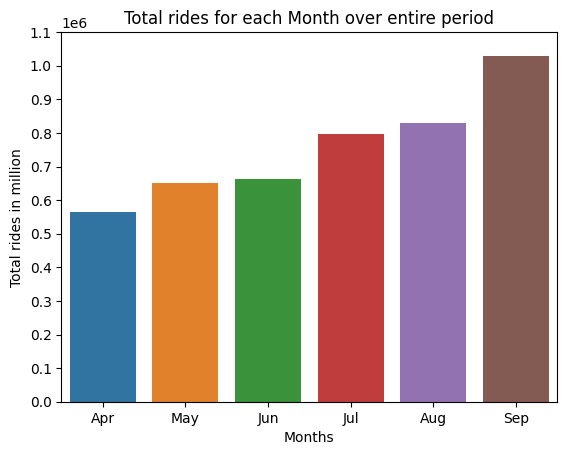

In [7]:
# Get and sort monthly ride counts
monthly_counts = data.Month.value_counts()
monthly_counts.sort_values(ascending=True, inplace=True)

# Make plot
sns.barplot(x=monthly_counts.index, y=monthly_counts.values)
plt.xlabel('Months')
plt.ylabel('Total rides in million')
plt.yticks(np.arange(0,1200000, 100000))
plt.title('Total rides for each Month over entire period')
plt.show()

In [8]:
weekly_rides = data.groupby(['Week of year'])['Rides'].sum()

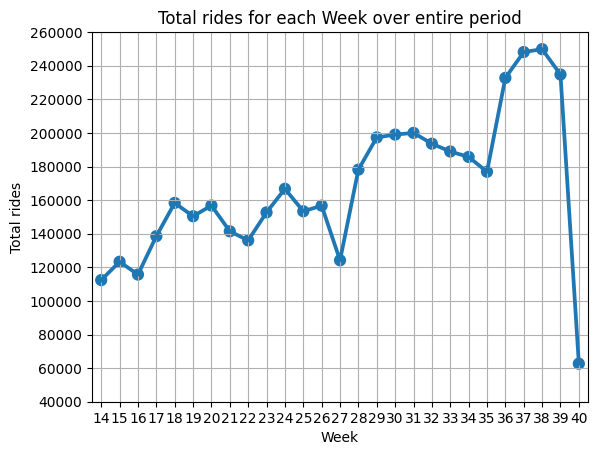

In [9]:
# Make plot
sns.pointplot(x=weekly_rides.index, y=weekly_rides.values)
plt.xlabel('Week')
plt.ylabel('Total rides')
plt.yticks(np.arange(40000,270000, 20000))
plt.title('Total rides for each Week over entire period')
plt.grid()
plt.show()

week 40 was not complete and the data ends on the tuesday, therefore we do not have enough data to complete the month and will drop this week. We also have to take a look at week 27 to try and see what happened there.

In [10]:
data.drop(data.index[data['Week of year'] == 40], inplace=True)

In [11]:
# Get data for week 27
week27 = data[data['Week of year']==27]

In [12]:
# View what month it was
week27.Month.unique()

array(['Jun', 'Jul'], dtype=object)

In [13]:
# View the day of months
week27.Day.value_counts().sort_index()

1     21228
2     26480
3     21597
4     14148
5     10890
6     11443
30    18395
Name: Day, dtype: int64

From the above information it is clear that during the 4th - 6th of July the amount of rides was really low. When searching google for what happened on these days, it is apparent that the USA celebrated Independence day on the 4th of july which was a Friday, then the 5th and 6th of July was Saturday and Sunday when the majority of NYC celebrated their Independence day. Therefore we cannot ignore this data, and will simply have to take it as white noise.

The 'Bases' in the dataset are Uber's bases located in New York. Each uber pickup is affiliated with a TLC (Taxi and Limousine Commission) company base. 
https://github.com/shoninouye/DataVisualization_Uber_R

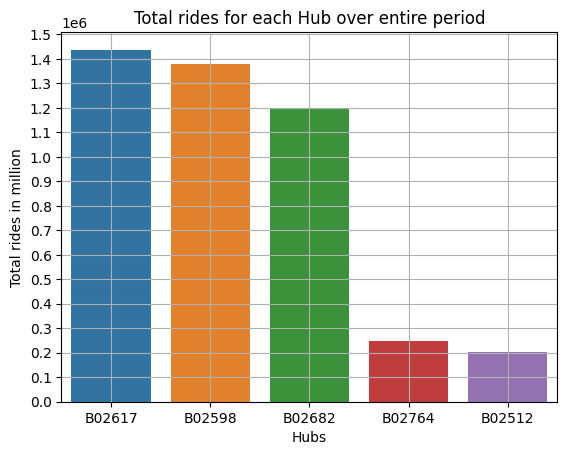

In [14]:
ride_counts = data.Base.value_counts()
sns.barplot(x=ride_counts.index, y=ride_counts.values)
plt.xlabel('Hubs')
plt.ylabel('Total rides in million')
plt.yticks(np.arange(0,1600000, 100000))
plt.title('Total rides for each Hub over entire period')
plt.grid()
plt.show()

In [15]:
# Create variable that has the total sum of each week of the entire period
week_of_year = data.groupby(['Base', 'Week of year'])['Rides'].sum().reset_index()

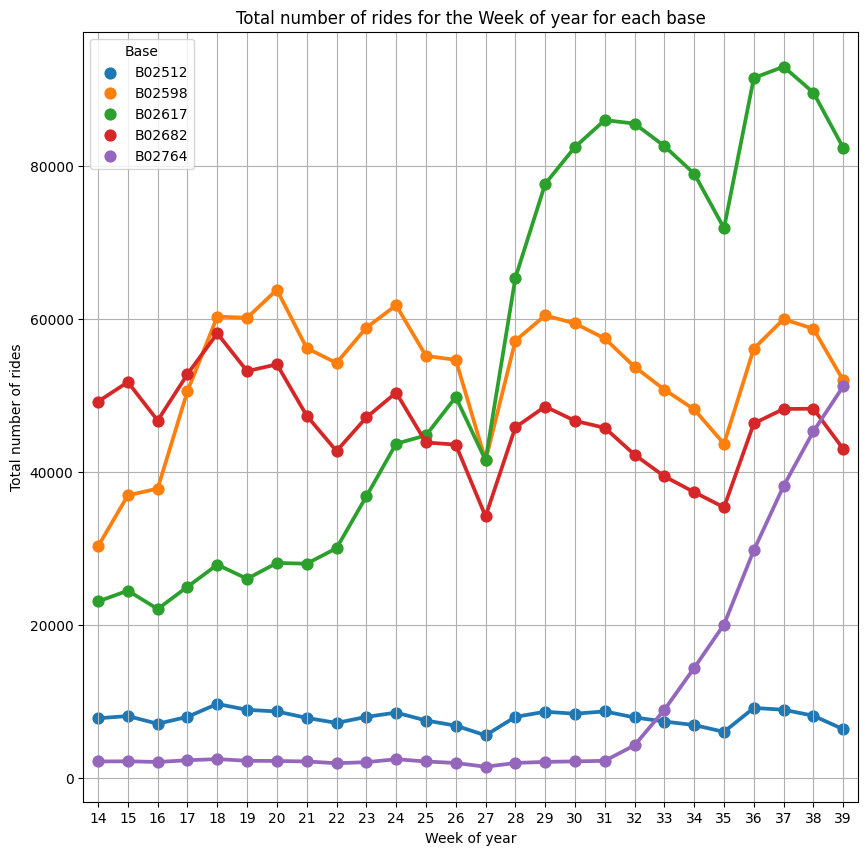

In [16]:
# Initialize figure
fig, ax = plt.subplots(figsize=(10,10))
# Specify graph
sns.pointplot(x='Week of year', y='Rides', hue='Base', data=week_of_year, ax=ax)
# Add details
plt.title('Total number of rides for the Week of year for each base')
plt.ylabel('Total number of rides')
# Show grid
plt.grid()
# Show figure
plt.show()

### Analysis on the 'Bases'

In [17]:
# Create variable that has the total sum of each day of the month
day_of_week = data.groupby(['Base', 'Day of Week'])['Rides'].sum().reset_index()

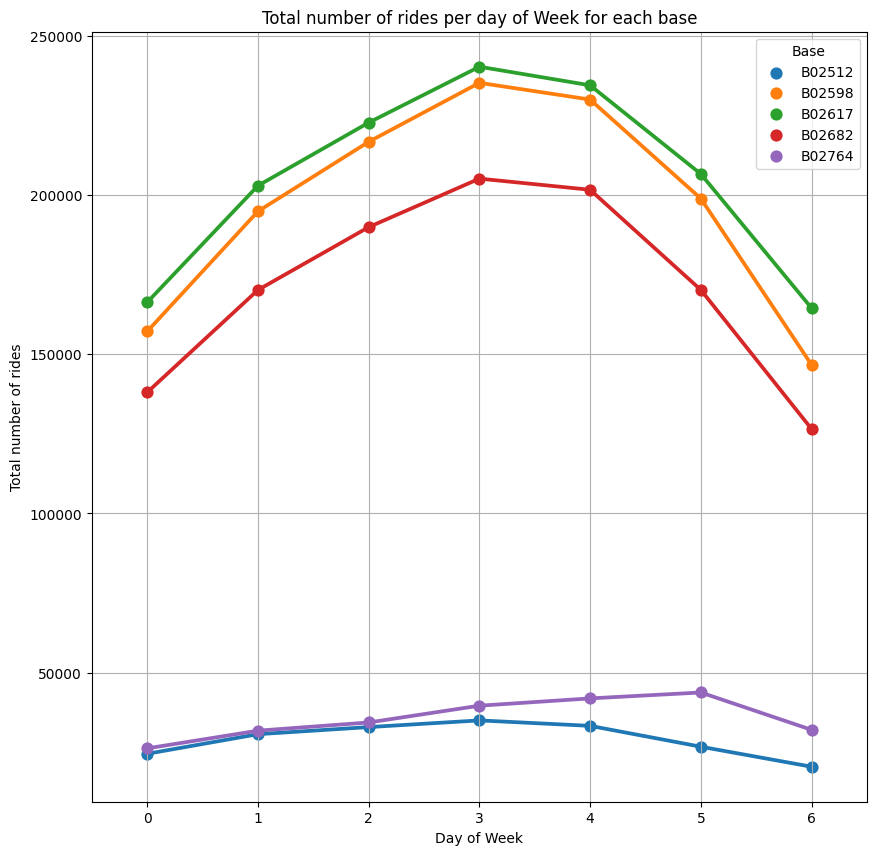

In [18]:
# Initialize figure
fig, ax = plt.subplots(figsize=(10,10))
# Specify graph
sns.pointplot(x='Day of Week', y='Rides', hue='Base', data=day_of_week, ax=ax)
# Add details
plt.title('Total number of rides per day of Week for each base')
plt.ylabel('Total number of rides')
# Show grid
plt.grid()
# Show figure
plt.show()

In [19]:
# Create variable containing total number of rides per hour over entire month for each base
hours = data.groupby(['Base', 'Hour'])['Rides'].sum().reset_index()

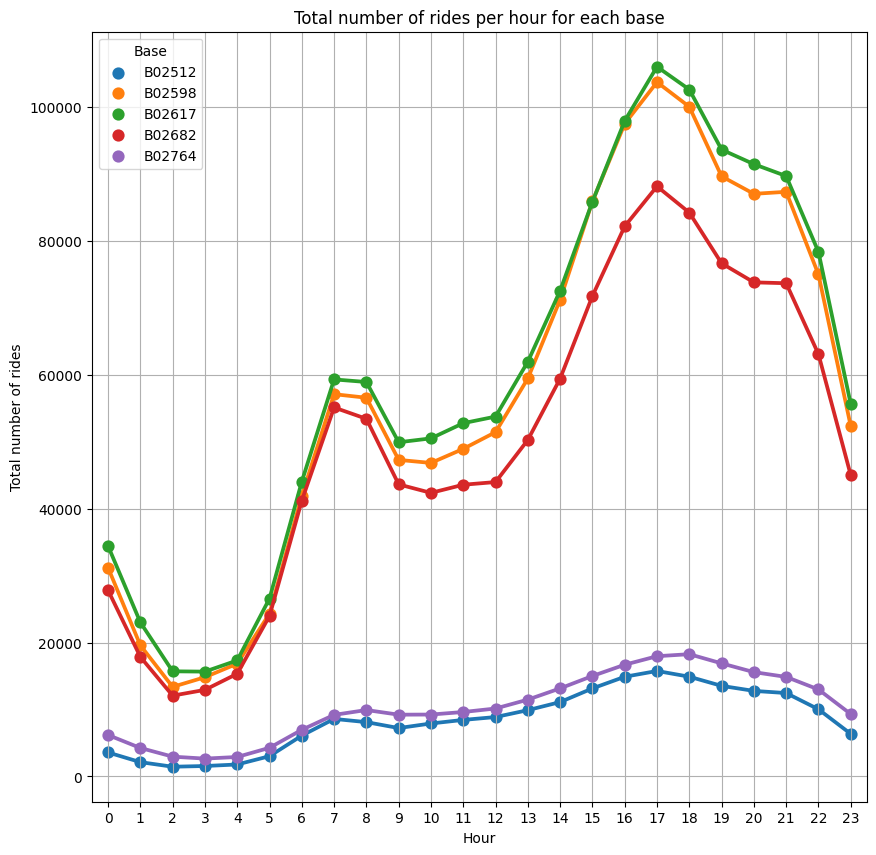

In [20]:
# Initialize figure
fig, ax = plt.subplots(figsize=(10,10))
# Specify graph
sns.pointplot(x='Hour', y='Rides', hue='Base', data=hours, ax=ax)
# Add details
plt.title('Total number of rides per hour for each base')
plt.ylabel('Total number of rides')
# Show grid
plt.grid()
# Show figure
plt.show()

### Weekdays vs Weekends

In [21]:
# Create variable containing total number of rides per hour over entire month for each base
total_week_hours = data[data['Day of Week'] < 5].groupby(['Hour'])['Rides'].sum().reset_index()
total_weekend_hours = data[data['Day of Week'] > 4].groupby(['Hour'])['Rides'].sum().reset_index()

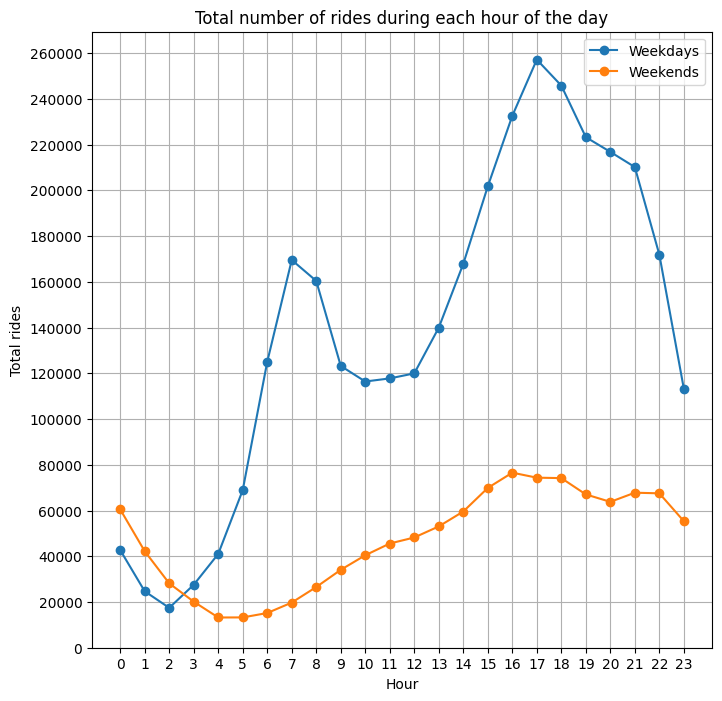

In [22]:
plt.figure(figsize=(8,8))

plt.plot(total_week_hours['Hour'], total_week_hours['Rides'], label='Weekdays', marker='o')
plt.plot(total_weekend_hours['Hour'], total_weekend_hours['Rides'], label='Weekends', marker='o')

plt.title('Total number of rides during each hour of the day')
plt.xlabel('Hour')
plt.ylabel('Total rides')
plt.xticks(np.arange(0,24,1))
plt.yticks(np.arange(0,261000,20000))
plt.legend()
plt.grid()
plt.show()

It is clear that there is a much higer need for rides during the week than the weekend. This is probably because we have 5 week days and only 2 days on the weekend. So in order to have a fair comparison, I will normalize the data by using a StandardScaler and replot it below.

In [23]:
# Initialize a Standard scaler.
sc = StandardScaler()
# Scale the data
total_week_hours['Rides'] = sc.fit_transform(total_week_hours[['Rides']])
total_weekend_hours['Rides'] = sc.fit_transform(total_weekend_hours[['Rides']])

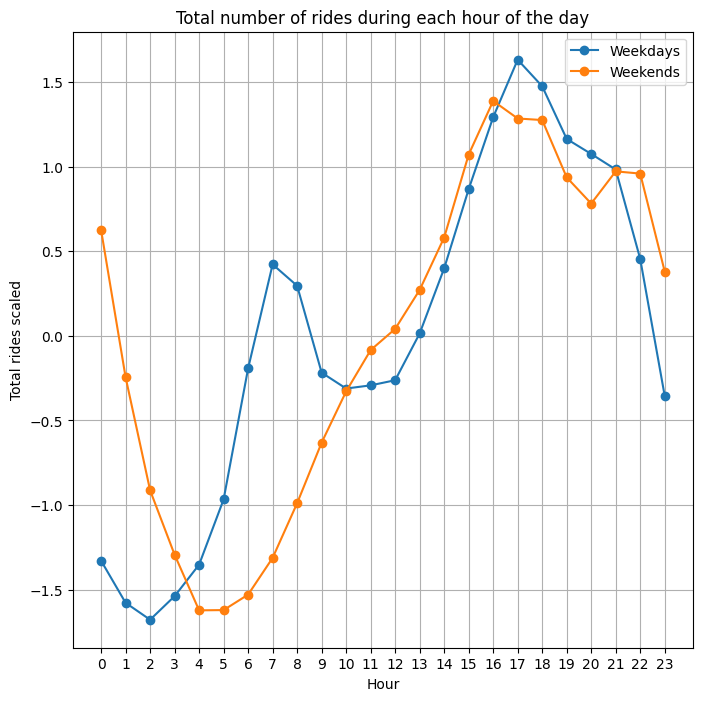

In [24]:
plt.figure(figsize=(8,8))

plt.plot(total_week_hours['Hour'], total_week_hours['Rides'], label='Weekdays', marker='o')
plt.plot(total_weekend_hours['Hour'], total_weekend_hours['Rides'], label='Weekends', marker='o')

plt.title('Total number of rides during each hour of the day')
plt.xlabel('Hour')
plt.ylabel('Total rides scaled')
plt.xticks(np.arange(0,24,1))
plt.legend()
plt.grid()
plt.show()

It is clear that weekend rides are much more during the hours of 10 pm and 1 am, where as weekday rides are much higher during the hours of 5 am - 8 am. Both Weekdays and Weekends have a daily peak at around 4 pm - 6 pm.

In [25]:
# Create variable containing total number of rides per hour over entire month for each base
week_hours = data[data['Day of Week'] < 5].groupby(['Base', 'Hour'])['Rides'].sum().reset_index()

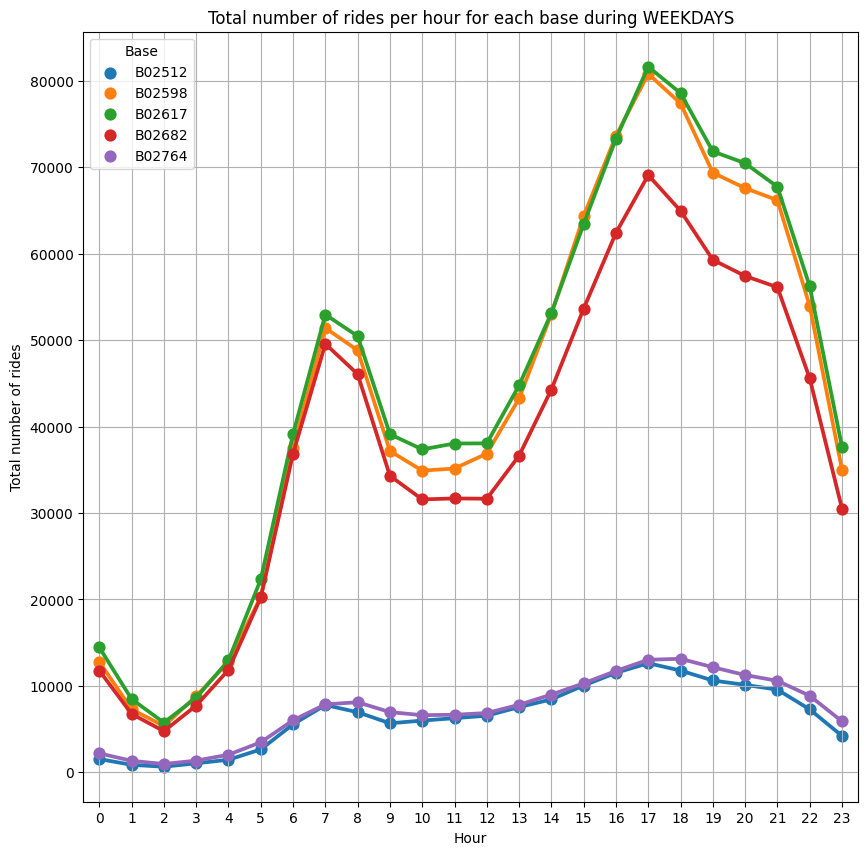

In [26]:
# Initialize figure
fig, ax = plt.subplots(figsize=(10,10))
# Specify graph
sns.pointplot(x='Hour', y='Rides', hue='Base', data=week_hours, ax=ax)
# Add details
plt.title('Total number of rides per hour for each base during WEEKDAYS')
plt.ylabel('Total number of rides')
# Show grid
plt.grid()
# Show figure
plt.show()

During the weekdays it is clear that there is an increase in teh number of rides from 5am-8am and again from 3pm-9pm

In [27]:
# Create variable containing total number of rides per hour over entire month for each base
weekend_hours = data[data['Day of Week'] > 4].groupby(['Base', 'Hour'])['Rides'].sum().reset_index()

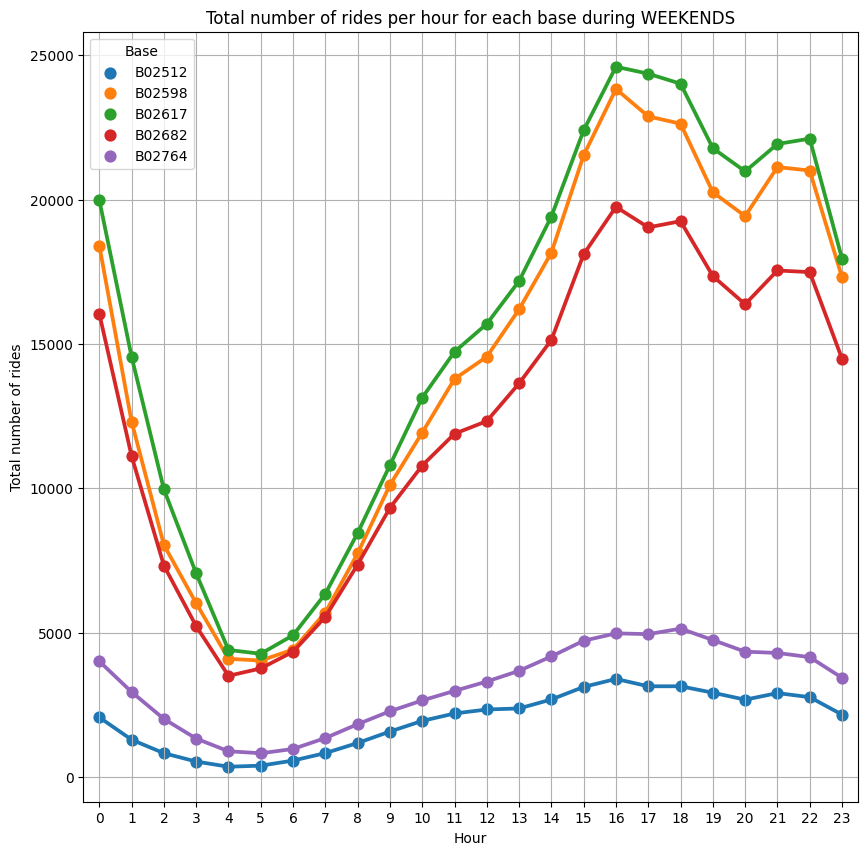

In [28]:
# Initialize figure
fig, ax = plt.subplots(figsize=(10,10))
# Specify graph
sns.pointplot(x='Hour', y='Rides', hue='Base', data=weekend_hours, ax=ax)
# Add details
plt.title('Total number of rides per hour for each base during WEEKENDS')
plt.ylabel('Total number of rides')
# Show grid
plt.grid()
# Show figure
plt.show()

Whilst on Weekends there is an overal increase from 2pm-12pm

***

## Clustering

For the clustering of the data I used the Kmeans clustering algorithm since it is an Unsupervised machine learning method, which is perfect for our situation since we might never know which data entry belongs to which cluster. 

In [29]:
# Create dataset for clustering
X = data[['Lat', 'Lon']].copy()
# Transfrom dataframe to expand values so it will be easier for clustering, instead of 40.17 degrees it is 4017 degrees.
X = X *1000

X.head()

,Lat,Lon
0,40769.0,-73954.9
1,40726.7,-74034.5
2,40731.6,-73987.3
3,40758.8,-73977.6
4,40759.4,-73972.2


Fit the model to make 10 clusters, as desribed in the project description

In [30]:
kmeans = KMeans(n_clusters=10, random_state=42)
kmeans.fit(X)

C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=10, random_state=42)

Predict the clusters

In [31]:
clusters = kmeans.predict(X)
clusters

array([5, 9, 9, ..., 4, 3, 3])

In [32]:
data['Cluster'] = clusters

In [33]:
data.head()

,Date/Time,Lat,Lon,Base,Rides,Date,Hour,Day,Day of Week,Day of year,Week of year,Month,Quarter,Cluster
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,1,2014-04-01,0,1,1,91,14,Apr,2,5
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,1,2014-04-01,0,1,1,91,14,Apr,2,9
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,1,2014-04-01,0,1,1,91,14,Apr,2,9
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,1,2014-04-01,0,1,1,91,14,Apr,2,1
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,1,2014-04-01,0,1,1,91,14,Apr,2,1


In [34]:
cluster_weeks = data.groupby(['Cluster', 'Week of year'])['Rides'].sum().reset_index()
cluster_hours = data.groupby(['Cluster', 'Hour'])['Rides'].sum().reset_index()

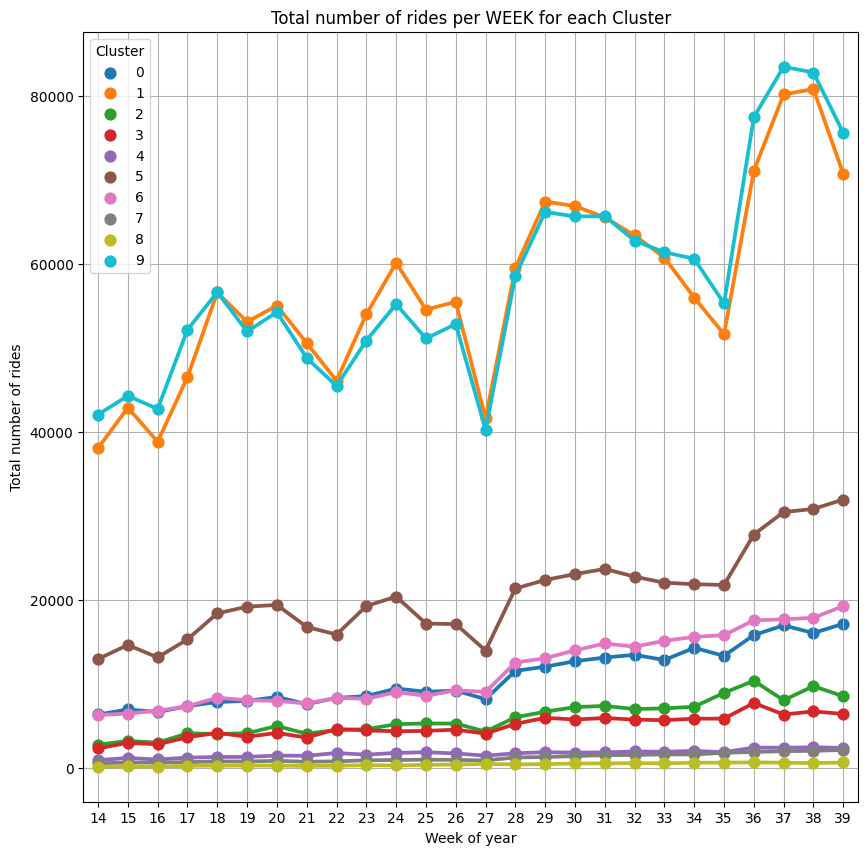

In [35]:
# Initialize figure
fig, ax = plt.subplots(figsize=(10,10))
# Specify graph
sns.pointplot(x='Week of year', y='Rides', hue='Cluster', data=cluster_weeks, ax=ax)
# Add details
plt.title('Total number of rides per WEEK for each Cluster')
plt.ylabel('Total number of rides')
# Show grid
plt.grid()
# Show figure
plt.show()

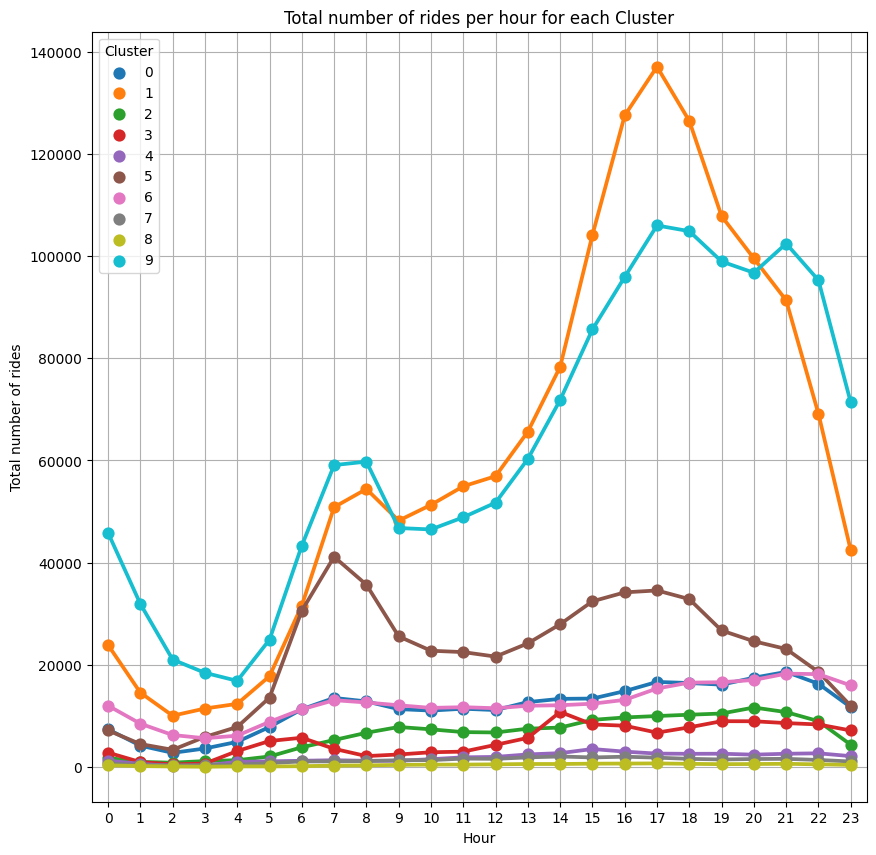

In [36]:
# Initialize figure
fig, ax = plt.subplots(figsize=(10,10))
# Specify graph
sns.pointplot(x='Hour', y='Rides', hue='Cluster', data=cluster_hours, ax=ax)
# Add details
plt.title('Total number of rides per hour for each Cluster')
plt.ylabel('Total number of rides')
# Show grid
plt.grid()
# Show figure
plt.show()

We can see that there are 3 clusters that have a lot more rides than the rest, these clusters are as follows:

orange - Midtown

blue - lower Manhatten

brown - central Manhatten

***

### Check for seasonality

In [37]:
# What our dataframe looks like now
data

,Date/Time,Lat,Lon,Base,Rides,Date,Hour,Day,Day of Week,Day of year,Week of year,Month,Quarter,Cluster
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,1,2014-04-01,0,1,1,91,14,Apr,2,5
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,1,2014-04-01,0,1,1,91,14,Apr,2,9
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,1,2014-04-01,0,1,1,91,14,Apr,2,9
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,1,2014-04-01,0,1,1,91,14,Apr,2,1
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,1,2014-04-01,0,1,1,91,14,Apr,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4520329,2014-09-28 23:57:00,40.6447,-73.7821,B02764,1,2014-09-28,23,28,6,271,39,Sep,3,3
4520330,2014-09-28 23:57:00,40.7513,-73.9941,B02764,1,2014-09-28,23,28,6,271,39,Sep,3,1
4520331,2014-09-28 23:57:00,40.6875,-74.1824,B02764,1,2014-09-28,23,28,6,271,39,Sep,3,4
4520332,2014-09-28 23:57:00,40.6482,-73.7823,B02764,1,2014-09-28,23,28,6,271,39,Sep,3,3


We resample the data to get the total number of rides for each hour, since we are interested in the hourly number of rides, over the entire dataset and then check for the seasonalities.

In [38]:
resample_df = data.copy()
resample_df.set_index('Date/Time', inplace=True)
hourly_rides = resample_df.resample('H')['Rides'].sum().reset_index()

In [39]:
hourly_rides['Hour'] = hourly_rides['Date/Time'].dt.hour
hourly_rides['Day of week'] = hourly_rides['Date/Time'].dt.dayofweek
hourly_rides['Week of year'] = hourly_rides['Date/Time'].dt.isocalendar().week

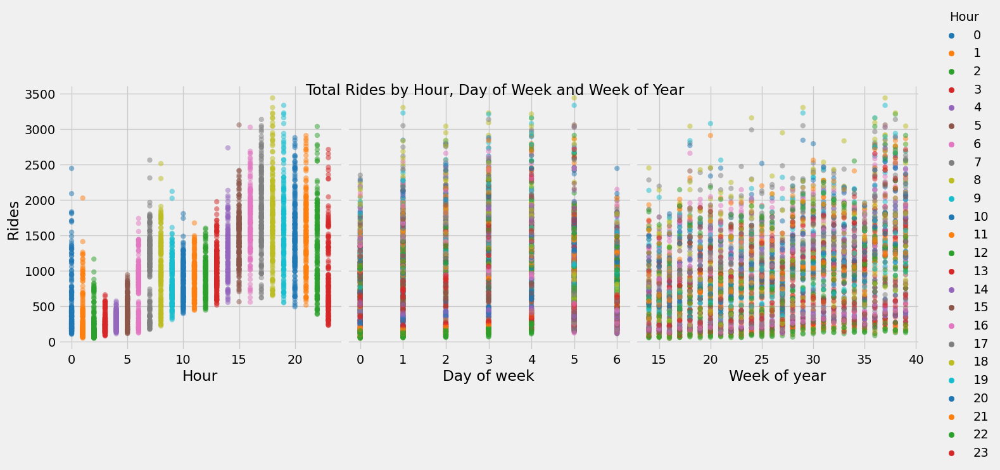

In [40]:
plt.style.use('fivethirtyeight')
sns.pairplot(hourly_rides,
             hue='Hour',
             x_vars=['Hour','Day of week','Week of year'],
             y_vars='Rides',
             height=5,
             palette='tab10',
             plot_kws={'alpha':0.5, 'linewidth':0}
            )
plt.suptitle('Total Rides by Hour, Day of Week and Week of Year')
plt.show()

There seems to be a daily pattern based on the hours, and a Weekly pattern based on the days of the week, however there does not seem to be any other patterns.

To visualize this more, I will create a plot using Statsmodels library to showcase these multiple seasonalities.

In [41]:
hourly_rides = hourly_rides[['Rides', 'Date/Time']]

In [42]:
hourly_rides.set_index('Date/Time', inplace=True)

In [43]:
stl_kwargs = {"seasonal_deg": 0} 
multiple_decompose = MSTL(hourly_rides, periods=(24, 24 * 7), stl_kwargs=stl_kwargs)
res = multiple_decompose.fit()

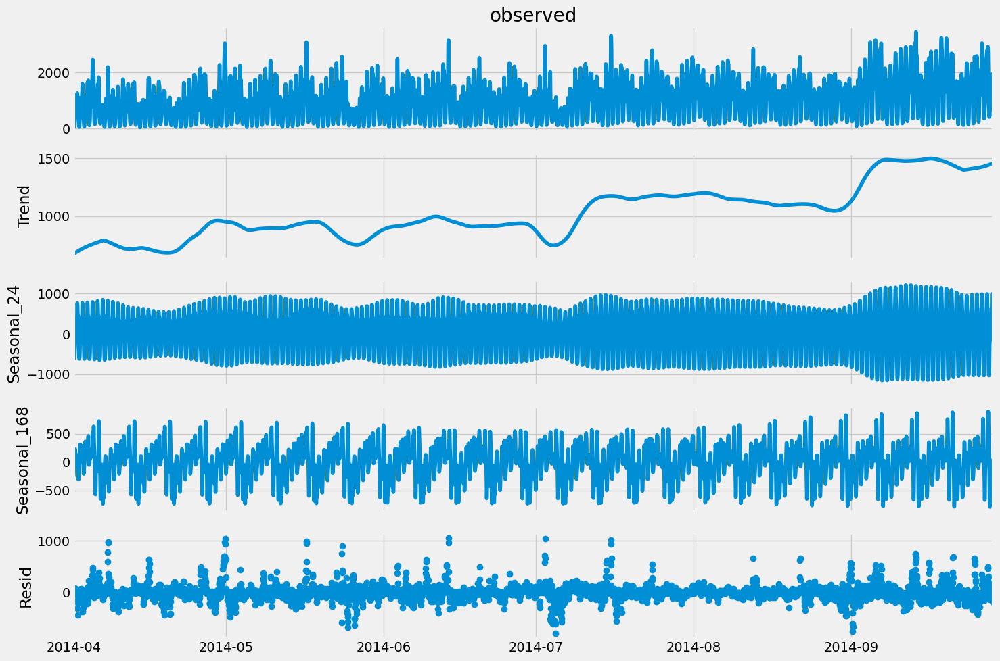

In [44]:
fig = res.plot()

fig.set_size_inches((15, 10))
fig.tight_layout()
plt.show()

We can also clearly see the daily seasonal pattern using the autocorrelation, which shows us a clear pattern that is repeating.

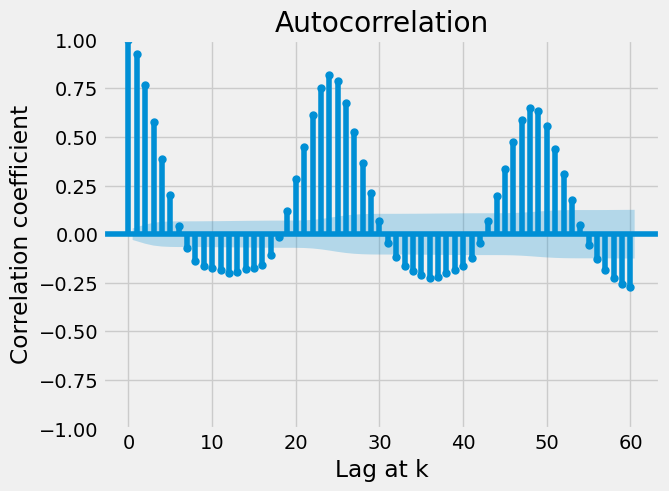

In [45]:
# Stands for Time Series Analysis Plots (TSA Plots)
fig = tsaplots.plot_acf(hourly_rides['Rides'], lags=60)

plt.xlabel("Lag at k")
plt.ylabel("Correlation coefficient")
plt.show()

The plot shows daily seasonality, each lag is one hour. Every 24th lag is therefore 1 day.

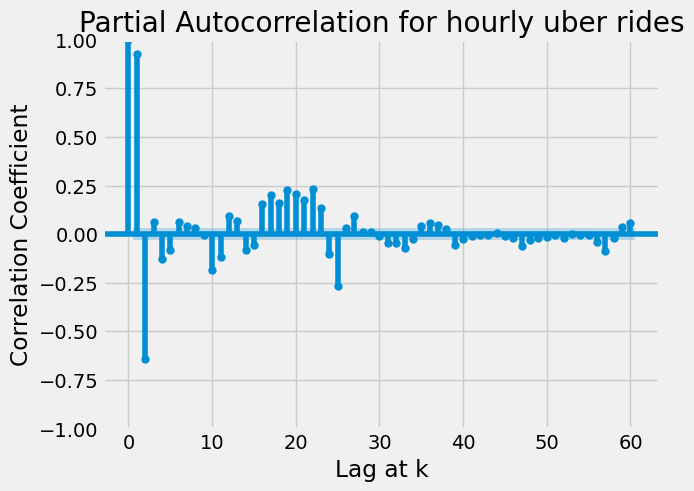

In [46]:
fig = tsaplots.plot_pacf(hourly_rides['Rides'], lags=60)

plt.title("Partial Autocorrelation for hourly uber rides")
plt.xlabel("Lag at k")
plt.ylabel("Correlation Coefficient")
plt.show();

***

## Modeling

Since we have multiple seasons, daily and weekly, we cannot use the SARIMAX model, as it can only model 1 season. I have tried to use SARIMAX on multiple seasons but the results was extremely poor with the AIC:55494.26974610727.

instead we will try BATS, Tbats, FBprophet and XGboost

The Dataset is non-stationary, since we do not have a constant mean or variance as we saw in the above plots, meaning that the mean and variance of the observations change over time. This makes it difficult to model by both classical statistical methods like arima and more sophisticated models like neural networks. This is caused by an increasing trend and a seasonality component.

The data is split in such a way where our testing data to which we will compare the predictions is only based on the last week, or last 168 hours of the data

### Baseline model

A simple baseline model would be to just repeat the total rides from the last week of our training data.

### MAPE

We now compute an error metric to determine the best model and compare their performance. In this case, we use the mean absolute percentage error (MAPE), for its ease of interpretation. Recall that the closer the MAPE is to 0, the better the performance.

### MAE

i will use the Mean absolute error to see how close the predictiions are to the actuals, we want this value to also be as close to 0 as possible. I will select the best model based on this prediction MAE score.

### Box-Cox

Since we do not have stationary time series data, I will use the Box-Cox transformation to transform the data, which will give it a constant mean and constant variance. In order to avoid arrors I will add 1 ride to the total of each hour, and then remove it agian when predicting, to ensure accurate predictioins.

***

## Models

In [64]:
def best_model(df, i):
    #---------------------------------------------------------------------------------------------------------------------#
    
    # Get data from user specified cluster
    df = df[df['Cluster'] == i]
    
    # Aggregate data on hourly level
    resample_df = df.copy()
    resample_df.set_index('Date/Time', inplace=True)
    hourly_rides = resample_df.resample('H')['Rides'].sum().reset_index().set_index('Date/Time')
    
    # Make sure that date range is correct and fill missing values, when hours might be missing, with the average.
    hourly_rides = hourly_rides.reindex(pd.date_range(start='2014-04-01 00:00:00', end='2014-09-28 22:00:00', freq='1H')).fillna(hourly_rides['Rides'].mean())
    
    # Boxcox transformation
    hourly_rides['Rides'], lv = boxcox(hourly_rides['Rides']+1)
    print(f'Data has been transformed with Boxcox, lambda value is : {lv}')
    
    # Data split
    # Data is split in such a way where our testing data to which we will compare the predictions is only based on 
    # the last week or last 168 hours of the data
    train_data = hourly_rides.iloc[:-168]
    test_data = hourly_rides.iloc[-168:]
    
    #---------------------------------------------------------------------------------------------------------------------#
     
    # Baseline Model
    # We start by creating the baseline model, using the previous week's values as our forecasting.
    # A simple baseline model would be to just repeat the total rides from the last week of our training data.
    y_pred_baseline = train_data[-168:].values
    baseline_df = pd.DataFrame(y_pred_baseline, index=test_data.index, columns=['Rides'])

    # Visualize how well the Baseline model fits our testing data
    fig, ax = plt.subplots(figsize=(14,8))
    ax.plot(train_data[-250:], '-', label='Train')
    ax.plot(test_data, '--', label='Test')
    ax.plot(baseline_df, '-', label='Baseline')
    plt.legend(loc='best')
    plt.show()

    # Get MAPE score
    mape_baseline = mean_absolute_percentage_error(test_data['Rides'], baseline_df['Rides'])
    print(f'MAPE from baseline: {mape_baseline}')
    # Get MAE
    mae_baseline = mean_absolute_error(test_data['Rides'], baseline_df['Rides'])
    print(f'MAE from baseline: {mae_baseline}')
    

    #---------------------------------------------------------------------------------------------------------------------#

    # TBATS using the tbats library
    # Since we have hourly data, and a Daily and Weekly seasonal pattern, I am using 24, as the daily pattern,
    # and 168 as the weekly pattern.
    estimator = TBATS(seasonal_periods=(24, 168))
    tbats_model = estimator.fit(train_data)

    # Make Predictions
    tbats_predictions = tbats_model.forecast(steps=168)
    # Create a DF from the predictions
    tbats_df = pd.DataFrame(tbats_predictions, index=test_data.index, columns=['Rides'])

    # Visualize data
    fig, ax = plt.subplots(figsize=(14,8))
    ax.plot(train_data[-250:], '-', label='Train')
    ax.plot(test_data, '--', label='Test')
    ax.plot(tbats_df, '-', label='TBATS Predictions')
    plt.legend(loc='best')
    plt.show()

    # Get MAPE score
    mape_TBATS = mean_absolute_percentage_error(test_data['Rides'], tbats_df['Rides'])
    print(f'MAPE from TBATS: {mape_TBATS}')
    # Get MAE
    mae_TBATS = mean_absolute_error(test_data['Rides'], tbats_df['Rides'])
    print(f'MAE from TBATS: {mae_TBATS}')
    
    #---------------------------------------------------------------------------------------------------------------------#

    # BATS using sktime library
    # Create array of future predictions that we want. In this case we want to predict the next week, which is 168 hours
    fh = np.arange(1, test_data.size+1)

    # Create BATS Model 
    bats_forecaster = skBATS(use_box_cox=False,
                      use_trend=False, # Since we used Box-Cox transformation at the start, we have a constant mean and no trend
                      use_damped_trend=False,
                      sp=[24, 168])# SP = seasonal period, 24  = Daily, 168 = Weekly

    # Create forecasts
    bats_forecaster.fit(train_data)
    y_pred_BATS = bats_forecaster.predict(fh)

    # Visualize data
    fig, ax = plt.subplots(figsize=(14,8))
    ax.plot(train_data[-250:], '-', label='Train')
    ax.plot(test_data, '--', label='Test')
    ax.plot(y_pred_BATS, '-', label='skBATS Predictions')
    plt.legend(loc='best')
    plt.show()

    # Get MAPE score
    mape_skBATS = mean_absolute_percentage_error(test_data['Rides'], y_pred_BATS['Rides'])
    print(f'MAPE from skBATS: {mape_skBATS}')
    # Get MAE
    mae_skBATS = mean_absolute_error(test_data['Rides'], y_pred_BATS['Rides'])
    print(f'MAE from skBATS: {mae_skBATS}')
    

    #---------------------------------------------------------------------------------------------------------------------#

    # TBATS using sktime library
    # Create model
    tbats_forecaster = skTBATS(use_box_cox=False,
                       use_trend=False,
                       use_damped_trend=False,
                       sp=[24, 168]) # SP = seasonal period, 24  = Daily, 168 = Weekly

    # Forecast the data
    tbats_forecaster.fit(train_data)
    y_pred_TBATS = tbats_forecaster.predict(fh)

    # Visualize data
    fig, ax = plt.subplots(figsize=(14,8))
    ax.plot(train_data[-250:], '-', label='Train')
    ax.plot(test_data, '--', label='Test')
    ax.plot(y_pred_TBATS, '-', label='skTBATS Predictions')
    plt.legend(loc='best')
    plt.show()

    # Get MAPE score
    mape_skTBATS = mean_absolute_percentage_error(test_data['Rides'], y_pred_TBATS['Rides'])
    print(f'MAPE from skTBATS: {mape_skTBATS}')
    # Get MAE
    mae_skTBATS = mean_absolute_error(test_data['Rides'], y_pred_TBATS['Rides'])
    print(f'MAE from skTBATS: {mae_skTBATS}')

    #---------------------------------------------------------------------------------------------------------------------#

    # XGBoost
    # Make copy of data
    xg_data = hourly_rides.copy()
    
    # Perform transformations in order to get it into the right format
    xg_data.reset_index(inplace=True)
    xg_data['Date/Time'] = pd.to_datetime(xg_data['index'])
    xg_data['hour'] = xg_data['Date/Time'].dt.hour
    xg_data['dayofweek'] = xg_data['Date/Time'].dt.dayofweek
    xg_data['quarter'] = xg_data['Date/Time'].dt.quarter
    xg_data['month'] = xg_data['Date/Time'].dt.month
    xg_data['dayofyear'] = xg_data['Date/Time'].dt.dayofyear
    xg_data['dayofmonth'] = xg_data['Date/Time'].dt.day
    xg_data['weekofyear'] = (xg_data['Date/Time'].dt.isocalendar().week).astype(int)
    xg_data.drop(columns=['index'], inplace=True)
    xg_data.set_index('Date/Time', inplace=True)
    
    # Create training and testing datasets
    X, y = xg_data.iloc[:, 1:], xg_data[['Rides']]
    X_train, y_train = X[:-168], y[:-168]
    X_test, y_test = X[-168:], y[-168:]


    reg = xgb.XGBRegressor(n_estimators=1000)
    reg.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)],early_stopping_rounds=50,
           verbose=False) # Change verbose to True if you want to see it train

    # Make predictions
    xg_predictions = reg.predict(X_test)
    xg_predictions_df = pd.DataFrame(xg_predictions, index=test_data.index, columns=['Rides'])

    # Visualize prediction data
    fig, ax = plt.subplots(figsize=(14,8))
    ax.plot(train_data[-250:], '-', label='Train')
    ax.plot(test_data, '--', label='Test')
    ax.plot(xg_predictions_df, '-', label='XGB Predictions')
    plt.legend(loc='best')
    plt.show()

    # Get MAPE score
    mape_xgb = mean_absolute_percentage_error(test_data['Rides'], xg_predictions_df['Rides'])
    print(f'MAPE from XGB: {mape_xgb}')
    # Get MAE
    mae_xgb = mean_absolute_error(test_data['Rides'], xg_predictions_df['Rides'])
    print(f'MAE from XGB: {mae_xgb}')

    #---------------------------------------------------------------------------------------------------------------------#

    # FB prophet
    fb_train, fb_test = train_data.copy(), test_data.copy()

    # Transform dataframe into correct shape and column names for FB prophet
    fb_train.reset_index(inplace=True)
    fb_train = fb_train.rename(columns={'index':'ds', 'Rides':'y'})

    fb_test.reset_index(inplace=True)
    fb_test = fb_test.rename(columns={'index':'ds', 'Rides':'y'})

    # Initialize and train model
    fb_model = Prophet(daily_seasonality=8, weekly_seasonality=True, yearly_seasonality=False,
                      growth='linear', seasonality_mode='multiplicative')
    fb_model.add_country_holidays(country_name='US')
    fb_model.add_seasonality(name='monthly', period=30.5, fourier_order=8)
    fb_model.fit(fb_train)

    # Make predictions
    fb_predictions = fb_model.predict(fb_test)

    # Plot the forecast with the actuals
    f, ax = plt.subplots(1)
    f.set_figheight(5)
    f.set_figwidth(10)
    ax.scatter(test_data.index, fb_test['y'], color='r', label='Actual')
    fig = fb_model.plot(fb_predictions, ax=ax)
    ax.set_xbound(lower=pd.to_datetime('2014-09-15'),upper=pd.to_datetime('2014-09-29'))
    ax.set_ylim(0, hourly_rides['Rides'].max())
    plt.legend()
    plot = plt.suptitle('Forecast vs Actuals')

    # Get MAPE score
    fb_predictions_df = fb_predictions['yhat'].to_frame()
    fb_predictions_df.set_index(test_data.index, inplace=True)
    mape_FBprophet = mean_absolute_percentage_error(test_data['Rides'], fb_predictions_df['yhat'])
    print(f'MAPE from FB prophet: {mape_FBprophet}')
    # Get MAE
    mae_FBprophet = mean_absolute_error(test_data['Rides'], fb_predictions_df['yhat'])
    print(f'MAE from FB prophet: {mae_FBprophet}')

    #---------------------------------------------------------------------------------------------------------------------#
    
    # Barplot of Different MAPE values for each model
    fig, ax = plt.subplots()
    x = ['Baseline', 'TBATS',  'skBATS', 'skTBATS', 'XGB', 'FBprophet']
    y = [mape_baseline, mape_TBATS, mape_skBATS, mape_skTBATS, mape_xgb, mape_FBprophet]
    ax.bar(x, y, width=0.4)
    ax.set_xlabel('Models')
    ax.set_ylabel('MAPE (%)')
    ax.set_ylim(0, max(y))
    for index, value in enumerate(y):
        ax.text(x=index, y=value, s=str(round(value,2)), ha='center')
    fig.tight_layout()
    
    #---------------------------------------------------------------------------------------------------------------------#
    
    # Barplot of Different MAE values for each model
    fig, ax = plt.subplots()
    x = ['Baseline', 'TBATS',  'skBATS', 'skTBATS', 'XGB', 'FBprophet']
    y = [mae_baseline, mae_TBATS, mae_skBATS, mae_skTBATS, mae_xgb, mae_FBprophet]
    ax.bar(x, y, width=0.4)
    ax.set_xlabel('Models')
    ax.set_ylabel('MAE')
    ax.set_ylim(0, max(y))
    for index, value in enumerate(y):
        ax.text(x=index, y=value, s=str(round(value,2)), ha='center')
    fig.tight_layout()

## Cluster 0 modeling:

Data has been transformed with Boxcox, lambda value is : 0.388887927453602


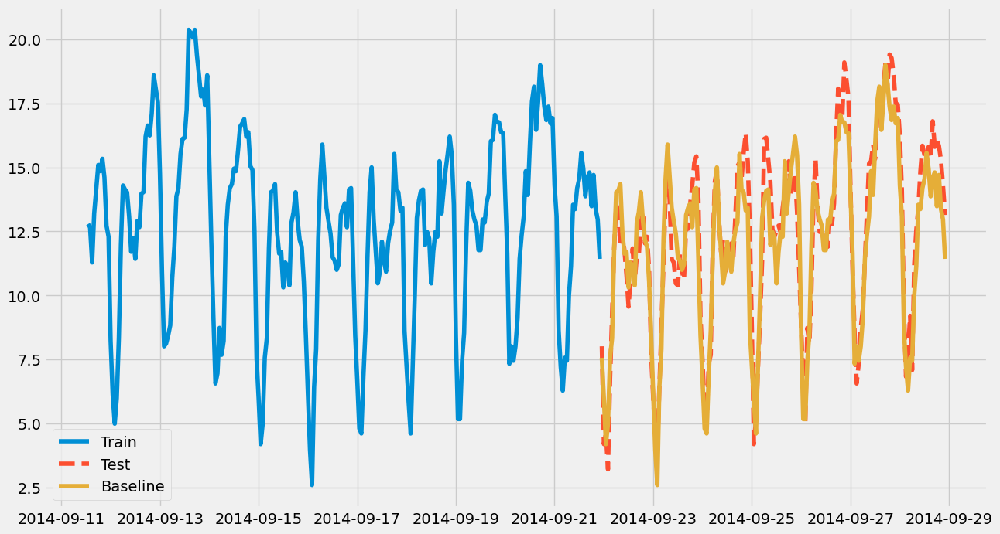

MAPE from baseline: 0.08715298371369619
MAE from baseline: 0.9825365027951802


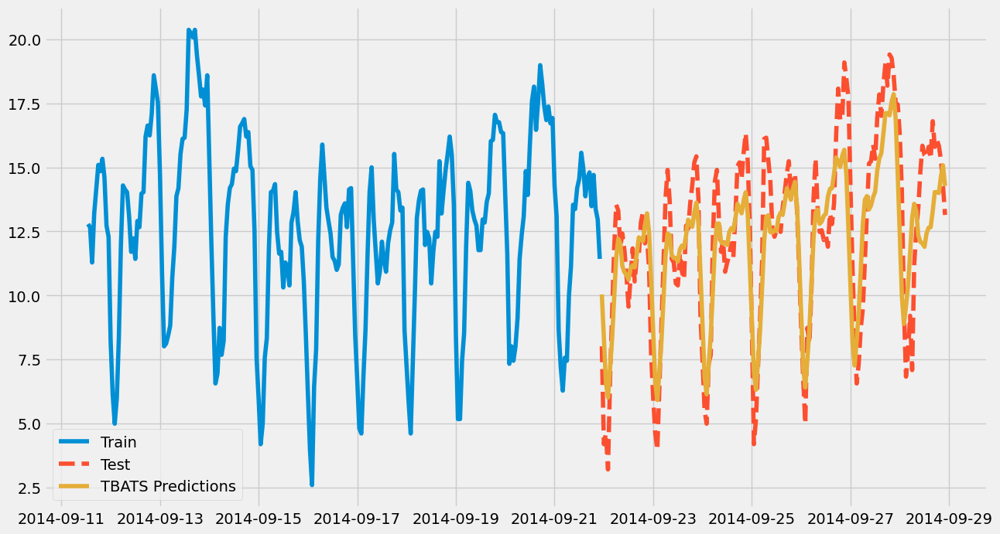

MAPE from TBATS: 0.13897574372811222
MAE from TBATS: 1.493428470109021


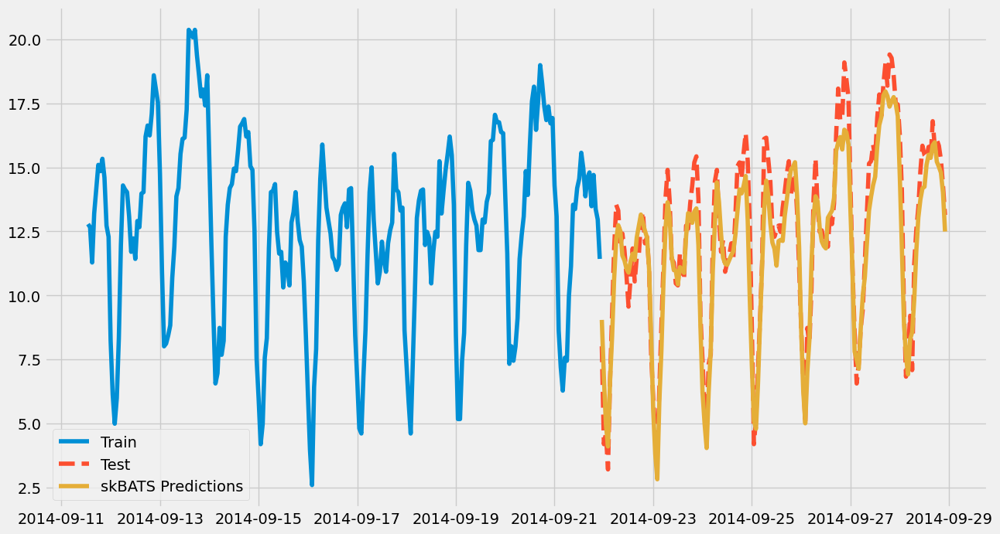

MAPE from skBATS: 0.07409372966120606
MAE from skBATS: 0.8433998033942027


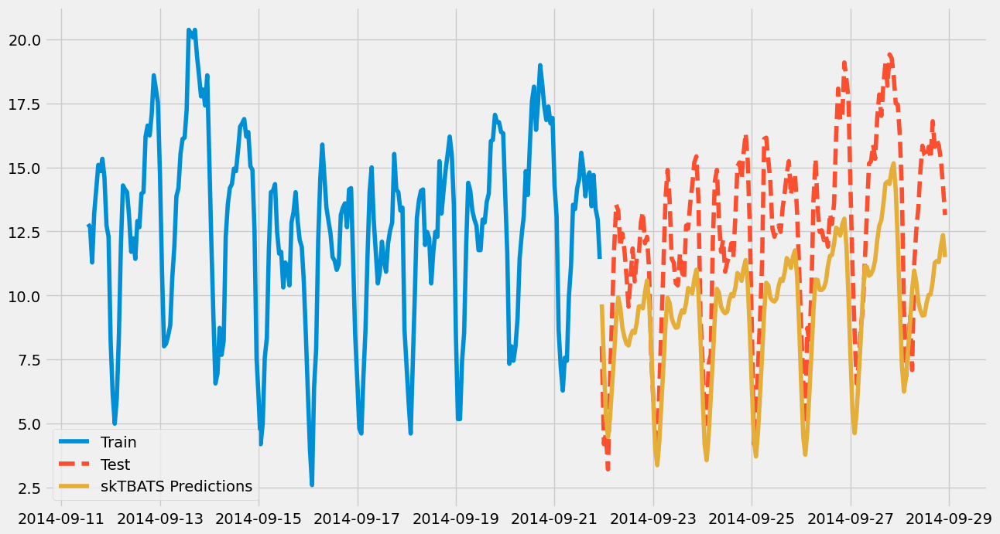

MAPE from skTBATS: 0.24611935751794012
MAE from skTBATS: 3.12780051053809


C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


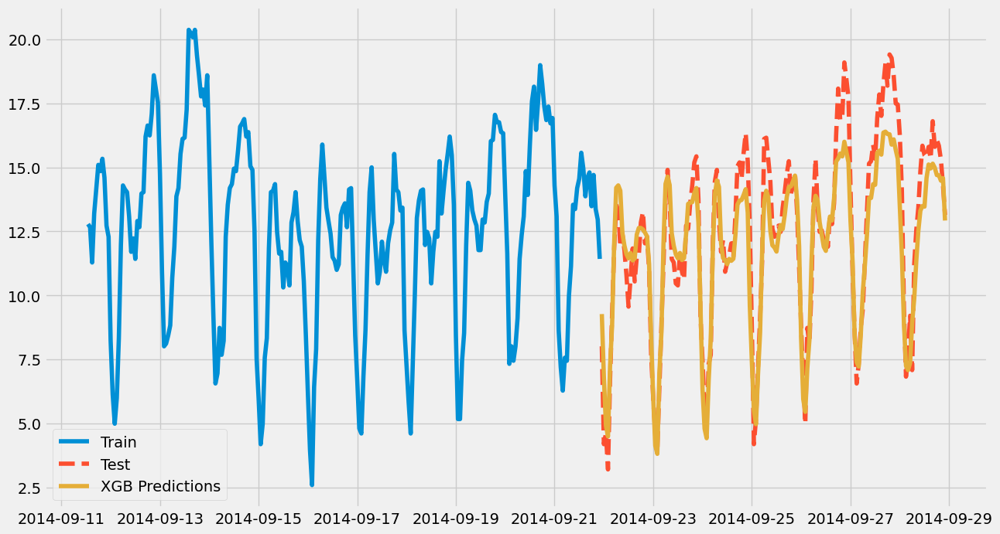

MAPE from XGB: 0.0811276472635393
MAE from XGB: 0.9713562254692857


C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

MAPE from FB prophet: 0.13110556929268669
MAE from FB prophet: 1.412199891123107


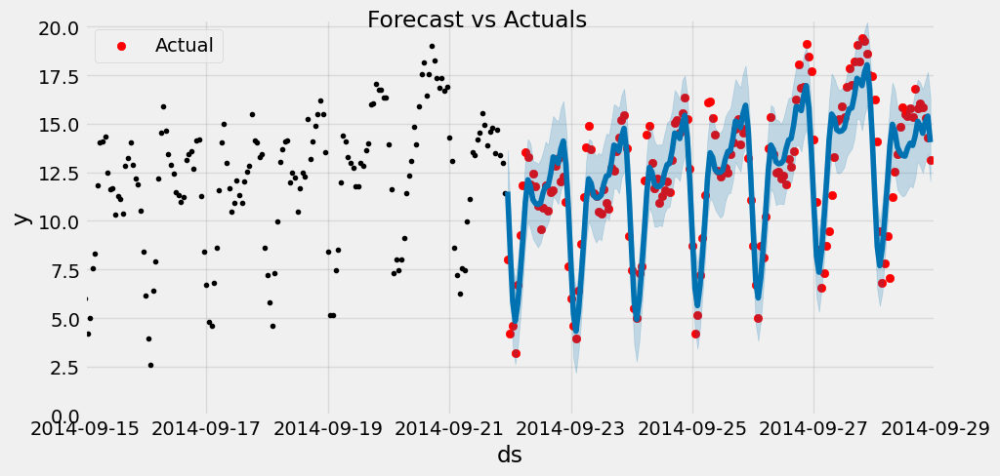

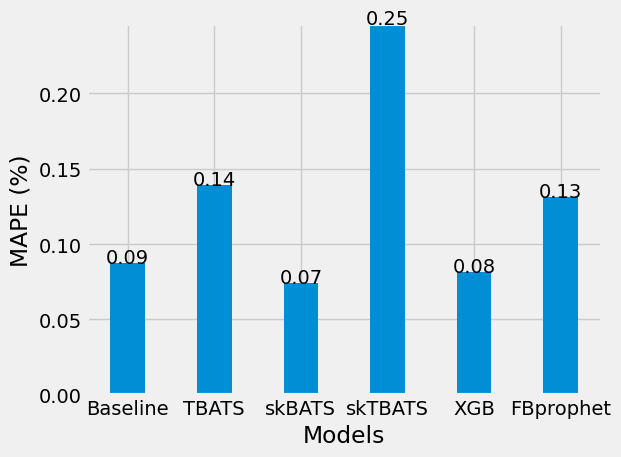

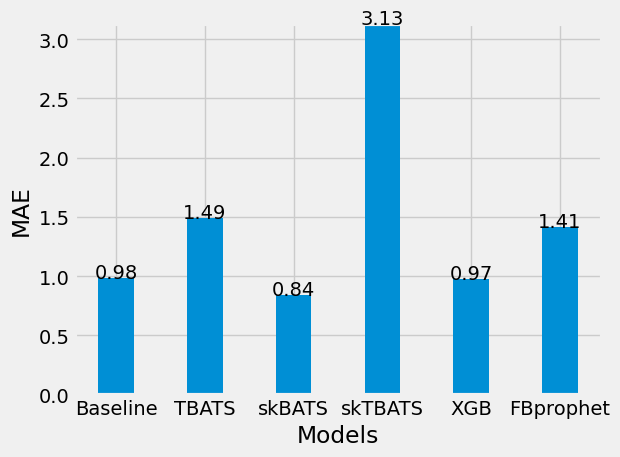

In [58]:
best_model(data, 0)

Best model is therefore skBATS

### Cluster 0 predictions

Data has been transformed with Boxcox, lambda value is : 0.388887927453602


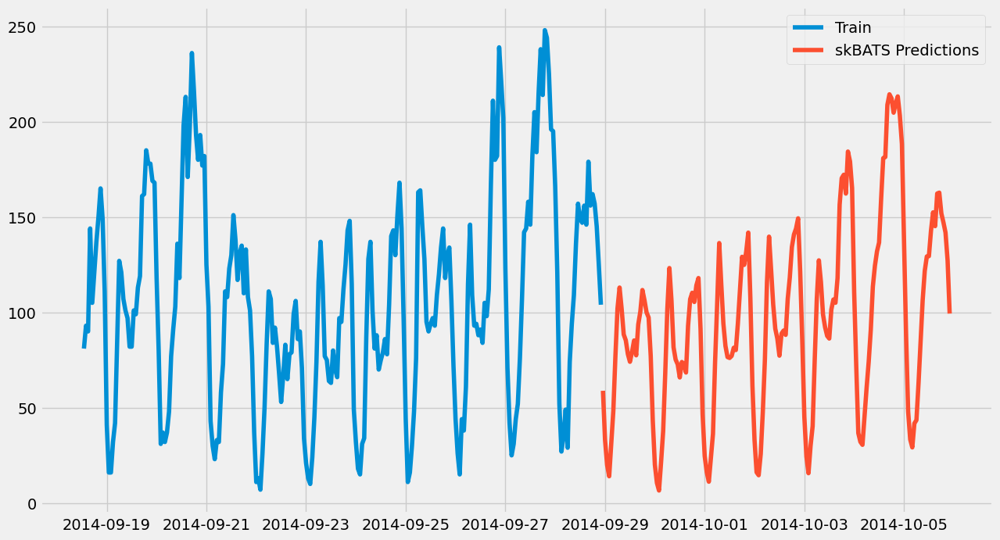

In [169]:
df = data[data['Cluster'] == 0]
    
# Aggregate data on hourly level
resample_df = df.copy()
resample_df.set_index('Date/Time', inplace=True)
hourly_rides = resample_df.resample('H')['Rides'].sum().reset_index().set_index('Date/Time')
    
# Make sure that date range is correct and fill missing values, when hours might be missing, with the average.
hourly_rides = hourly_rides.reindex(pd.date_range(start='2014-04-01 00:00:00', end='2014-09-28 22:00:00', freq='1H')).fillna(hourly_rides['Rides'].mean())
    
# Boxcox transformation
# lv = lambda value used to transform data
hourly_rides['Rides'], lv = boxcox(hourly_rides['Rides']+1)
print(f'Data has been transformed with Boxcox, lambda value is : {lv}')
    

# BATS using sktime library
# Create array of future predictions that we want. In this case we want to predict the next week, which is 168 hours
fh = np.arange(1, 169)

# Create BATS Model 
bats_forecaster = skBATS(use_box_cox=False,
                      use_trend=False,
                      use_damped_trend=False,
                      sp=[24, 168])# SP = seasonal period, 24  = Daily, 168 = Weekly

# Create forecasts
bats_forecaster.fit(hourly_rides)
y_pred_BATS = bats_forecaster.predict(fh)

# Get inverse of Boxcox again
hourly_rides['Rides'] = (inv_boxcox(hourly_rides['Rides'], lv))-1
y_pred_BATS['Rides'] = (inv_boxcox(y_pred_BATS['Rides'], lv))-1

# Visualize data
fig, ax = plt.subplots(figsize=(14,8))
ax.plot(hourly_rides[-250:], '-', label='Train')
ax.plot(y_pred_BATS, '-', label='skBATS Predictions')
plt.legend(loc='best')
plt.show()

view predictions

In [160]:
y_pred_BATS

,Rides
2014-09-28 23:00:00,58.876078
2014-09-29 00:00:00,33.170884
2014-09-29 01:00:00,19.972970
2014-09-29 02:00:00,14.039733
2014-09-29 03:00:00,31.257454
...,...
2014-10-05 18:00:00,151.856516
2014-10-05 19:00:00,147.172475
2014-10-05 20:00:00,141.868939
2014-10-05 21:00:00,127.252933


***

## Cluster 1 modeling:

Data has been transformed with Boxcox, lambda value is : 0.27927919068932633


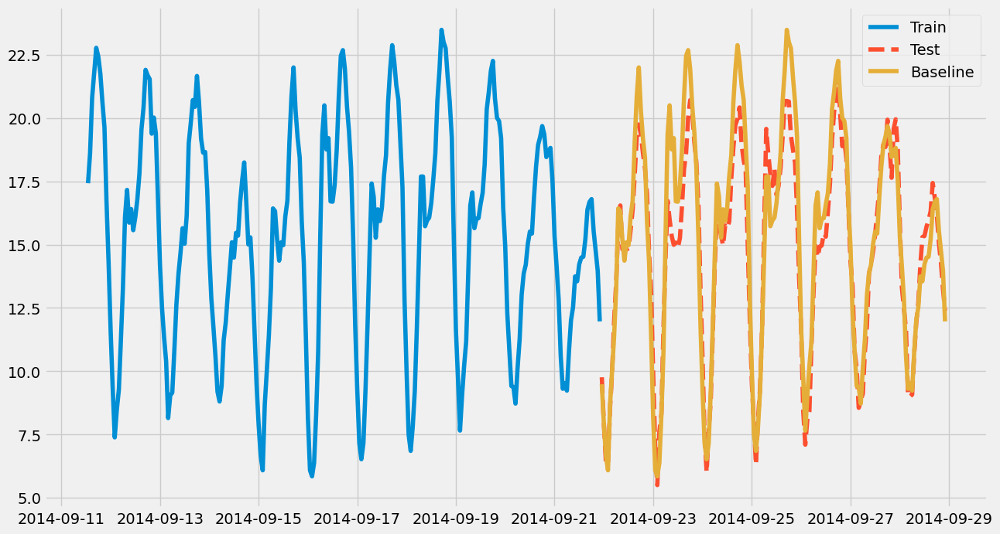

MAPE from baseline: 0.06751218130679787
MAE from baseline: 1.0130619508818133


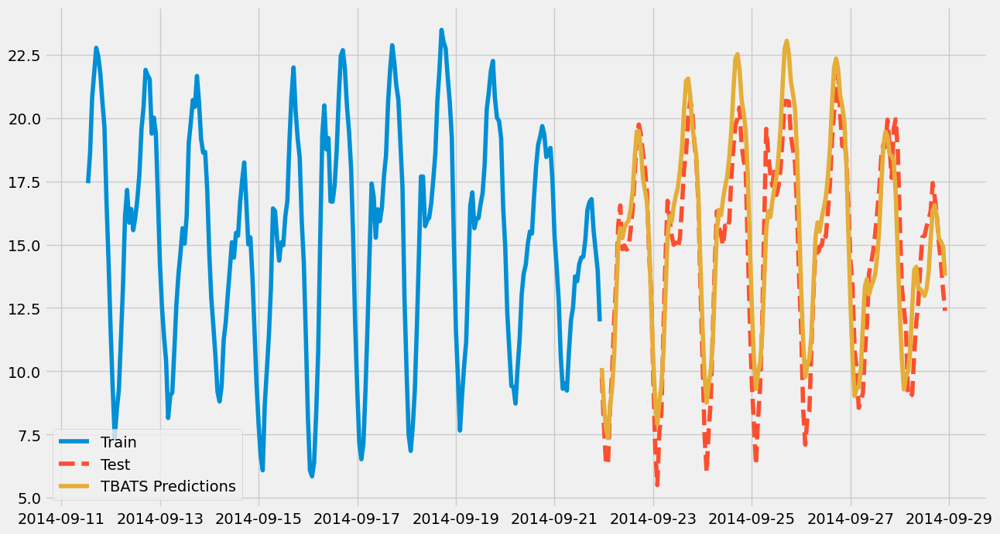

MAPE from TBATS: 0.11253038344019847
MAE from TBATS: 1.4498336832794119


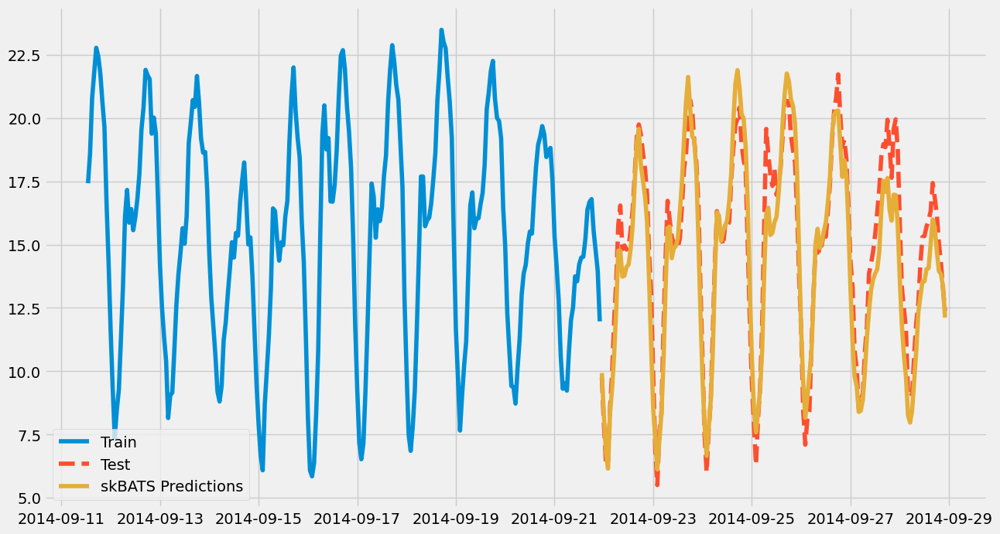

MAPE from skBATS: 0.06792428055953999
MAE from skBATS: 0.9912995751910701


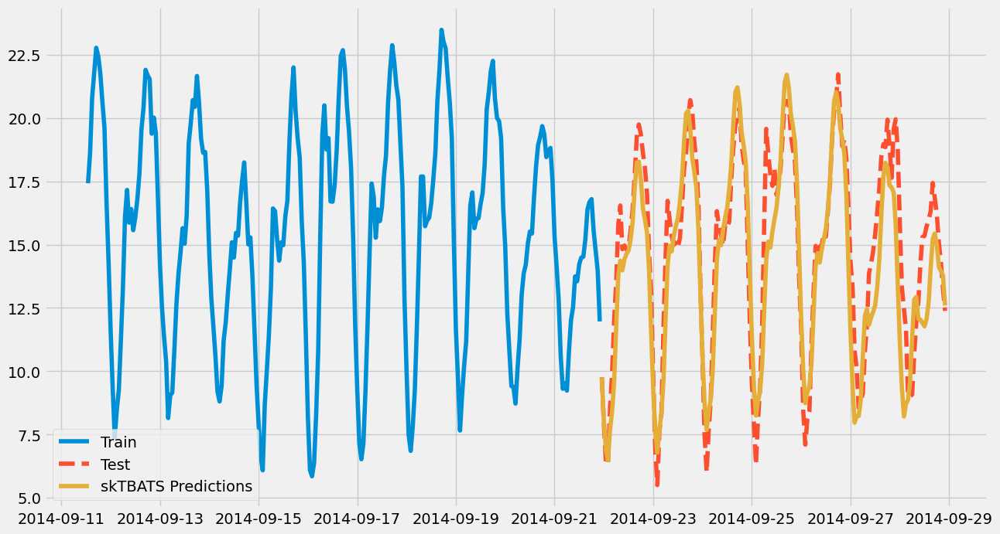

MAPE from skTBATS: 0.09571998589329256
MAE from skTBATS: 1.336525006459765


C:\Users\erikn\AppData\Local\Temp\ipykernel_11116\2061040129.py:152: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  xg_data['weekofyear'] = xg_data['Date/Time'].dt.weekofyear
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


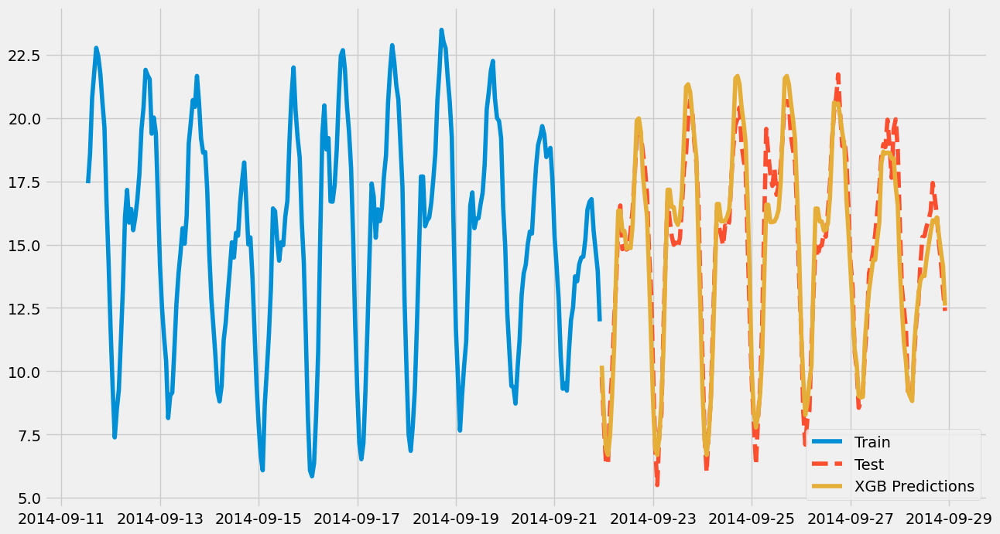

MAPE from XGB: 0.05659827238977316
MAE from XGB: 0.8044304662070206


C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

MAPE from FB prophet: 0.12896357167351682
MAE from FB prophet: 1.6770558507234994


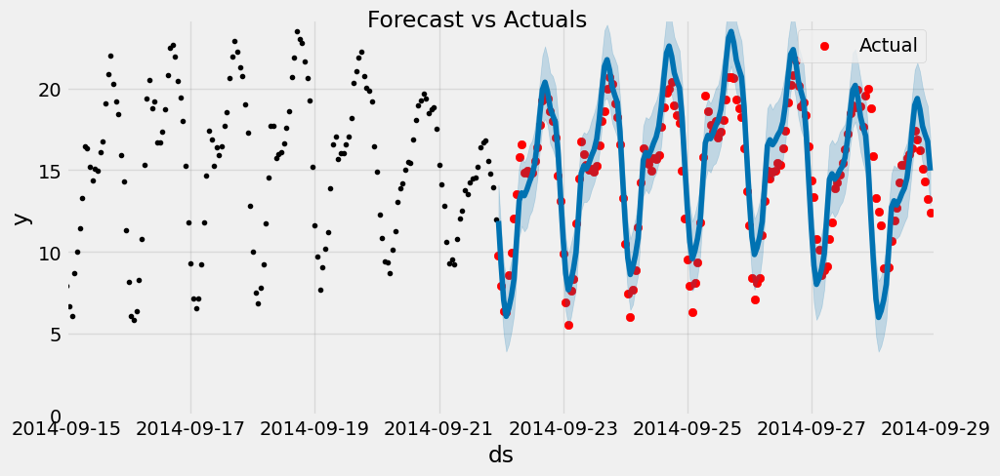

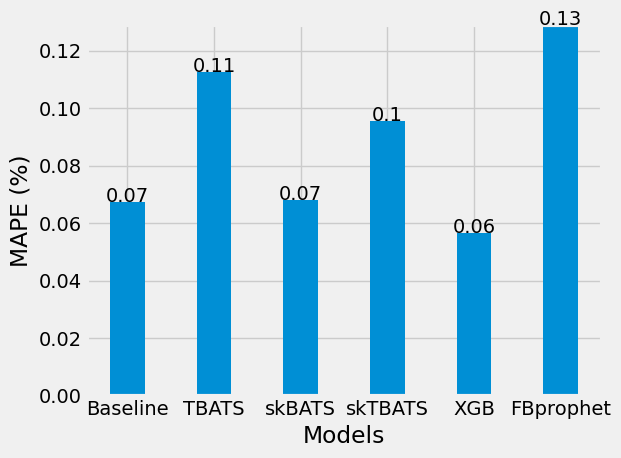

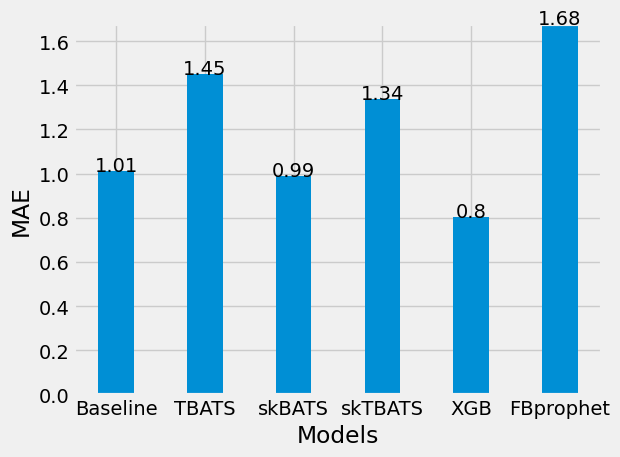

In [91]:
best_model(data, 1)

The Best model is XGB

### Cluster 1 predictions:

Data has been transformed with Boxcox, lambda value is : 0.27927919068932633


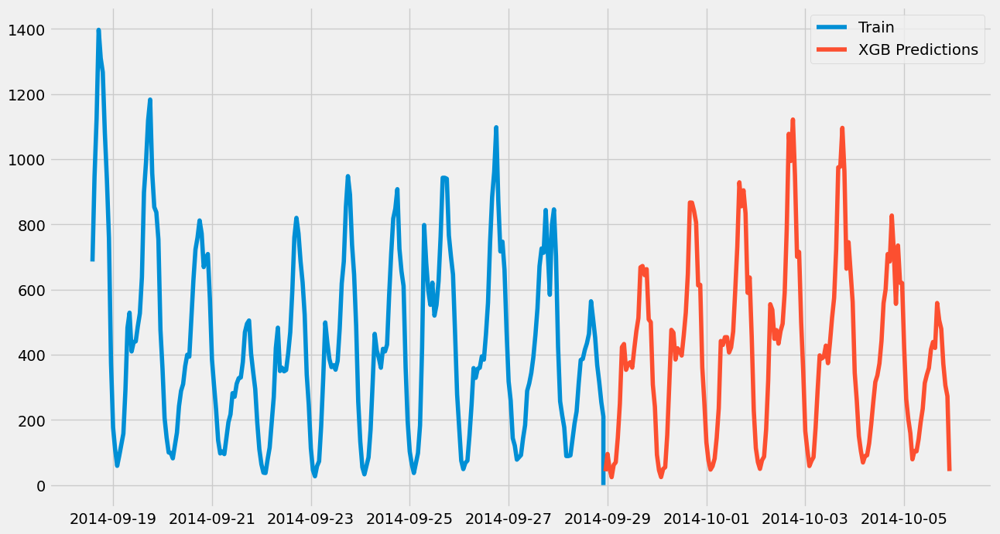

In [167]:
# Get data from user specified cluster
df = data[data['Cluster'] == 1]
    
# Aggregate data on hourly level
resample_df = df.copy()
resample_df.set_index('Date/Time', inplace=True)
hourly_rides = resample_df.resample('H')['Rides'].sum().reset_index().set_index('Date/Time')
    
# Make sure that date range is correct and fill missing values, when hours might be missing, with the average.
hourly_rides = hourly_rides.reindex(pd.date_range(start='2014-04-01 00:00:00', end='2014-09-28 22:00:00', freq='1H')).fillna(hourly_rides['Rides'].mean())
    
# Boxcox transformation
hourly_rides['Rides'], lv = boxcox(hourly_rides['Rides']+1)
print(f'Data has been transformed with Boxcox, lambda value is : {lv}')

# Create future dataframe values to predict
future_df = pd.DataFrame({'Date/Time': pd.date_range(start=hourly_rides.index[-1], periods=169, freq='h')})
future_df.set_index('Date/Time', inplace=True)
#future_df = future_df.iloc[1:]
# Concatenate original and future dataframes
xg_data = pd.concat([hourly_rides, future_df])
# Fill NaN values with '0', this is where we don't have values for the rides taken, we want to predict these values
xg_data.fillna(0, inplace=True)

# XGBoost
# Perform transformations in order to get it into the right format
xg_data.reset_index(inplace=True)
xg_data['Date/Time'] = pd.to_datetime(xg_data['index'])
xg_data['hour'] = xg_data['Date/Time'].dt.hour
xg_data['dayofweek'] = xg_data['Date/Time'].dt.dayofweek
xg_data['quarter'] = xg_data['Date/Time'].dt.quarter
xg_data['month'] = xg_data['Date/Time'].dt.month
xg_data['dayofyear'] = xg_data['Date/Time'].dt.dayofyear
xg_data['dayofmonth'] = xg_data['Date/Time'].dt.day
xg_data['weekofyear'] = (xg_data['Date/Time'].dt.isocalendar().week).astype(int)
xg_data.drop(columns=['index'], inplace=True)
xg_data.set_index('Date/Time', inplace=True)
    
# Create training and testing datasets
X, y = xg_data.iloc[:, 1:], xg_data[['Rides']]
X_train, y_train = X[:-168], y[:-168]
X_test = X[-168:]

# Create and fit model
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train, verbose=False) # Change verbose to True if you want to see it train

# Make predictions
xg_predictions = reg.predict(X_test)
xg_predictions_df = pd.DataFrame(xg_predictions, index=future_df.index[-168:], columns=['Rides'])

# Use inverse boxcox to get original values
y_train = (inv_boxcox(y_train, lv))-1
xg_predictions_df = (inv_boxcox(xg_predictions_df, lv))-1

# Visualize prediction data
fig, ax = plt.subplots(figsize=(14,8))
ax.plot(y_train[-250:], '-', label='Train')
ax.plot(xg_predictions_df, '-', label='XGB Predictions')
plt.legend(loc='best')
plt.show()

In [168]:
xg_predictions_df

,Rides
Date/Time,
2014-09-28 23:00:00,42.357437
2014-09-29 00:00:00,95.501495
2014-09-29 01:00:00,51.239269
2014-09-29 02:00:00,24.217567
2014-09-29 03:00:00,61.732929
...,...
2014-10-05 18:00:00,479.432281
2014-10-05 19:00:00,372.232544
2014-10-05 20:00:00,305.936676


***

## Cluster 2 modeling:

Data has been transformed with Boxcox, lambda value is : 0.37629511248406516


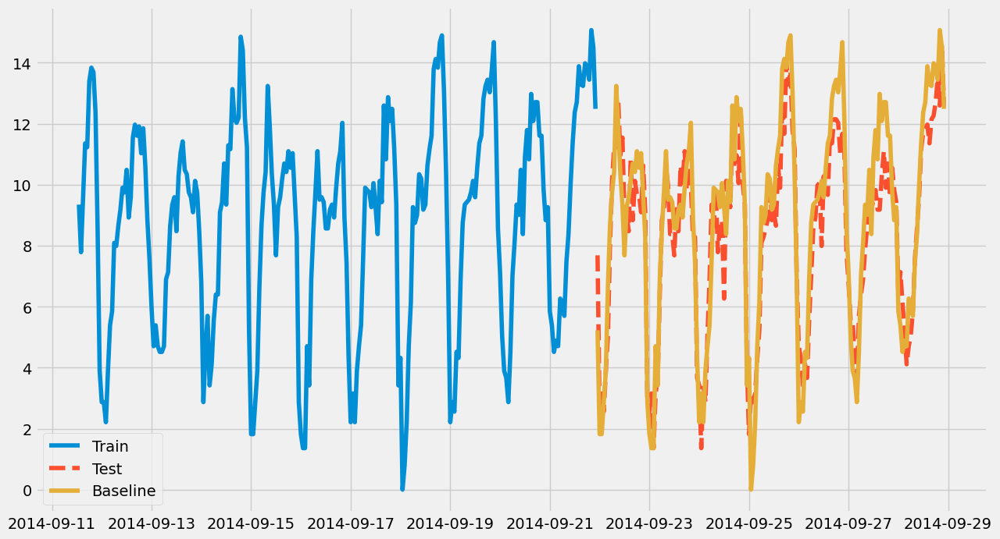

MAPE from baseline: 0.15941793090806958
MAE from baseline: 1.058052884691564


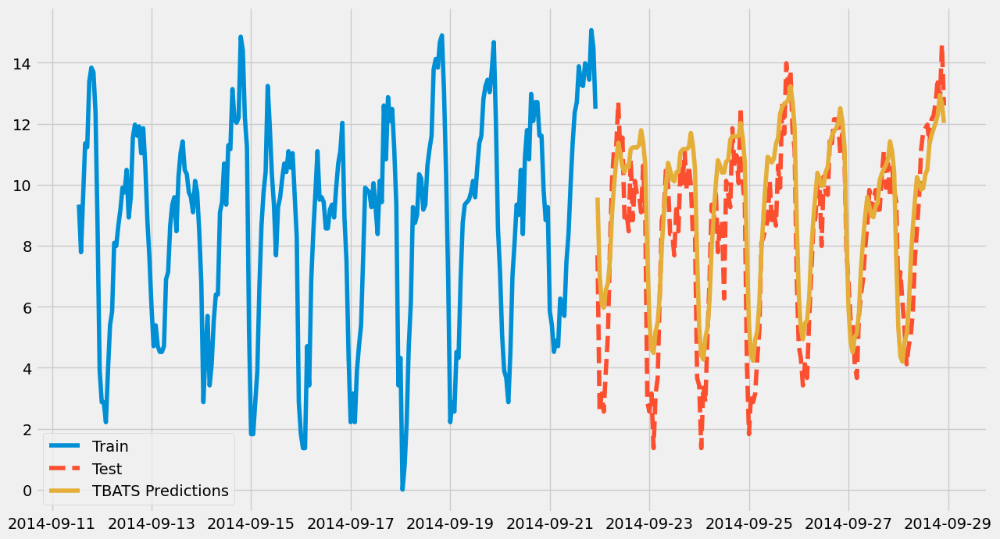

MAPE from TBATS: 0.24537008234951652
MAE from TBATS: 1.2850114308585308


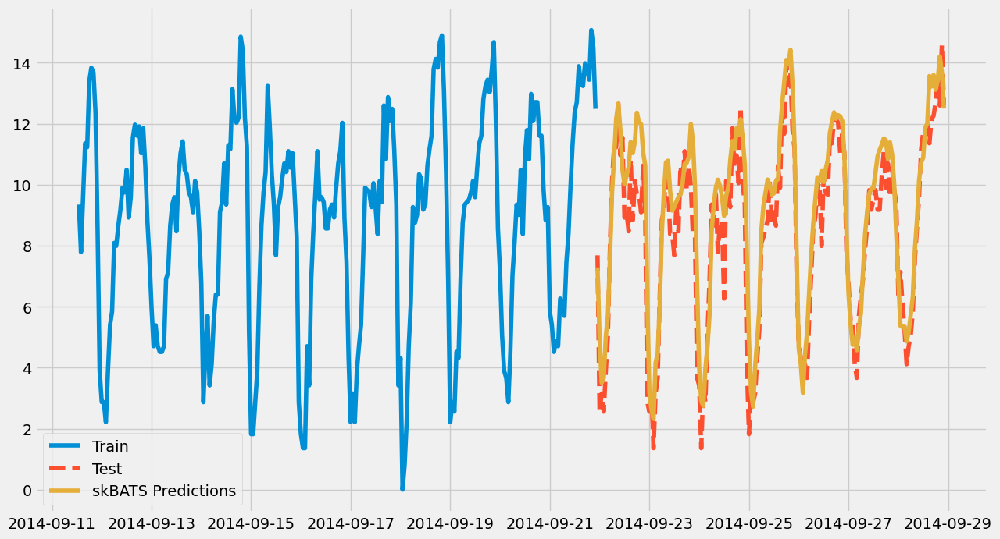

MAPE from skBATS: 0.14734229405499796
MAE from skBATS: 0.8862961640070035


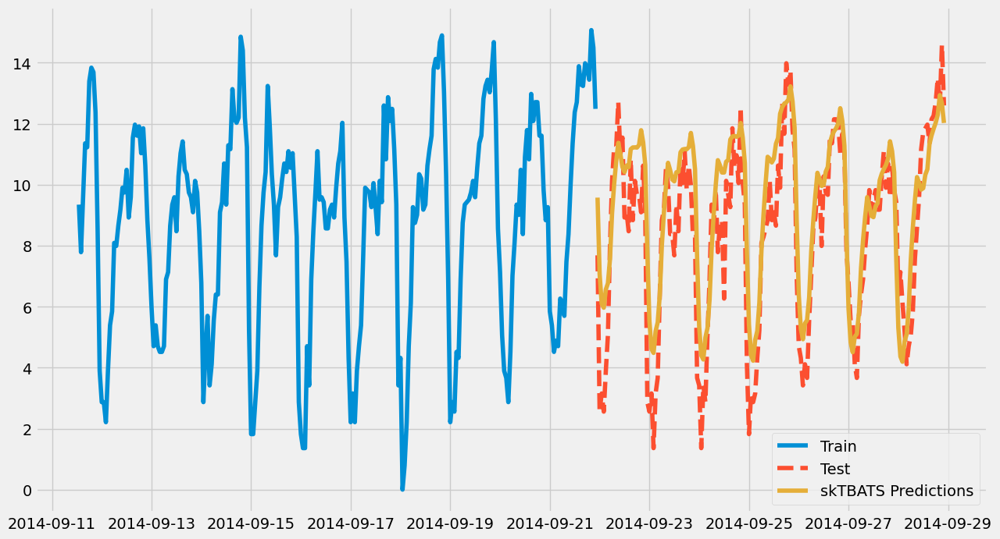

MAPE from skTBATS: 0.24537008234951652
MAE from skTBATS: 1.2850114308585308


C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


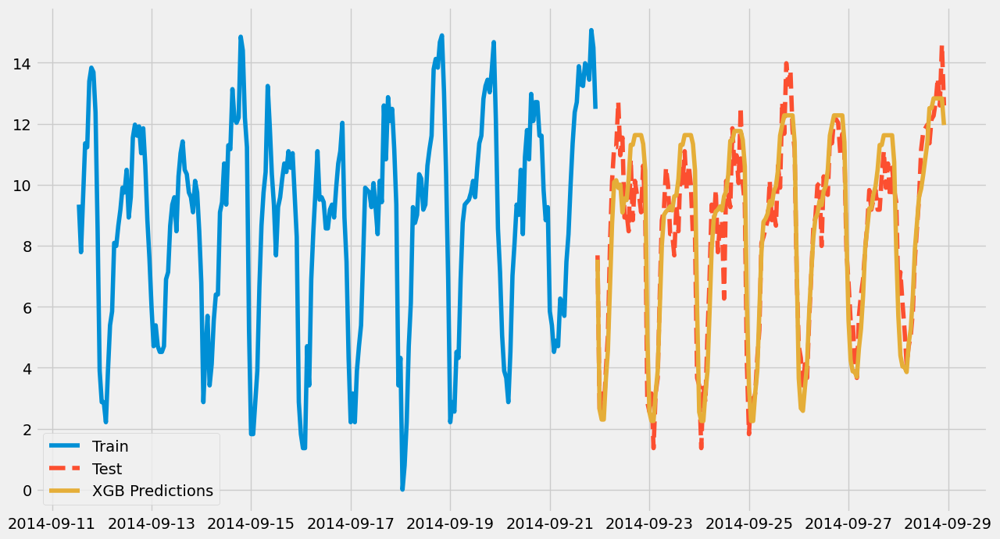

MAPE from XGB: 0.13158345291197676
MAE from XGB: 0.9129102447600427


C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

MAPE from FB prophet: 0.20767608159869738
MAE from FB prophet: 1.3404941060930902


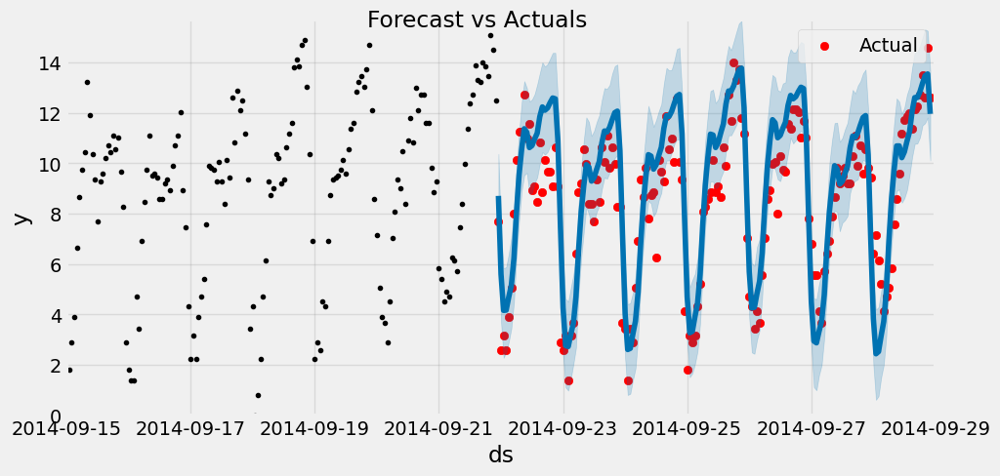

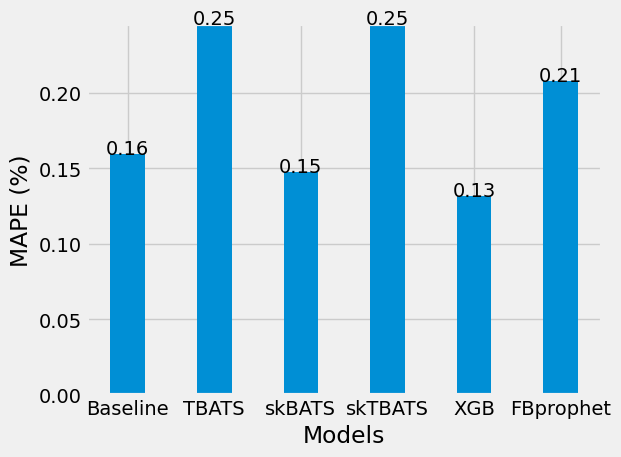

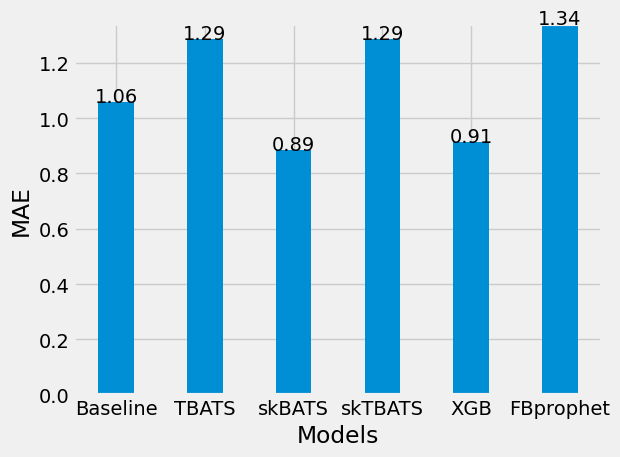

In [59]:
best_model(data, 2)

skBATS has a lower MAE and therefore more accurate predictoins even though it is very close to the XGB model

### Cluster 2 predictions:

Data has been transformed with Boxcox, lambda value is : 0.37629511248406516


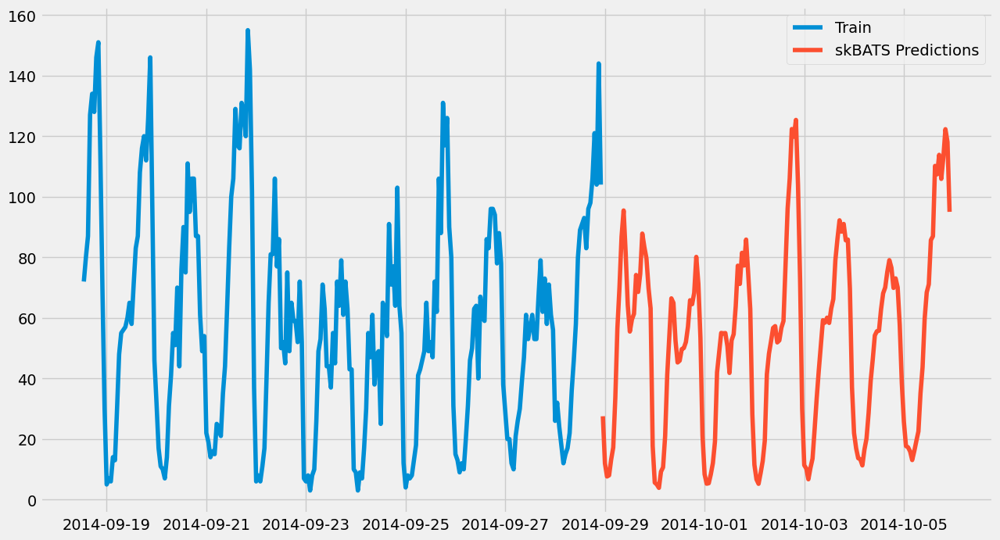

In [92]:
df = data[data['Cluster'] == 2]
    
# Aggregate data on hourly level
resample_df = df.copy()
resample_df.set_index('Date/Time', inplace=True)
hourly_rides = resample_df.resample('H')['Rides'].sum().reset_index().set_index('Date/Time')
    
# Make sure that date range is correct and fill missing values, when hours might be missing, with the average.
hourly_rides = hourly_rides.reindex(pd.date_range(start='2014-04-01 00:00:00', end='2014-09-28 22:00:00', freq='1H')).fillna(hourly_rides['Rides'].mean())
    
# Boxcox transformation
hourly_rides['Rides'], lv = boxcox(hourly_rides['Rides']+1)
print(f'Data has been transformed with Boxcox, lambda value is : {lv}')
    

# BATS using sktime library
# Create array of future predictions that we want. In this case we want to predict the next week, which is 168 hours
fh = np.arange(1, 169)

# Create BATS Model 
bats_forecaster = skBATS(use_box_cox=False,
                      use_trend=False,
                      use_damped_trend=False,
                      sp=[24, 168])# SP = seasonal period, 24  = Daily, 168 = Weekly

# Create forecasts
bats_forecaster.fit(hourly_rides)
y_pred_BATS = bats_forecaster.predict(fh)

# Get inverse of Boxcox again
hourly_rides['Rides'] = inv_boxcox(hourly_rides['Rides'], lv)
y_pred_BATS['Rides'] = inv_boxcox(y_pred_BATS['Rides'], lv)

# Visualize data
fig, ax = plt.subplots(figsize=(14,8))
ax.plot(hourly_rides[-250:], '-', label='Train')
ax.plot(y_pred_BATS, '-', label='skBATS Predictions')
plt.legend(loc='best')
plt.show()

In [93]:
y_pred_BATS

,Rides
2014-09-28 23:00:00,27.524959
2014-09-29 00:00:00,11.986890
2014-09-29 01:00:00,7.632999
2014-09-29 02:00:00,8.021472
2014-09-29 03:00:00,13.240612
...,...
2014-10-05 18:00:00,105.894563
2014-10-05 19:00:00,112.944856
2014-10-05 20:00:00,122.302388
2014-10-05 21:00:00,118.080078


***

## Cluster 3 modeling:

Data has been transformed with Boxcox, lambda value is : 0.35834533195351437


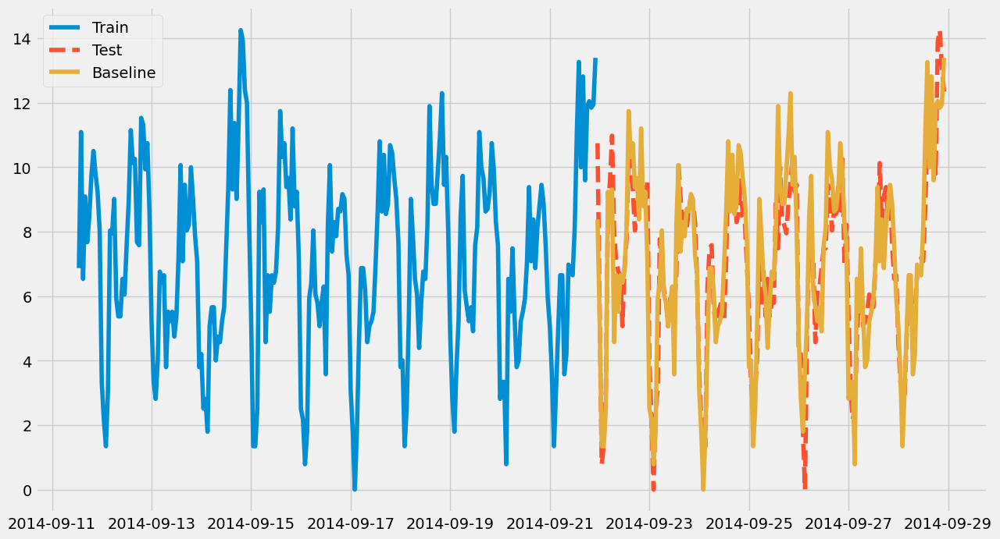

MAPE from baseline: 122939796957547.88
MAE from baseline: 1.0276127562750048


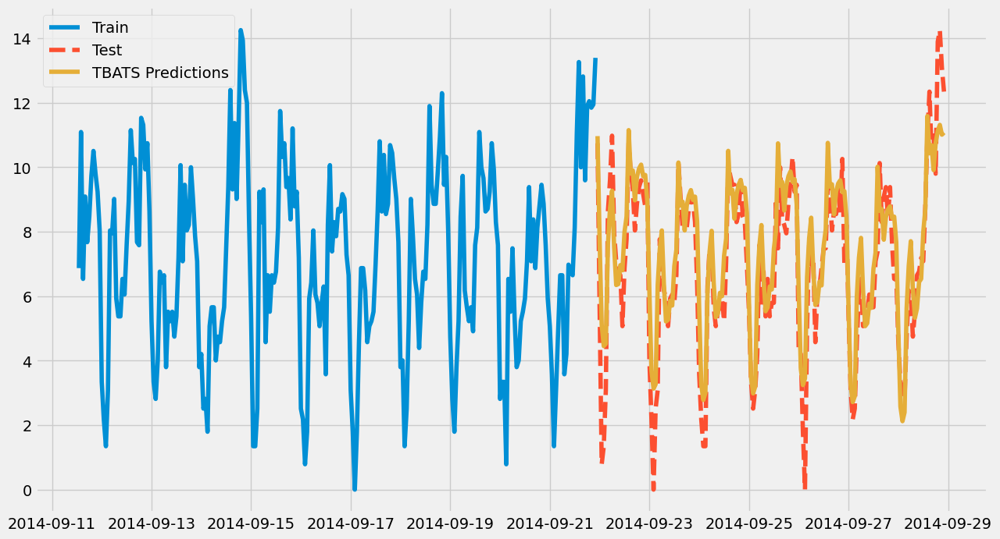

MAPE from TBATS: 176494411903640.8
MAE from TBATS: 0.9117934545215286


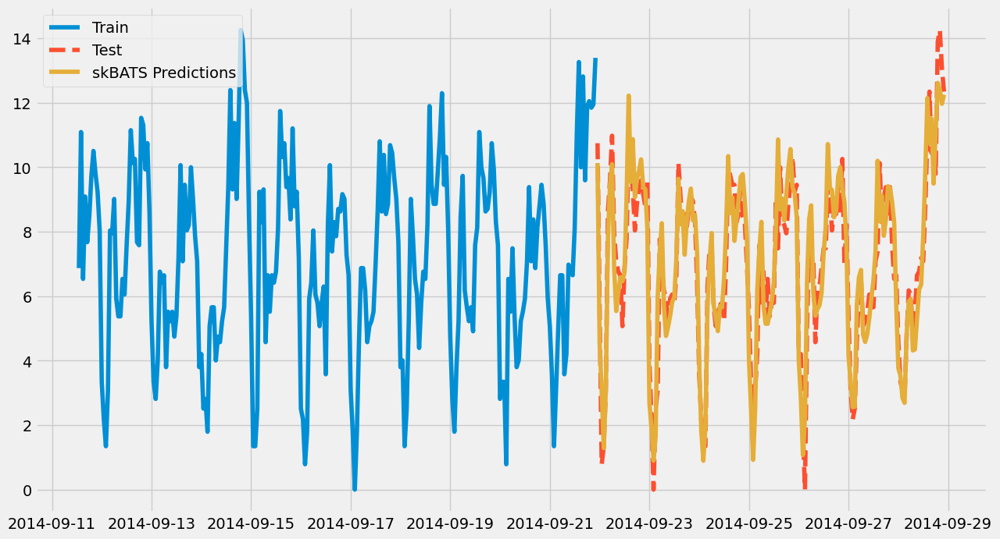

MAPE from skBATS: 84681924242220.53
MAE from skBATS: 0.8094258952074153


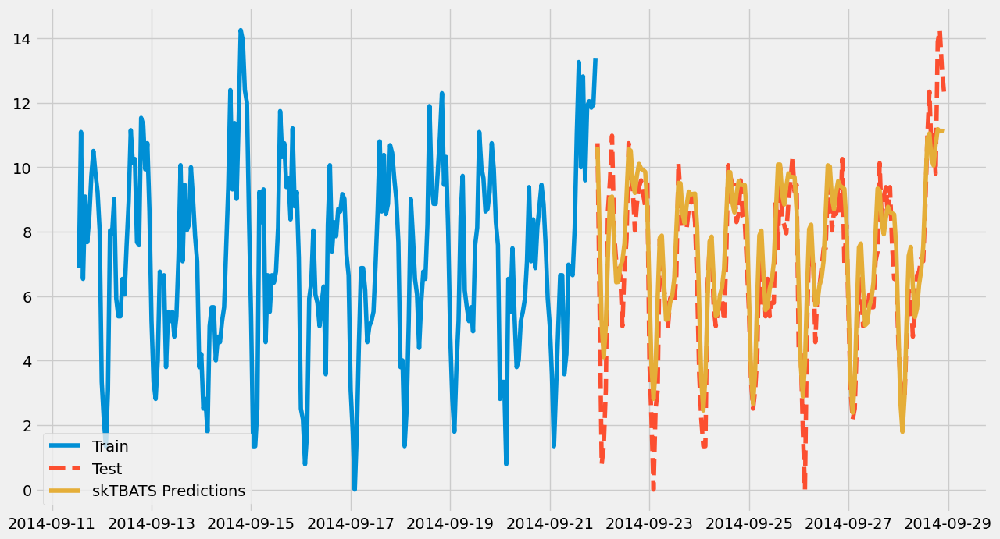

MAPE from skTBATS: 180229148533591.62
MAE from skTBATS: 0.8988760603106106


C:\Users\erikn\AppData\Local\Temp\ipykernel_11116\2061040129.py:152: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  xg_data['weekofyear'] = xg_data['Date/Time'].dt.weekofyear
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


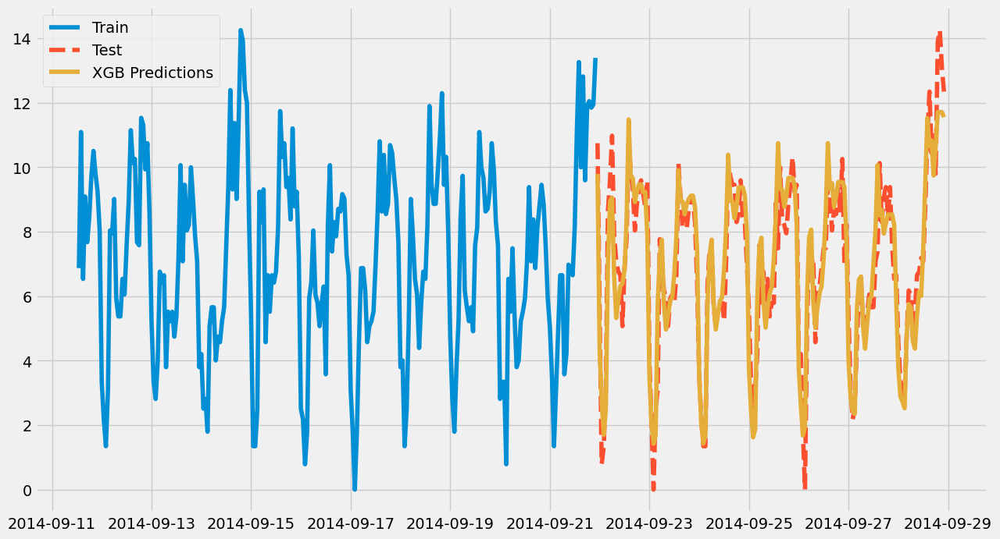

MAPE from XGB: 90002126212144.88
MAE from XGB: 0.7628558758517973


C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

MAPE from FB prophet: 123647025466526.23
MAE from FB prophet: 0.9143687943034087


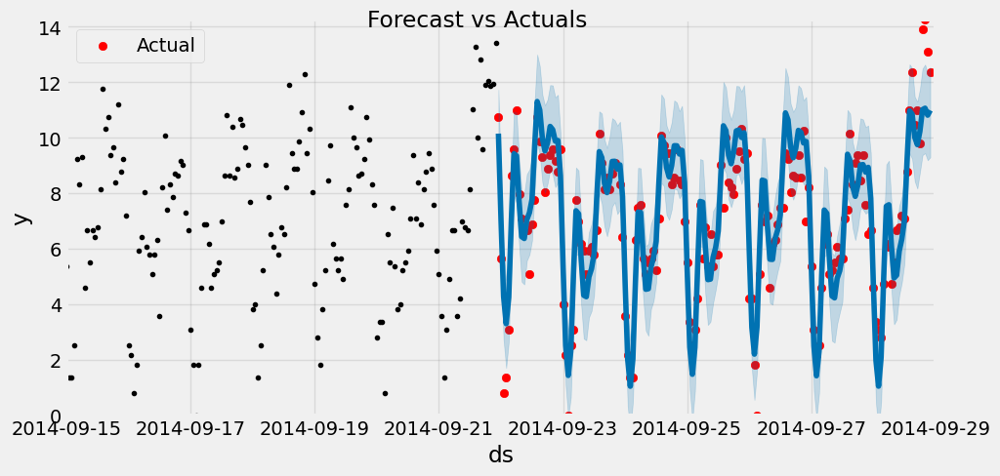

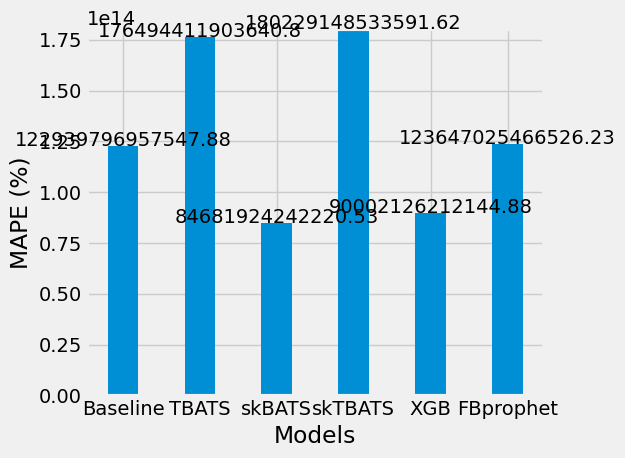

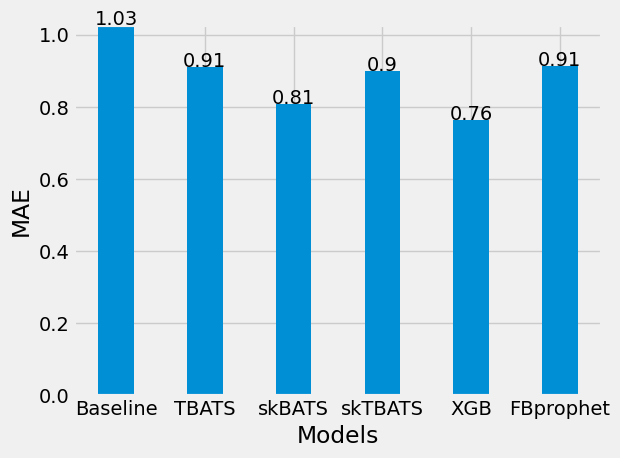

In [172]:
best_model(data, 3)

Best model is therefore XGB

### Cluster 3 predictions:

Data has been transformed with Boxcox, lambda value is : 0.35834533195351437


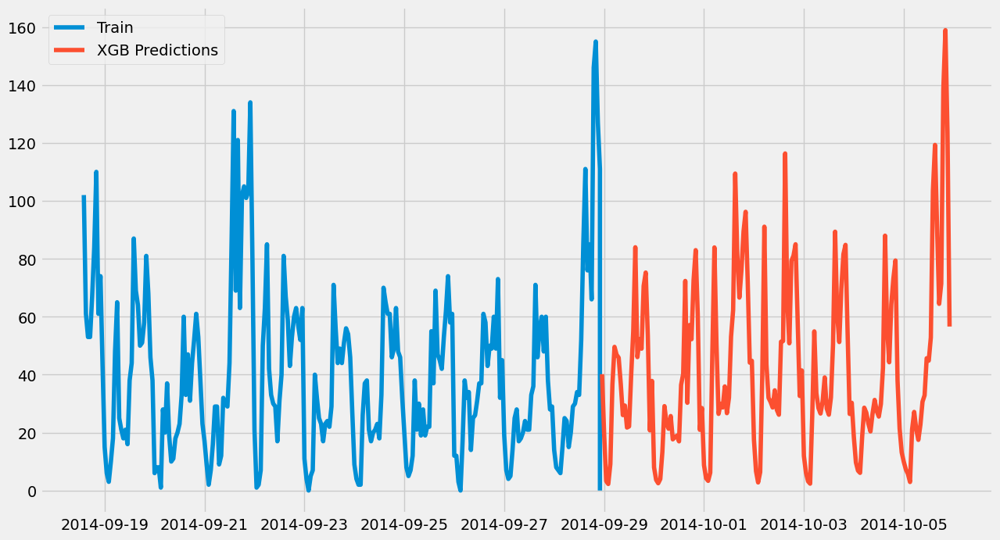

In [53]:
# Get data from user specified cluster
df = data[data['Cluster'] == 3]
    
# Aggregate data on hourly level
resample_df = df.copy()
resample_df.set_index('Date/Time', inplace=True)
hourly_rides = resample_df.resample('H')['Rides'].sum().reset_index().set_index('Date/Time')
    
# Make sure that date range is correct and fill missing values, when hours might be missing, with the average.
hourly_rides = hourly_rides.reindex(pd.date_range(start='2014-04-01 00:00:00', end='2014-09-28 22:00:00', freq='1H')).fillna(hourly_rides['Rides'].mean())
    
# Boxcox transformation
hourly_rides['Rides'], lv = boxcox(hourly_rides['Rides']+1)
print(f'Data has been transformed with Boxcox, lambda value is : {lv}')

# Create future dataframe values to predict
future_df = pd.DataFrame({'Date/Time': pd.date_range(start=hourly_rides.index[-1], periods=169, freq='h')})
future_df.set_index('Date/Time', inplace=True)
#future_df = future_df.iloc[1:]
# Concatenate original and future dataframes
xg_data = pd.concat([hourly_rides, future_df])
# Fill NaN values with '0', this is where we don't have values for the rides taken, we want to predict these values
xg_data.fillna(0, inplace=True)

# XGBoost
# Perform transformations in order to get it into the right format
xg_data.reset_index(inplace=True)
xg_data['Date/Time'] = pd.to_datetime(xg_data['index'])
xg_data['hour'] = xg_data['Date/Time'].dt.hour
xg_data['dayofweek'] = xg_data['Date/Time'].dt.dayofweek
xg_data['quarter'] = xg_data['Date/Time'].dt.quarter
xg_data['month'] = xg_data['Date/Time'].dt.month
xg_data['dayofyear'] = xg_data['Date/Time'].dt.dayofyear
xg_data['dayofmonth'] = xg_data['Date/Time'].dt.day
xg_data['weekofyear'] = (xg_data['Date/Time'].dt.isocalendar().week).astype(int)
xg_data.drop(columns=['index'], inplace=True)
xg_data.set_index('Date/Time', inplace=True)
    
# Create training and testing datasets
X, y = xg_data.iloc[:, 1:], xg_data[['Rides']]
X_train, y_train = X[:-168], y[:-168]
X_test = X[-168:]

# Create and fit model
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train, verbose=False) # Change verbose to True if you want to see it train

# Make predictions
xg_predictions = reg.predict(X_test)
xg_predictions_df = pd.DataFrame(xg_predictions, index=future_df.index[-168:], columns=['Rides'])

# Use inverse boxcox to get original values
y_train = (inv_boxcox(y_train, lv))-1
xg_predictions_df = (inv_boxcox(xg_predictions_df, lv))-1

# Visualize prediction data
fig, ax = plt.subplots(figsize=(14,8))
ax.plot(y_train[-250:], '-', label='Train')
ax.plot(xg_predictions_df, '-', label='XGB Predictions')
plt.legend(loc='best')
plt.show()

In [54]:
xg_predictions_df

,Rides
Date/Time,
2014-09-28 23:00:00,40.157890
2014-09-29 00:00:00,19.706585
2014-09-29 01:00:00,3.259970
2014-09-29 02:00:00,2.258141
2014-09-29 03:00:00,9.161592
...,...
2014-10-05 18:00:00,71.415039
2014-10-05 19:00:00,138.536209
2014-10-05 20:00:00,158.927551


***

## Cluster 4 modeling:

Data has been transformed with Boxcox, lambda value is : 0.4219888518588908


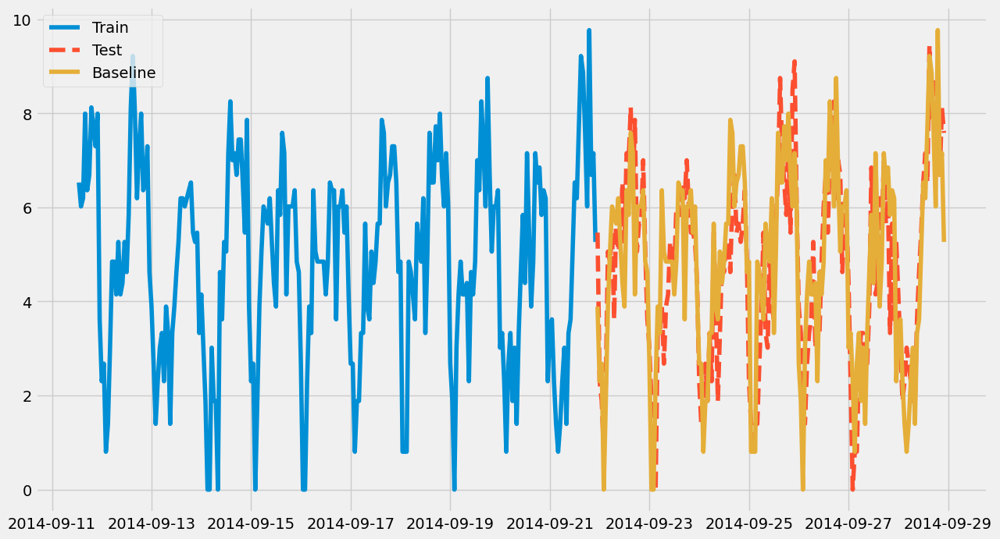

MAPE from baseline: 123523192065887.38
MAE from baseline: 1.0460083108003444


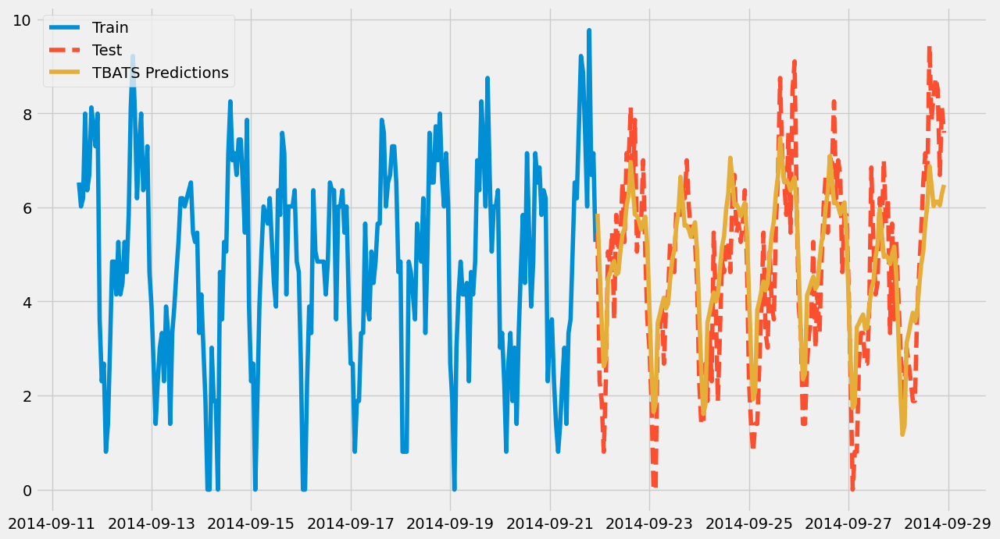

MAPE from TBATS: 139776850857639.97
MAE from TBATS: 0.9135199880125691


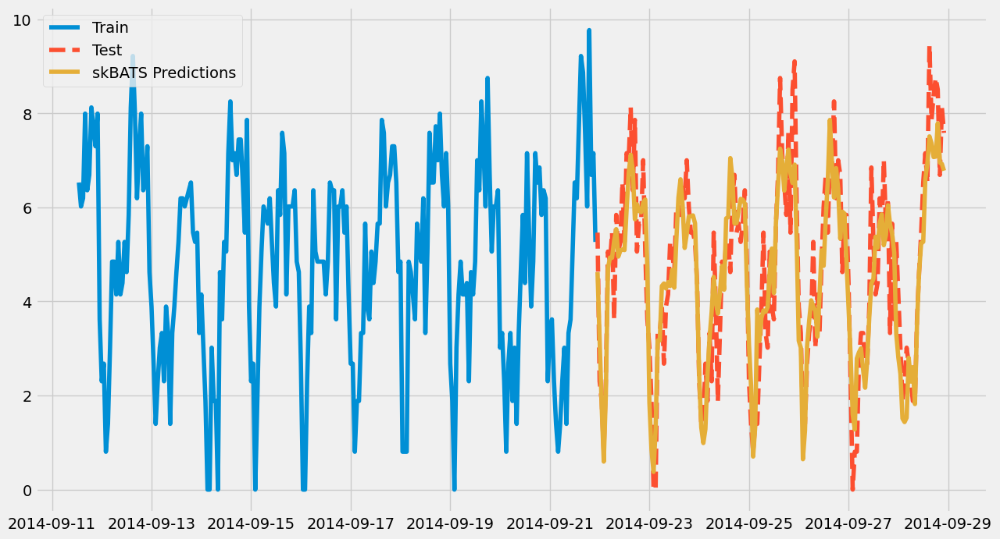

MAPE from skBATS: 87733357292524.73
MAE from skBATS: 0.7346666120004126


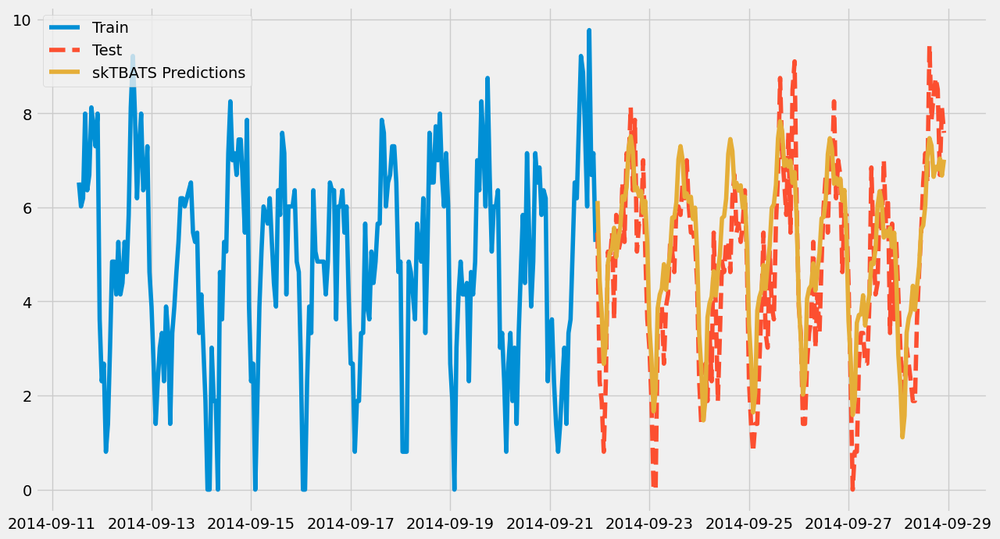

MAPE from skTBATS: 143524584841124.66
MAE from skTBATS: 0.964057029983046


C:\Users\erikn\AppData\Local\Temp\ipykernel_11148\2061040129.py:152: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  xg_data['weekofyear'] = xg_data['Date/Time'].dt.weekofyear
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


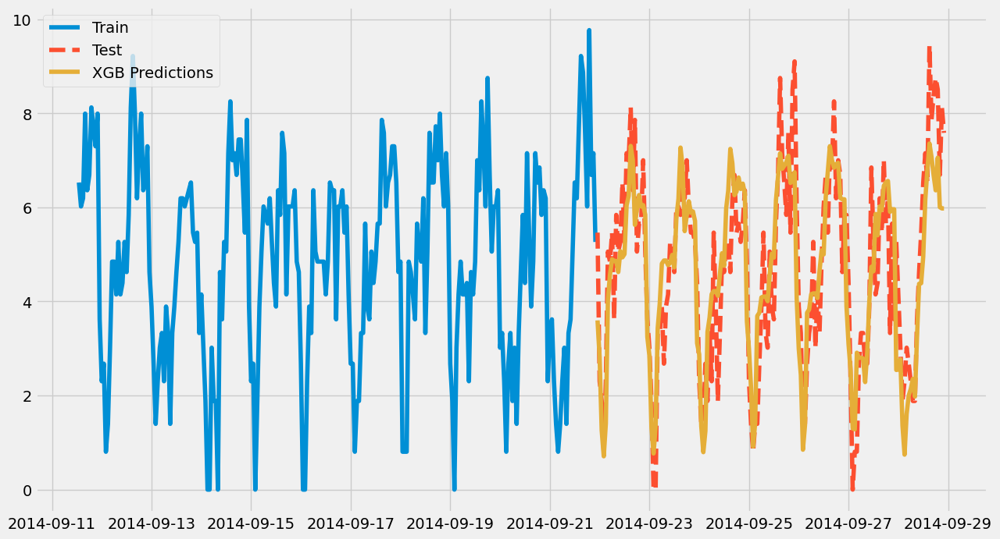

MAPE from XGB: 91396415122871.08
MAE from XGB: 0.8715354415155685


C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

MAPE from FB prophet: 73758881572280.83
MAE from FB prophet: 0.8497870439039354


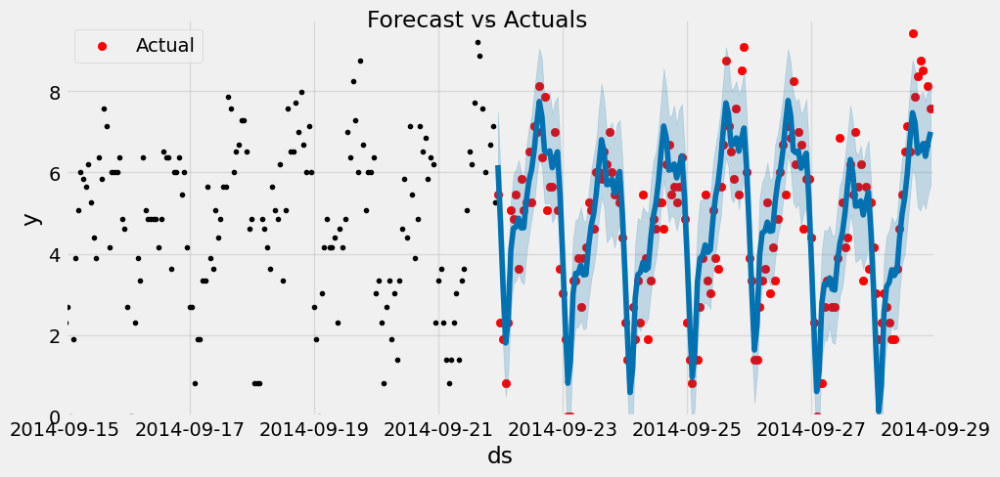

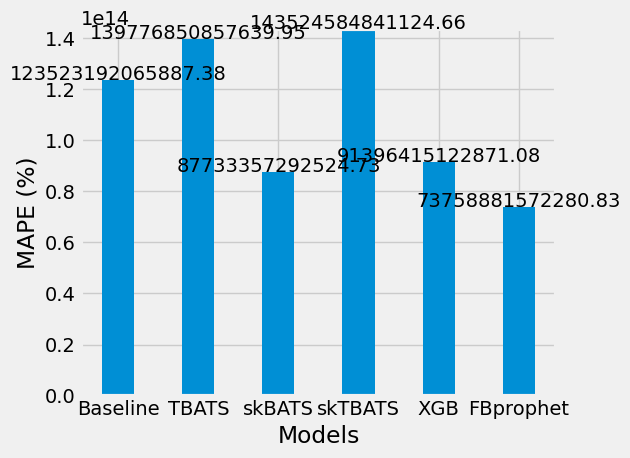

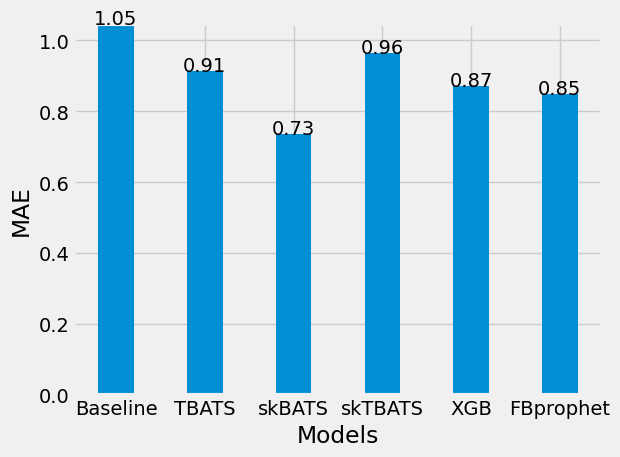

In [55]:
best_model(data, 4)

The best model is therefore skBATS

### Cluster 4 predictions:

Data has been transformed with Boxcox, lambda value is : 0.4219888518588908


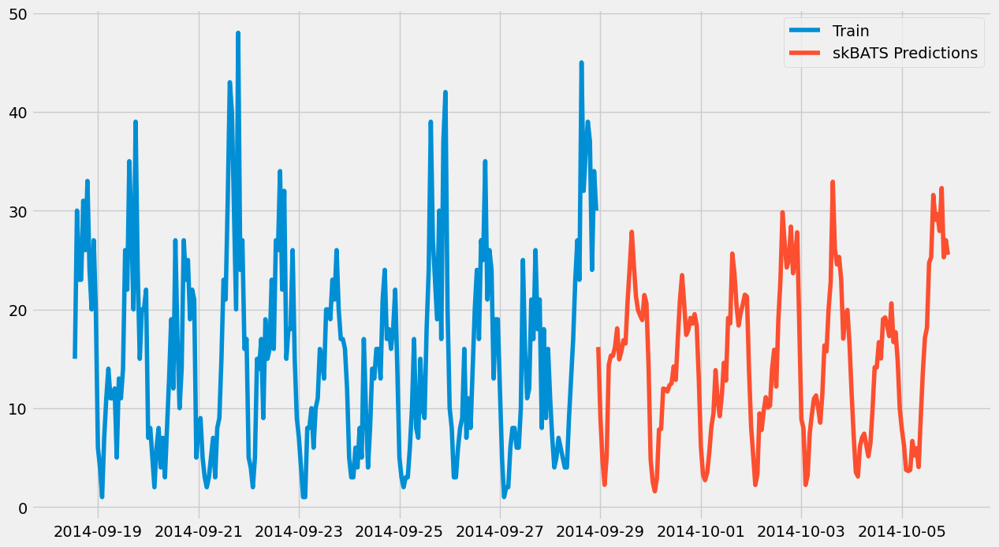

In [56]:
df = data[data['Cluster'] == 4]
    
# Aggregate data on hourly level
resample_df = df.copy()
resample_df.set_index('Date/Time', inplace=True)
hourly_rides = resample_df.resample('H')['Rides'].sum().reset_index().set_index('Date/Time')
    
# Make sure that date range is correct and fill missing values, when hours might be missing, with the average.
hourly_rides = hourly_rides.reindex(pd.date_range(start='2014-04-01 00:00:00', end='2014-09-28 22:00:00', freq='1H')).fillna(hourly_rides['Rides'].mean())
    
# Boxcox transformation
hourly_rides['Rides'], lv = boxcox(hourly_rides['Rides']+1)
print(f'Data has been transformed with Boxcox, lambda value is : {lv}')
    

# BATS using sktime library
# Create array of future predictions that we want. In this case we want to predict the next week, which is 168 hours
fh = np.arange(1, 169)

# Create BATS Model 
bats_forecaster = skBATS(use_box_cox=False,
                      use_trend=False,
                      use_damped_trend=False,
                      sp=[24, 168])# SP = seasonal period, 24  = Daily, 168 = Weekly

# Create forecasts
bats_forecaster.fit(hourly_rides)
y_pred_BATS = bats_forecaster.predict(fh)

# Get inverse of Boxcox again
hourly_rides['Rides'] = inv_boxcox(hourly_rides['Rides'], lv)
y_pred_BATS['Rides'] = inv_boxcox(y_pred_BATS['Rides'], lv)

# Visualize data
fig, ax = plt.subplots(figsize=(14,8))
ax.plot(hourly_rides[-250:], '-', label='Train')
ax.plot(y_pred_BATS, '-', label='skBATS Predictions')
plt.legend(loc='best')
plt.show()

In [57]:
y_pred_BATS

,Rides
2014-09-28 23:00:00,16.191622
2014-09-29 00:00:00,9.110893
2014-09-29 01:00:00,4.741910
2014-09-29 02:00:00,2.242393
2014-09-29 03:00:00,5.161247
...,...
2014-10-05 18:00:00,27.936396
2014-10-05 19:00:00,32.277255
2014-10-05 20:00:00,25.276418
2014-10-05 21:00:00,27.007040


***

## Cluster 5 modeling:

Data has been transformed with Boxcox, lambda value is : 0.4262645721665654


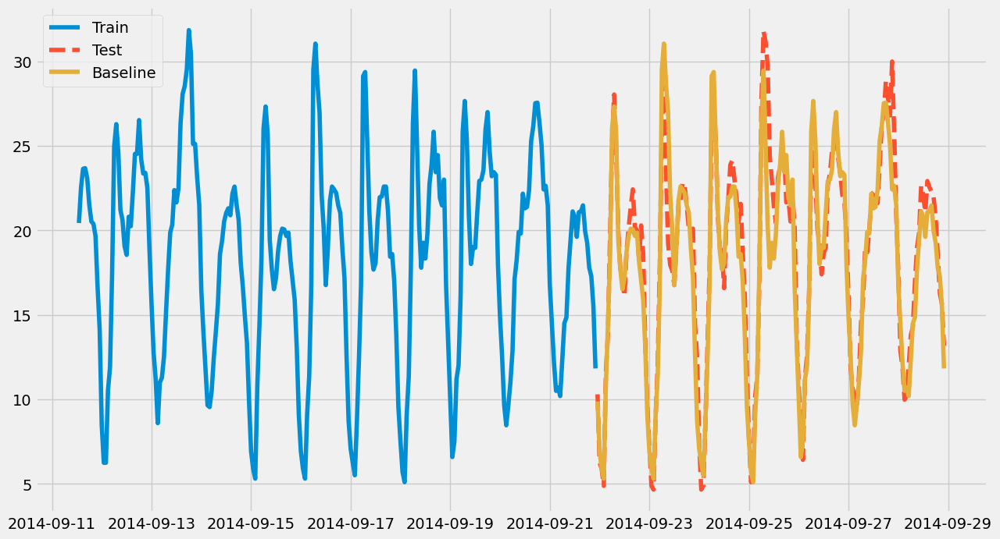

MAPE from baseline: 0.07382195803858436
MAE from baseline: 1.3260822065543916


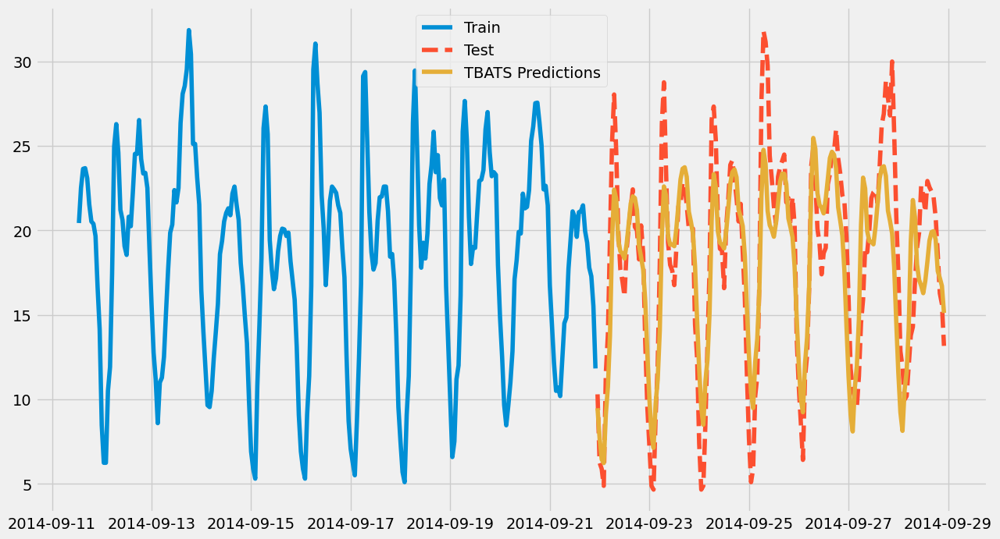

MAPE from TBATS: 0.16447383541845975
MAE from TBATS: 2.5297406815258547


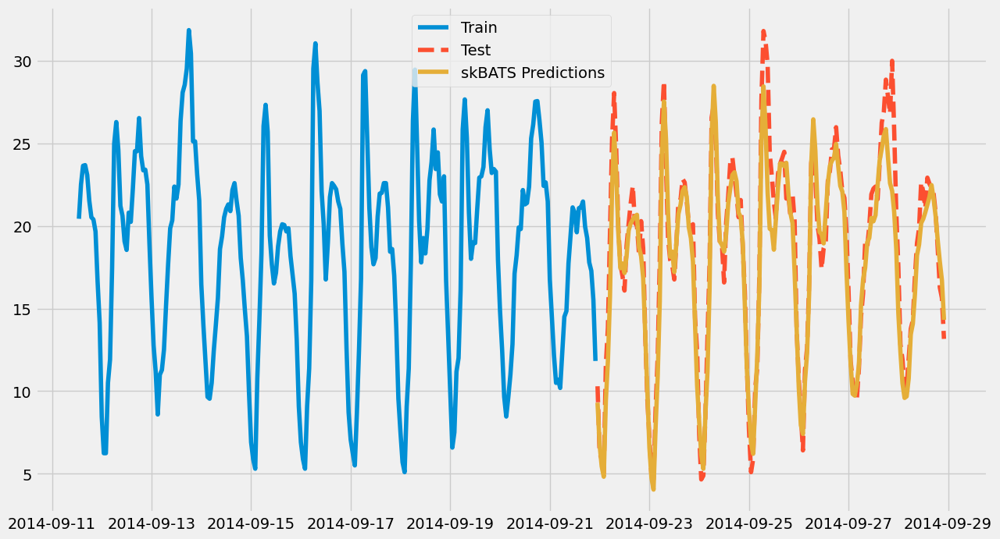

MAPE from skBATS: 0.06683056896521294
MAE from skBATS: 1.1969172655822626


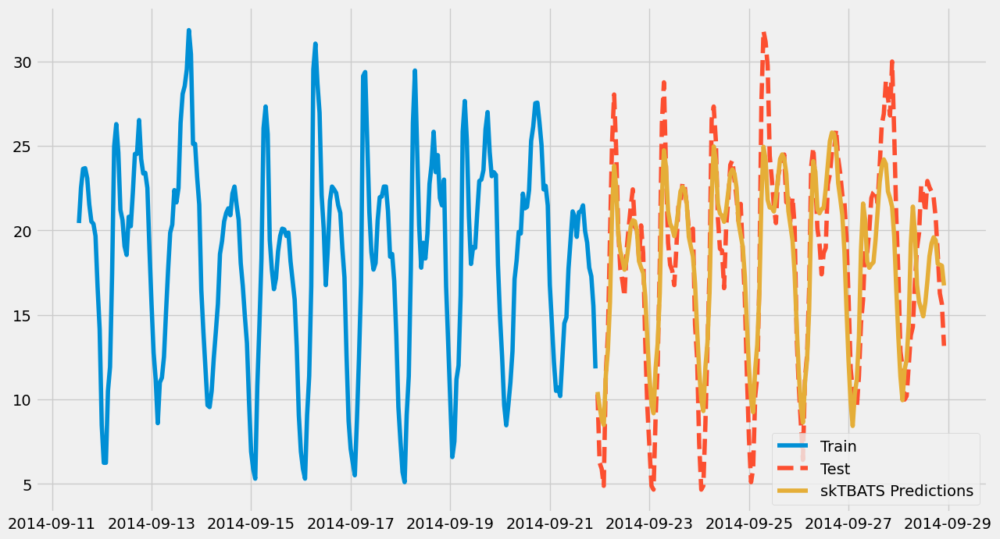

MAPE from skTBATS: 0.16572487022948165
MAE from skTBATS: 2.371820079615026


C:\Users\erikn\AppData\Local\Temp\ipykernel_4840\871458659.py:152: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  xg_data['weekofyear'] = xg_data['Date/Time'].dt.weekofyear
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


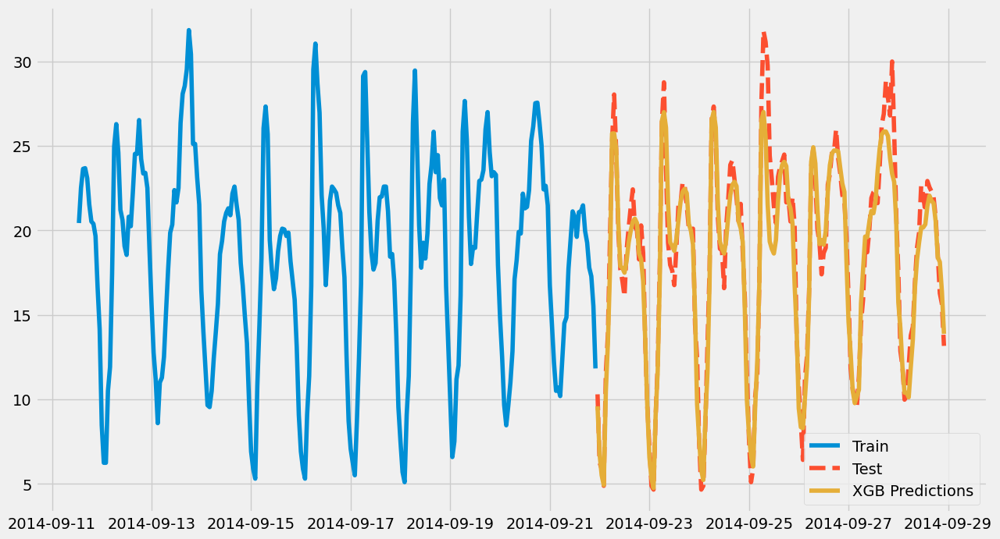

MAPE from XGB: 0.060383842561863986
MAE from XGB: 1.0810267037538346


C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

MAPE from FB prophet: 0.14836387901639134
MAE from FB prophet: 2.3949223732369544


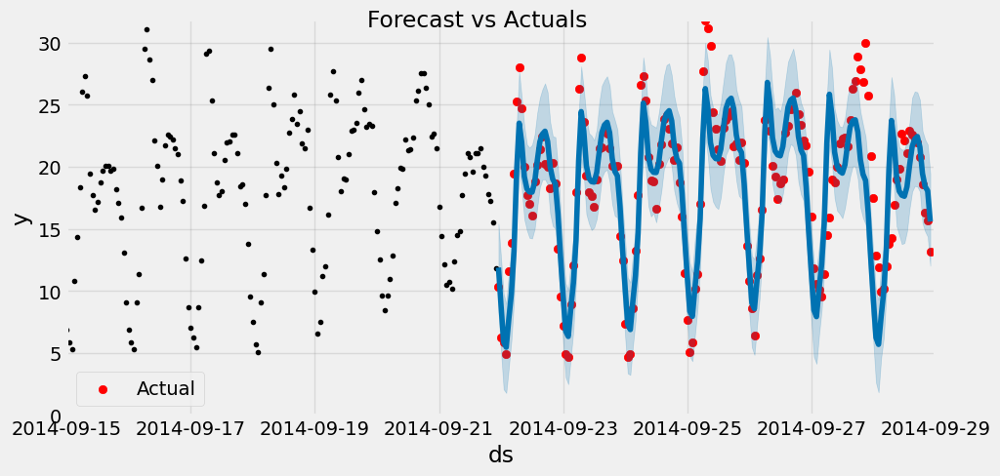

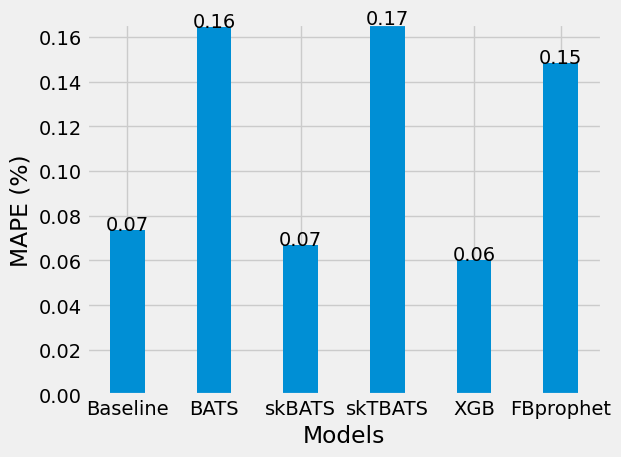

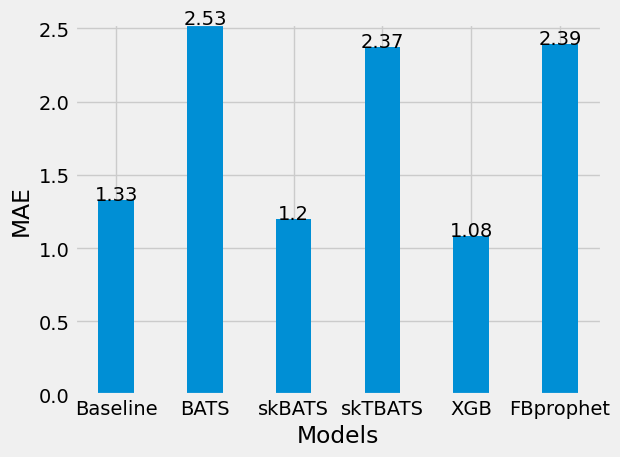

In [86]:
best_model(data, 5)

best model is XGB

### Cluster 5 predictions:

Data has been transformed with Boxcox, lambda value is : 0.4262645721665654


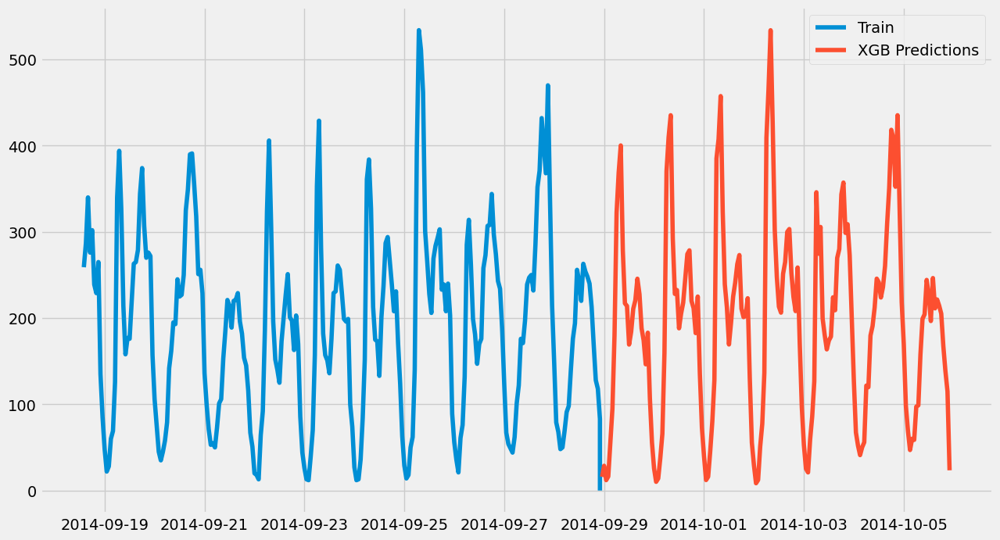

In [58]:
# Get data from user specified cluster
df = data[data['Cluster'] == 5]
    
# Aggregate data on hourly level
resample_df = df.copy()
resample_df.set_index('Date/Time', inplace=True)
hourly_rides = resample_df.resample('H')['Rides'].sum().reset_index().set_index('Date/Time')
    
# Make sure that date range is correct and fill missing values, when hours might be missing, with the average.
hourly_rides = hourly_rides.reindex(pd.date_range(start='2014-04-01 00:00:00', end='2014-09-28 22:00:00', freq='1H')).fillna(hourly_rides['Rides'].mean())
    
# Boxcox transformation
hourly_rides['Rides'], lv = boxcox(hourly_rides['Rides']+1)
print(f'Data has been transformed with Boxcox, lambda value is : {lv}')

# Create future dataframe values to predict
future_df = pd.DataFrame({'Date/Time': pd.date_range(start=hourly_rides.index[-1], periods=169, freq='h')})
future_df.set_index('Date/Time', inplace=True)
#future_df = future_df.iloc[1:]
# Concatenate original and future dataframes
xg_data = pd.concat([hourly_rides, future_df])
# Fill NaN values with '0', this is where we don't have values for the rides taken, we want to predict these values
xg_data.fillna(0, inplace=True)

# XGBoost
# Perform transformations in order to get it into the right format
xg_data.reset_index(inplace=True)
xg_data['Date/Time'] = pd.to_datetime(xg_data['index'])
xg_data['hour'] = xg_data['Date/Time'].dt.hour
xg_data['dayofweek'] = xg_data['Date/Time'].dt.dayofweek
xg_data['quarter'] = xg_data['Date/Time'].dt.quarter
xg_data['month'] = xg_data['Date/Time'].dt.month
xg_data['dayofyear'] = xg_data['Date/Time'].dt.dayofyear
xg_data['dayofmonth'] = xg_data['Date/Time'].dt.day
xg_data['weekofyear'] = (xg_data['Date/Time'].dt.isocalendar().week).astype(int)
xg_data.drop(columns=['index'], inplace=True)
xg_data.set_index('Date/Time', inplace=True)
    
# Create training and testing datasets
X, y = xg_data.iloc[:, 1:], xg_data[['Rides']]
X_train, y_train = X[:-168], y[:-168]
X_test = X[-168:]

# Create and fit model
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train, verbose=False) # Change verbose to True if you want to see it train

# Make predictions
xg_predictions = reg.predict(X_test)
xg_predictions_df = pd.DataFrame(xg_predictions, index=future_df.index[-168:], columns=['Rides'])

# Use inverse boxcox to get original values
y_train = (inv_boxcox(y_train, lv))-1
xg_predictions_df = (inv_boxcox(xg_predictions_df, lv))-1

# Visualize prediction data
fig, ax = plt.subplots(figsize=(14,8))
ax.plot(y_train[-250:], '-', label='Train')
ax.plot(xg_predictions_df, '-', label='XGB Predictions')
plt.legend(loc='best')
plt.show()

In [59]:
xg_predictions_df

,Rides
Date/Time,
2014-09-28 23:00:00,15.851448
2014-09-29 00:00:00,28.702593
2014-09-29 01:00:00,12.059476
2014-09-29 02:00:00,16.255442
2014-09-29 03:00:00,56.385540
...,...
2014-10-05 18:00:00,205.114029
2014-10-05 19:00:00,167.653152
2014-10-05 20:00:00,138.745987


***

## Cluster 6 modeling:

Data has been transformed with Boxcox, lambda value is : 0.284095784336811


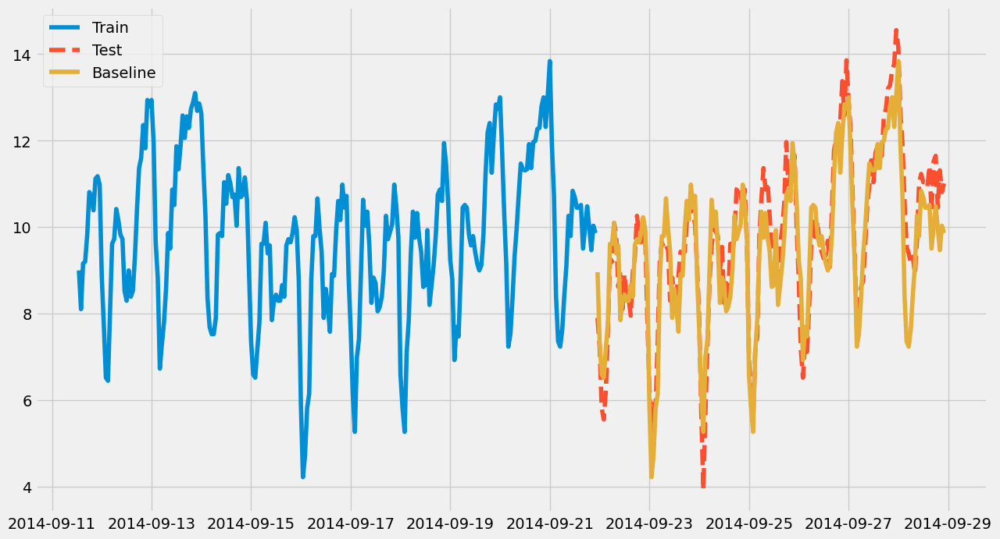

MAPE from baseline: 0.06599671323299962
MAE from baseline: 0.6143786659410703


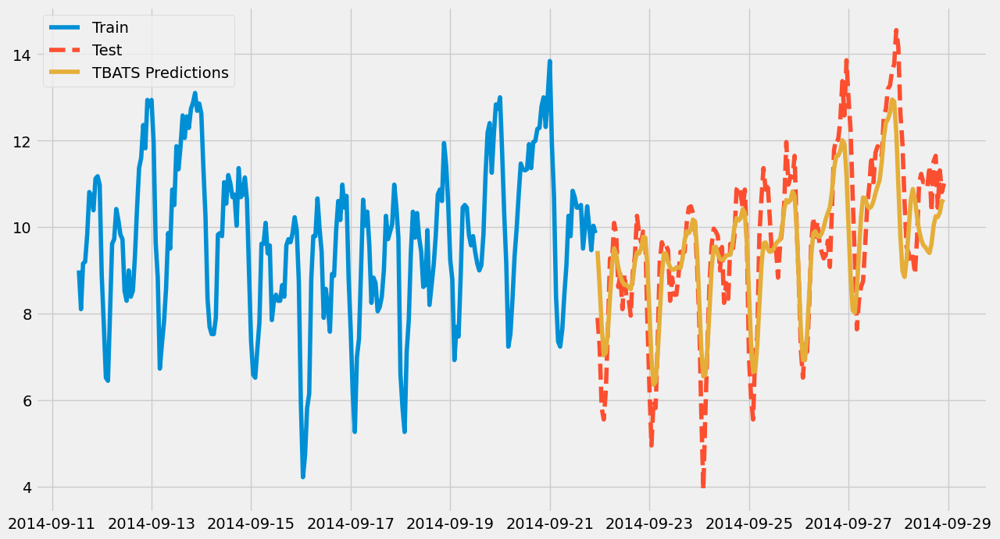

MAPE from TBATS: 0.08583781382002113
MAE from TBATS: 0.7905431676537719


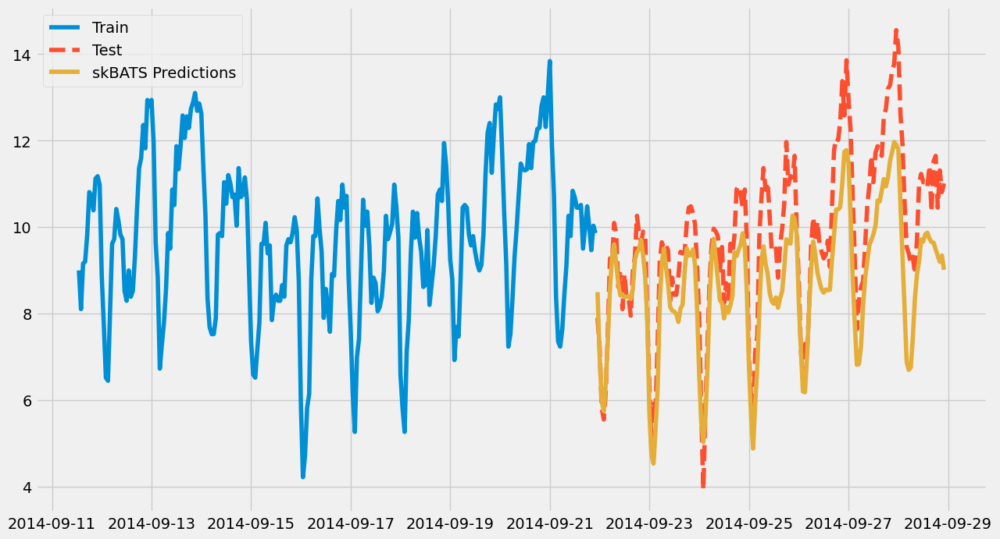

MAPE from skBATS: 0.10325098739783425
MAE from skBATS: 1.0440506032421342


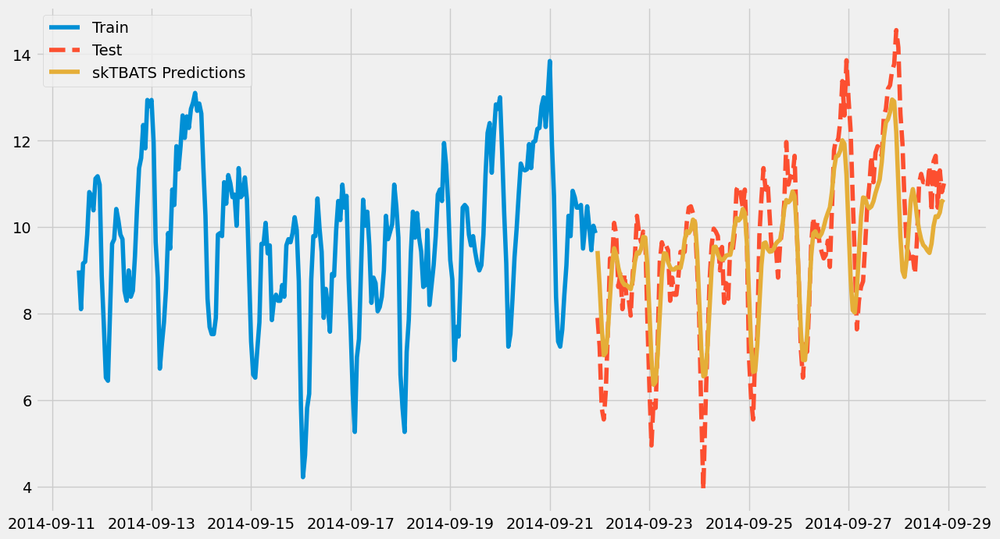

MAPE from skTBATS: 0.08583781382002113
MAE from skTBATS: 0.7905431676537719


C:\Users\erikn\AppData\Local\Temp\ipykernel_4840\871458659.py:152: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  xg_data['weekofyear'] = xg_data['Date/Time'].dt.weekofyear
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


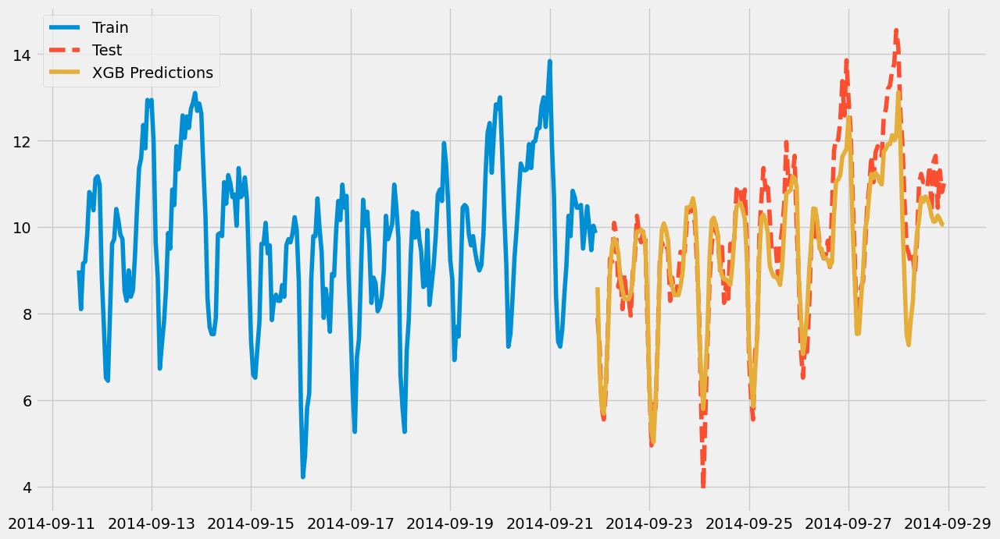

MAPE from XGB: 0.05755312840642737
MAE from XGB: 0.5592423222664578


C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

MAPE from FB prophet: 0.08290259479203034
MAE from FB prophet: 0.7703845343682303


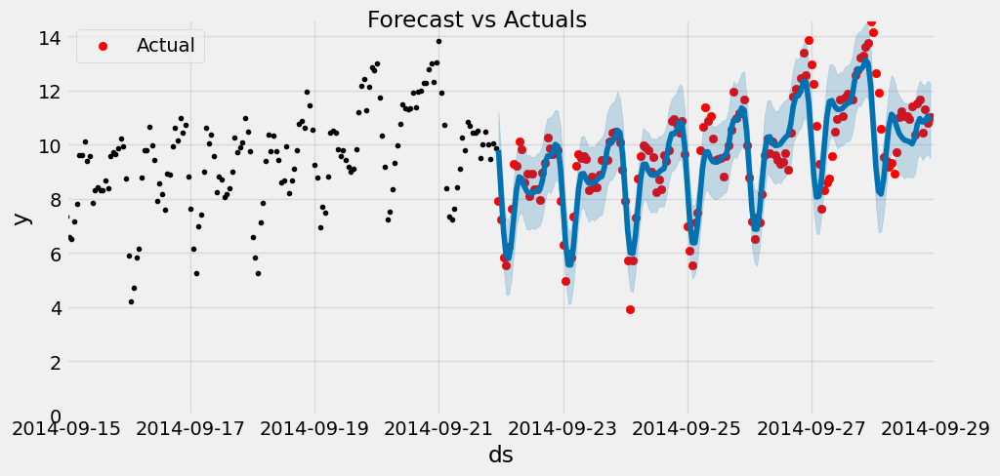

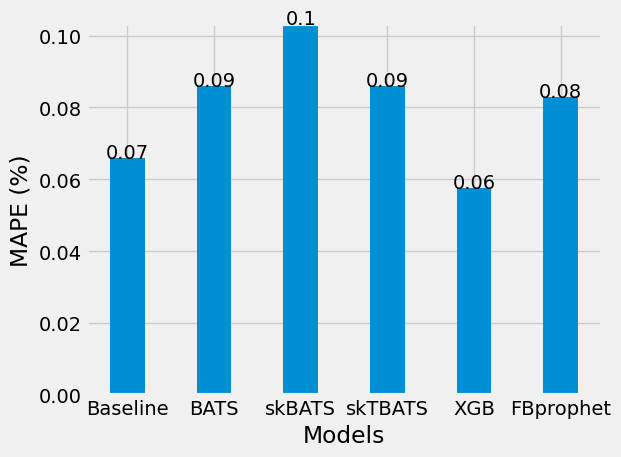

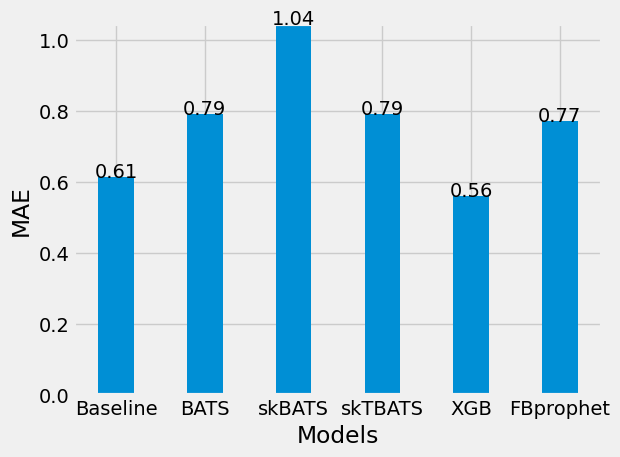

In [87]:
best_model(data, 6)

best model is XGB

### Cluster 6 predictions:

Data has been transformed with Boxcox, lambda value is : 0.284095784336811


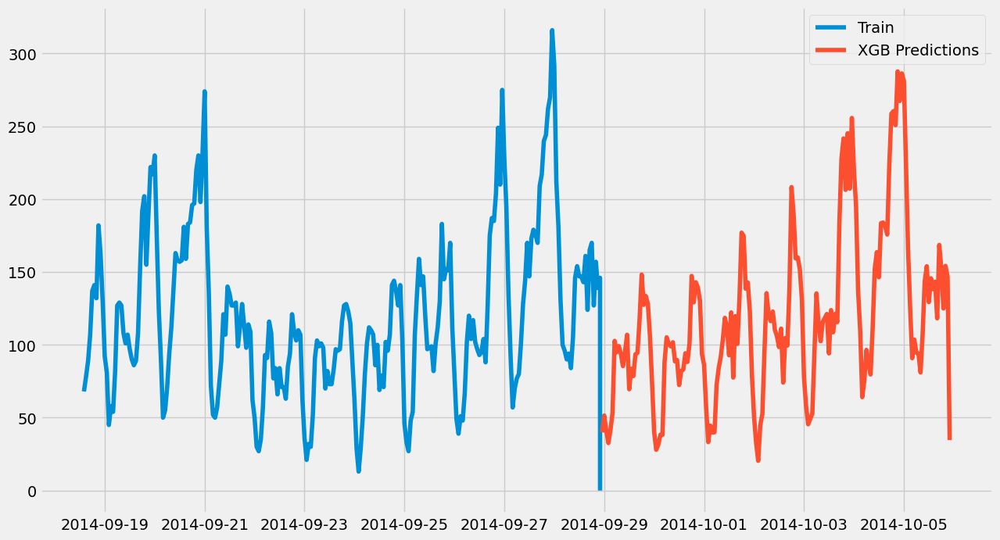

In [60]:
# Get data from user specified cluster
df = data[data['Cluster'] == 6]
    
# Aggregate data on hourly level
resample_df = df.copy()
resample_df.set_index('Date/Time', inplace=True)
hourly_rides = resample_df.resample('H')['Rides'].sum().reset_index().set_index('Date/Time')
    
# Make sure that date range is correct and fill missing values, when hours might be missing, with the average.
hourly_rides = hourly_rides.reindex(pd.date_range(start='2014-04-01 00:00:00', end='2014-09-28 22:00:00', freq='1H')).fillna(hourly_rides['Rides'].mean())
    
# Boxcox transformation
hourly_rides['Rides'], lv = boxcox(hourly_rides['Rides']+1)
print(f'Data has been transformed with Boxcox, lambda value is : {lv}')

# Create future dataframe values to predict
future_df = pd.DataFrame({'Date/Time': pd.date_range(start=hourly_rides.index[-1], periods=169, freq='h')})
future_df.set_index('Date/Time', inplace=True)
#future_df = future_df.iloc[1:]
# Concatenate original and future dataframes
xg_data = pd.concat([hourly_rides, future_df])
# Fill NaN values with '0', this is where we don't have values for the rides taken, we want to predict these values
xg_data.fillna(0, inplace=True)

# XGBoost
# Perform transformations in order to get it into the right format
xg_data.reset_index(inplace=True)
xg_data['Date/Time'] = pd.to_datetime(xg_data['index'])
xg_data['hour'] = xg_data['Date/Time'].dt.hour
xg_data['dayofweek'] = xg_data['Date/Time'].dt.dayofweek
xg_data['quarter'] = xg_data['Date/Time'].dt.quarter
xg_data['month'] = xg_data['Date/Time'].dt.month
xg_data['dayofyear'] = xg_data['Date/Time'].dt.dayofyear
xg_data['dayofmonth'] = xg_data['Date/Time'].dt.day
xg_data['weekofyear'] = (xg_data['Date/Time'].dt.isocalendar().week).astype(int)
xg_data.drop(columns=['index'], inplace=True)
xg_data.set_index('Date/Time', inplace=True)
    
# Create training and testing datasets
X, y = xg_data.iloc[:, 1:], xg_data[['Rides']]
X_train, y_train = X[:-168], y[:-168]
X_test = X[-168:]

# Create and fit model
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train, verbose=False) # Change verbose to True if you want to see it train

# Make predictions
xg_predictions = reg.predict(X_test)
xg_predictions_df = pd.DataFrame(xg_predictions, index=future_df.index[-168:], columns=['Rides'])

# Use inverse boxcox to get original values
y_train = (inv_boxcox(y_train, lv))-1
xg_predictions_df = (inv_boxcox(xg_predictions_df, lv))-1

# Visualize prediction data
fig, ax = plt.subplots(figsize=(14,8))
ax.plot(y_train[-250:], '-', label='Train')
ax.plot(xg_predictions_df, '-', label='XGB Predictions')
plt.legend(loc='best')
plt.show()

In [61]:
xg_predictions_df

,Rides
Date/Time,
2014-09-28 23:00:00,39.913452
2014-09-29 00:00:00,51.467300
2014-09-29 01:00:00,41.085209
2014-09-29 02:00:00,32.611057
2014-09-29 03:00:00,41.544518
...,...
2014-10-05 18:00:00,152.343811
2014-10-05 19:00:00,124.958000
2014-10-05 20:00:00,154.207428


***

## Cluster 7 modeling:

Data has been transformed with Boxcox, lambda value is : 0.28729296384737973


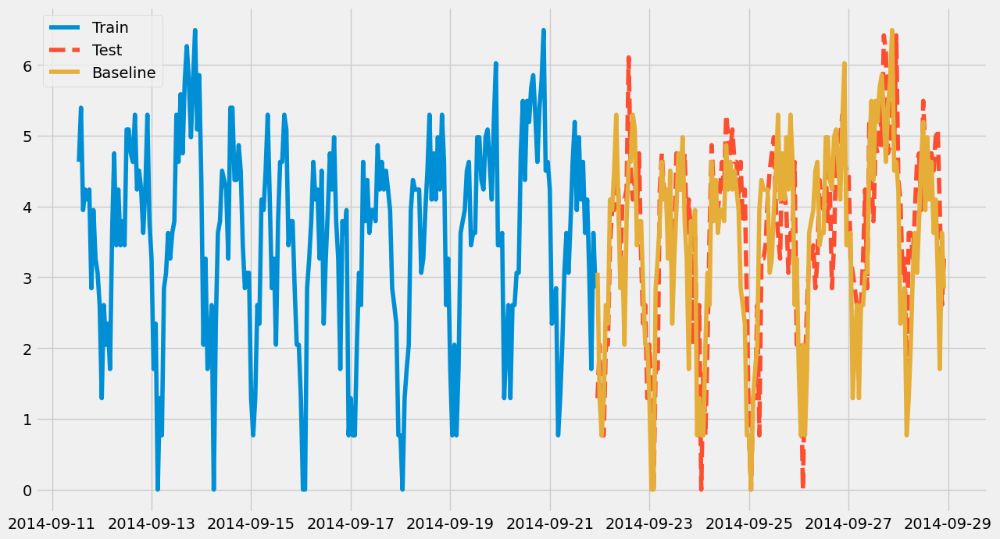

MAPE from baseline: 75412411204059.38
MAE from baseline: 0.7902330384269414


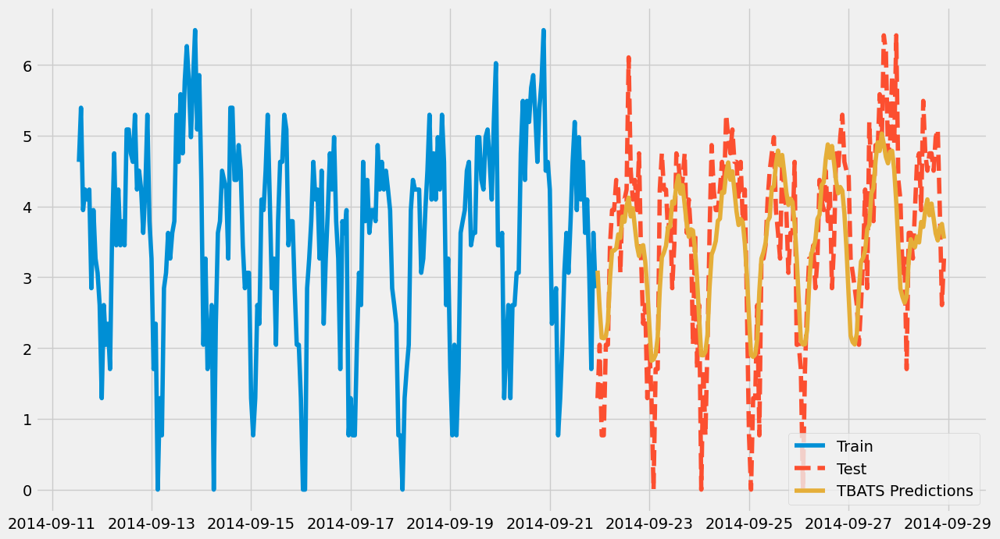

MAPE from TBATS: 206160503205851.34
MAE from TBATS: 0.6977603074800401


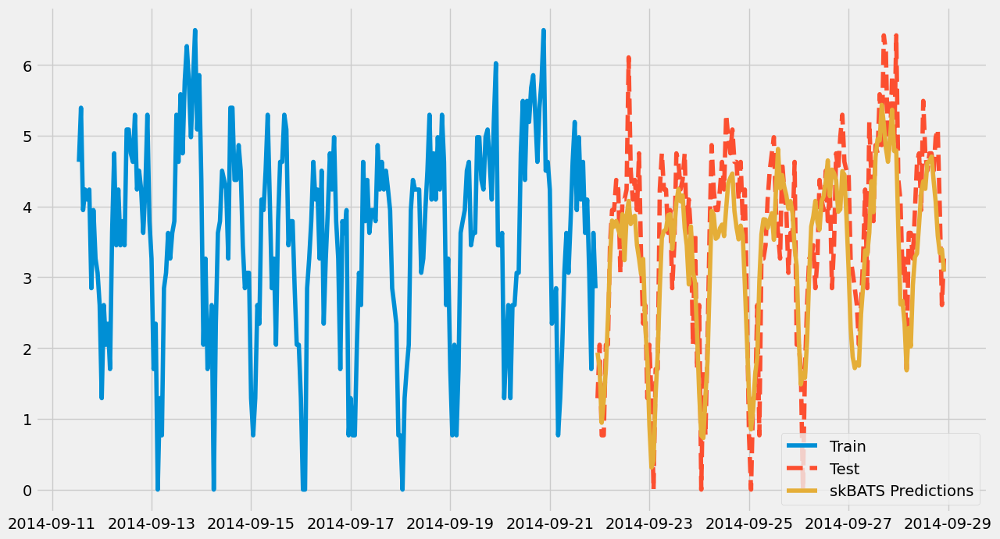

MAPE from skBATS: 98490204190373.97
MAE from skBATS: 0.6341073100505542


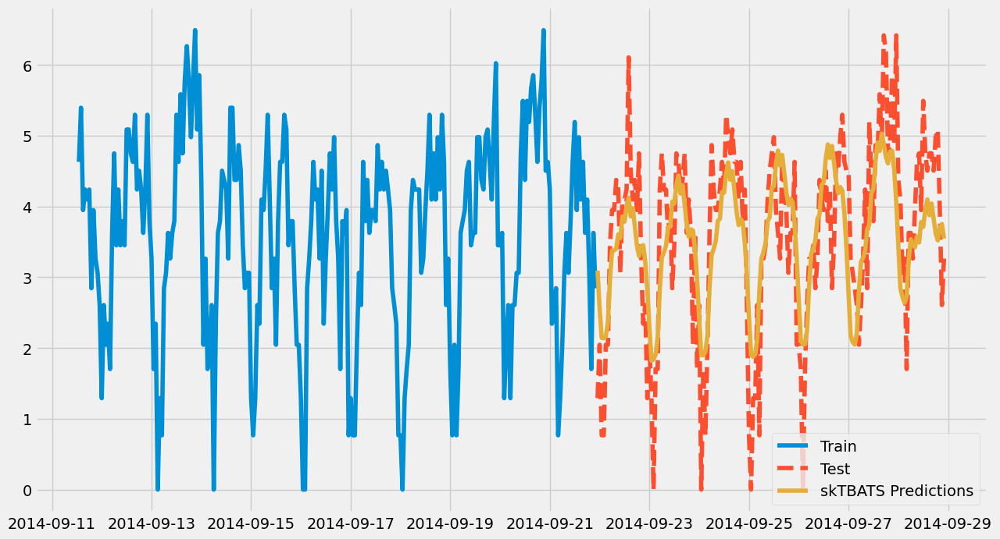

MAPE from skTBATS: 206160503205851.34
MAE from skTBATS: 0.6977603074800401


C:\Users\erikn\AppData\Local\Temp\ipykernel_4840\871458659.py:152: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  xg_data['weekofyear'] = xg_data['Date/Time'].dt.weekofyear
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


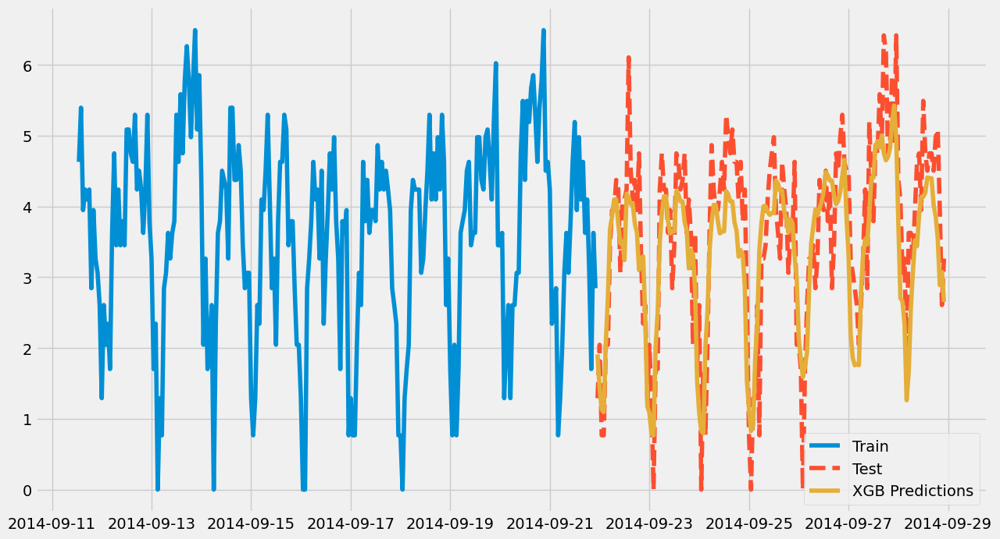

MAPE from XGB: 107382463953383.81
MAE from XGB: 0.6297740083023423


C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

MAPE from FB prophet: 154115326608895.0
MAE from FB prophet: 0.7109512500946493


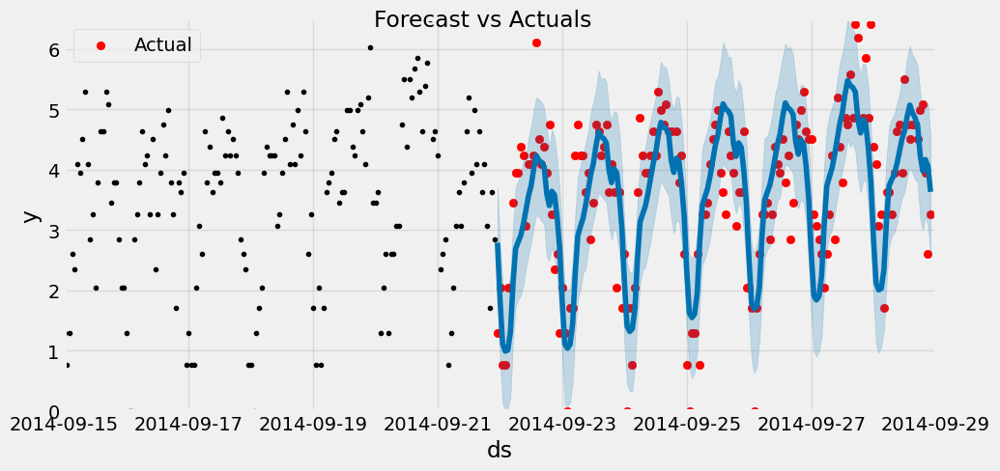

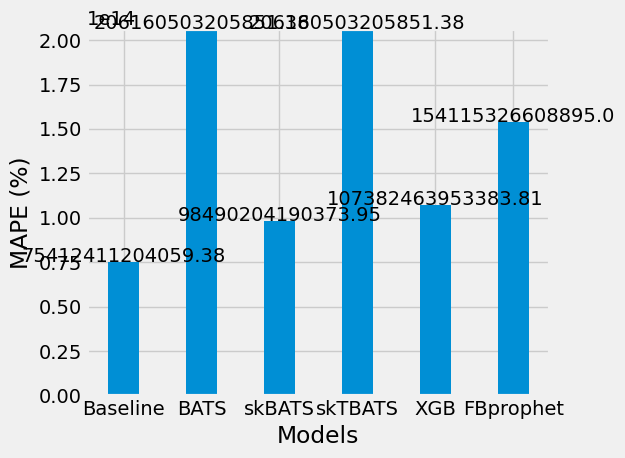

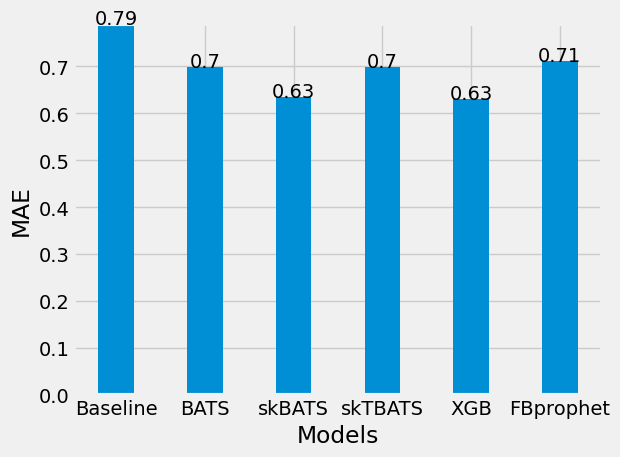

In [89]:
best_model(data, 7)

Based on the MAE, skBATS and XGB are similar, however the skBATS model shows a better MAPE, therefore I will choose the skBATS model.

### Cluster 7 predictions:

Data has been transformed with Boxcox, lambda value is : 0.28729296384737973


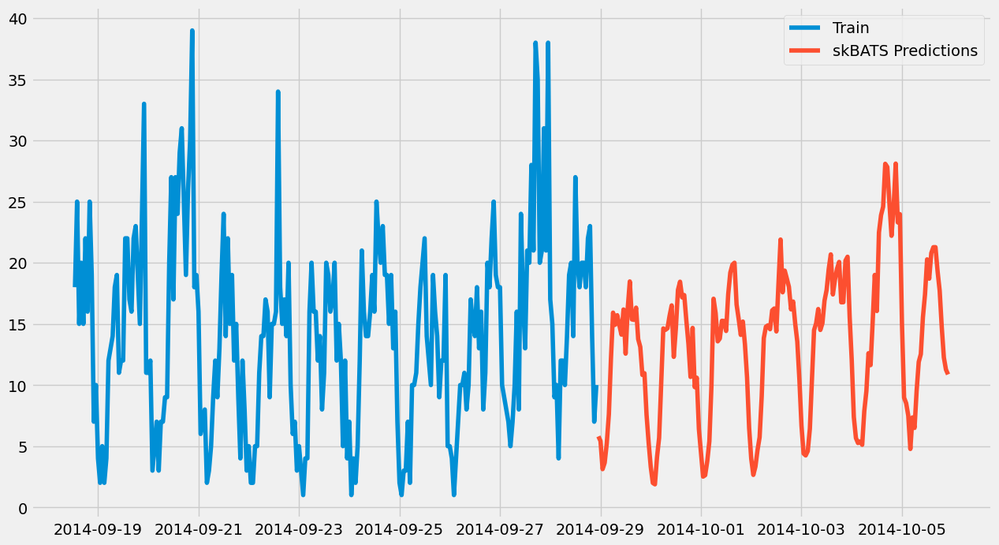

In [64]:
df = data[data['Cluster'] == 7]
    
# Aggregate data on hourly level
resample_df = df.copy()
resample_df.set_index('Date/Time', inplace=True)
hourly_rides = resample_df.resample('H')['Rides'].sum().reset_index().set_index('Date/Time')
    
# Make sure that date range is correct and fill missing values, when hours might be missing, with the average.
hourly_rides = hourly_rides.reindex(pd.date_range(start='2014-04-01 00:00:00', end='2014-09-28 22:00:00', freq='1H')).fillna(hourly_rides['Rides'].mean())
    
# Boxcox transformation
hourly_rides['Rides'], lv = boxcox(hourly_rides['Rides']+1)
print(f'Data has been transformed with Boxcox, lambda value is : {lv}')
    

# BATS using sktime library
# Create array of future predictions that we want. In this case we want to predict the next week, which is 168 hours
fh = np.arange(1, 169)

# Create BATS Model 
bats_forecaster = skBATS(use_box_cox=False,
                      use_trend=False,
                      use_damped_trend=False,
                      sp=[24, 168])# SP = seasonal period, 24  = Daily, 168 = Weekly

# Create forecasts
bats_forecaster.fit(hourly_rides)
y_pred_BATS = bats_forecaster.predict(fh)

# Get inverse of Boxcox again
hourly_rides['Rides'] = inv_boxcox(hourly_rides['Rides'], lv)
y_pred_BATS['Rides'] = inv_boxcox(y_pred_BATS['Rides'], lv)

# Visualize data
fig, ax = plt.subplots(figsize=(14,8))
ax.plot(hourly_rides[-250:], '-', label='Train')
ax.plot(y_pred_BATS, '-', label='skBATS Predictions')
plt.legend(loc='best')
plt.show()

In [65]:
y_pred_BATS

,Rides
2014-09-28 23:00:00,5.799457
2014-09-29 00:00:00,5.425449
2014-09-29 01:00:00,3.119636
2014-09-29 02:00:00,3.644881
2014-09-29 03:00:00,5.234595
...,...
2014-10-05 18:00:00,17.723589
2014-10-05 19:00:00,14.728322
2014-10-05 20:00:00,12.254833
2014-10-05 21:00:00,11.263624


***

## Cluster 8 modeling:

Data has been transformed with Boxcox, lambda value is : -0.08376097282805693


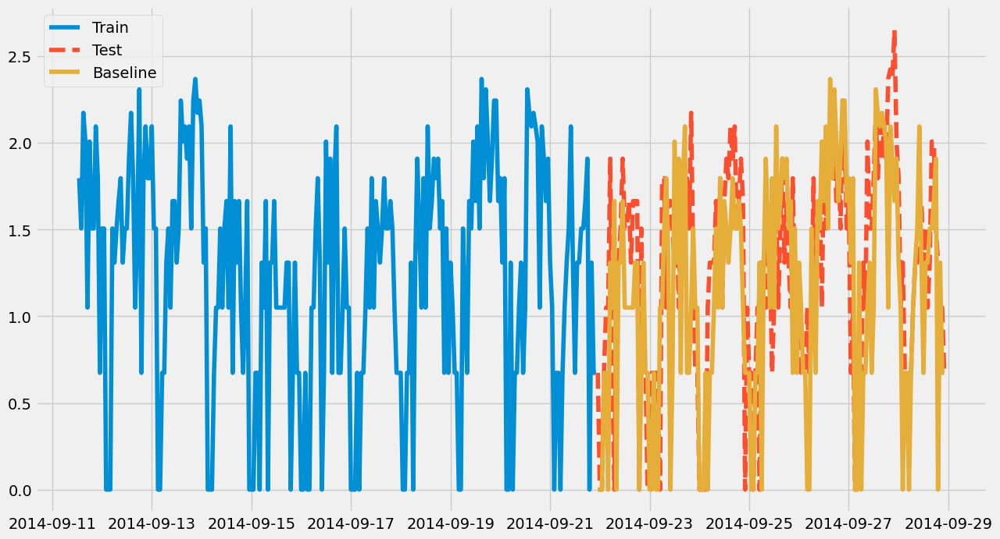

MAPE from baseline: 161980289630903.56
MAE from baseline: 0.43519253763103516


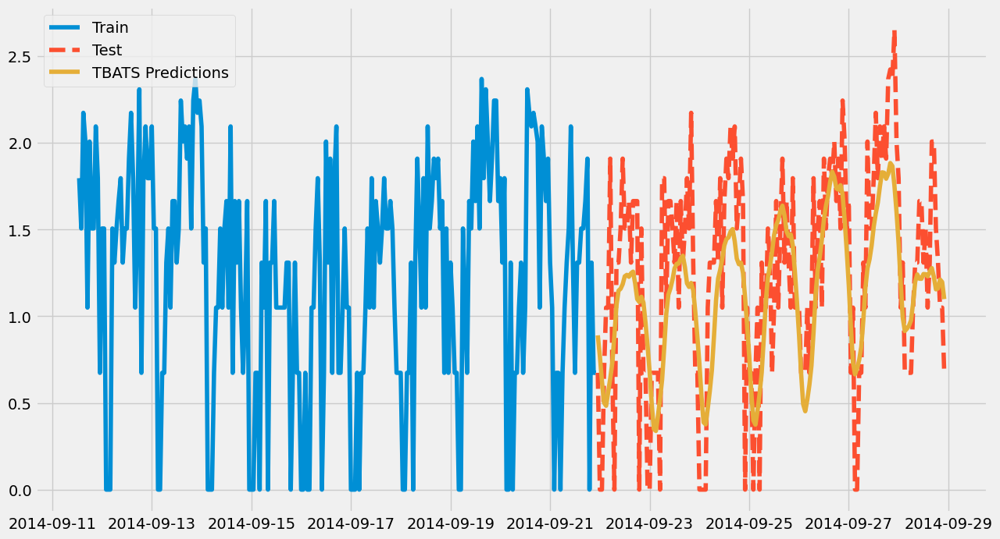

MAPE from TBATS: 290462408210476.4
MAE from TBATS: 0.36408631269448766


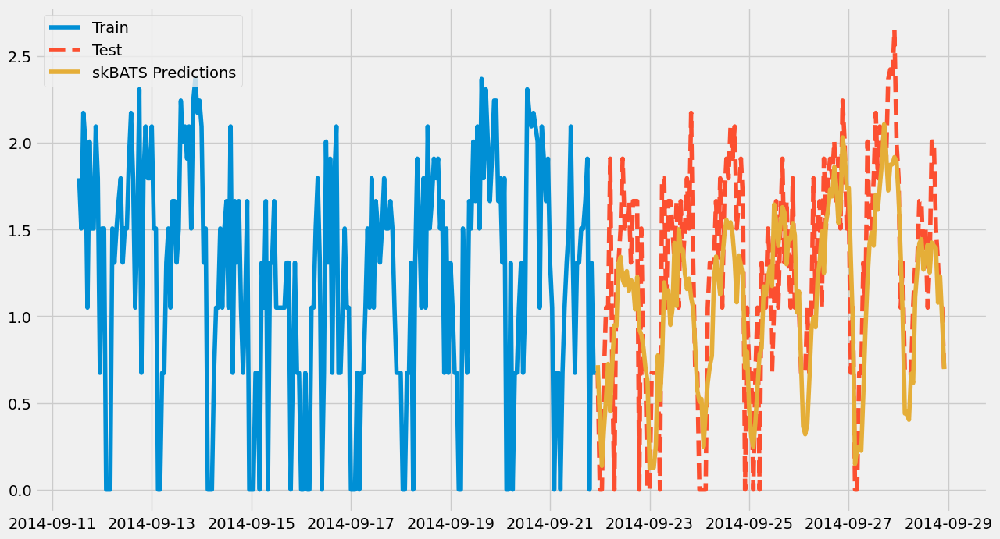

MAPE from skBATS: 201554187110075.75
MAE from skBATS: 0.3366675951038718


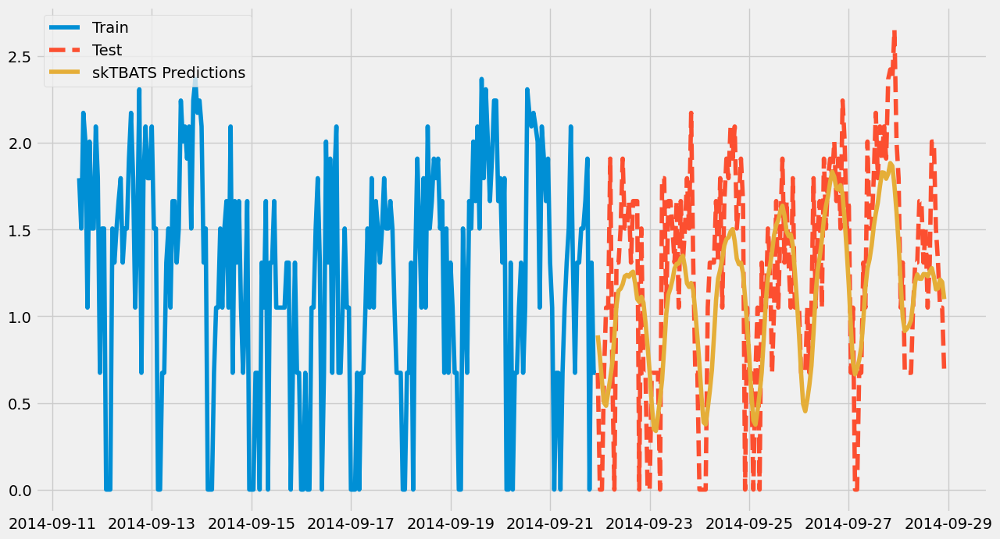

MAPE from skTBATS: 290462408210476.4
MAE from skTBATS: 0.36408631269448766


C:\Users\erikn\AppData\Local\Temp\ipykernel_4840\871458659.py:152: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  xg_data['weekofyear'] = xg_data['Date/Time'].dt.weekofyear
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


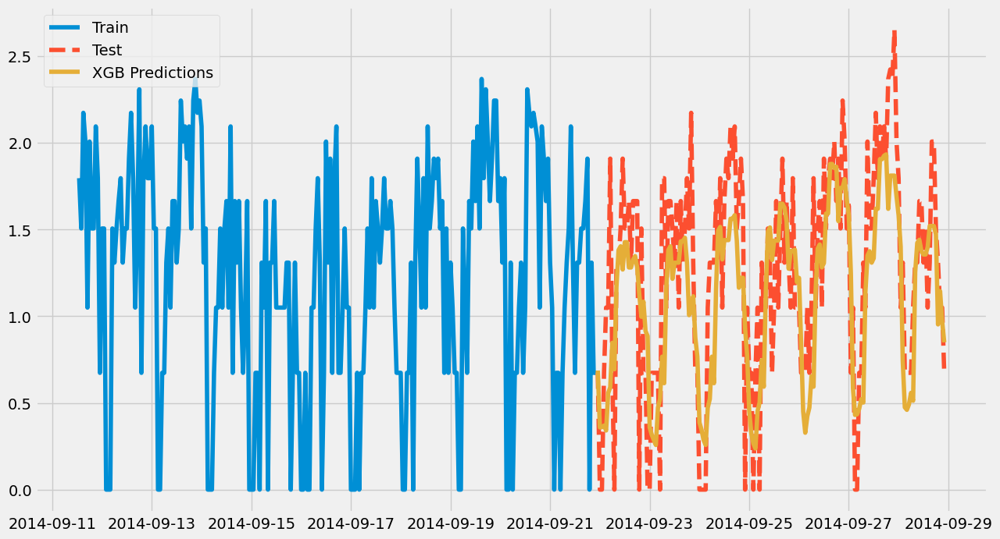

MAPE from XGB: 218277743789592.56
MAE from XGB: 0.34764868373360286


C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

MAPE from FB prophet: 280872699183963.0
MAE from FB prophet: 0.36147349853883004


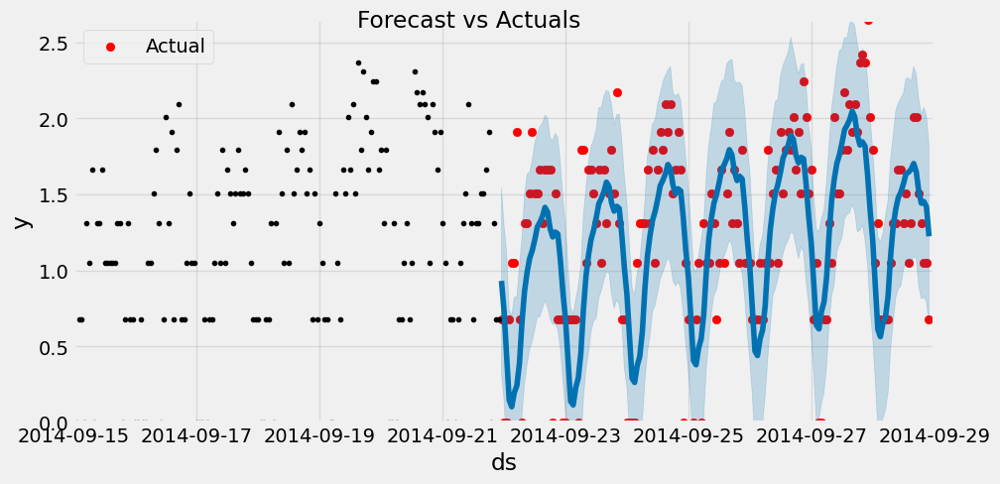

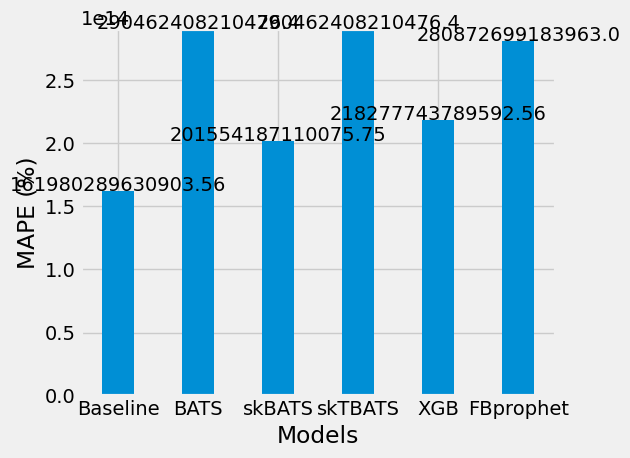

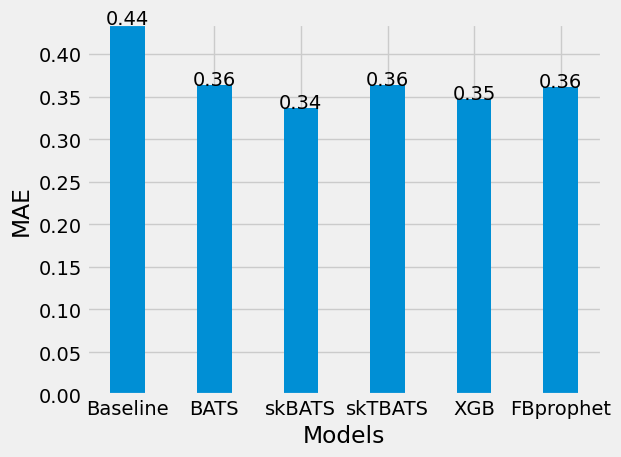

In [90]:
best_model(data, 8)

best model is skBATS

### Cluster 8 predictions:

Data has been transformed with Boxcox, lambda value is : -0.08376097282805693


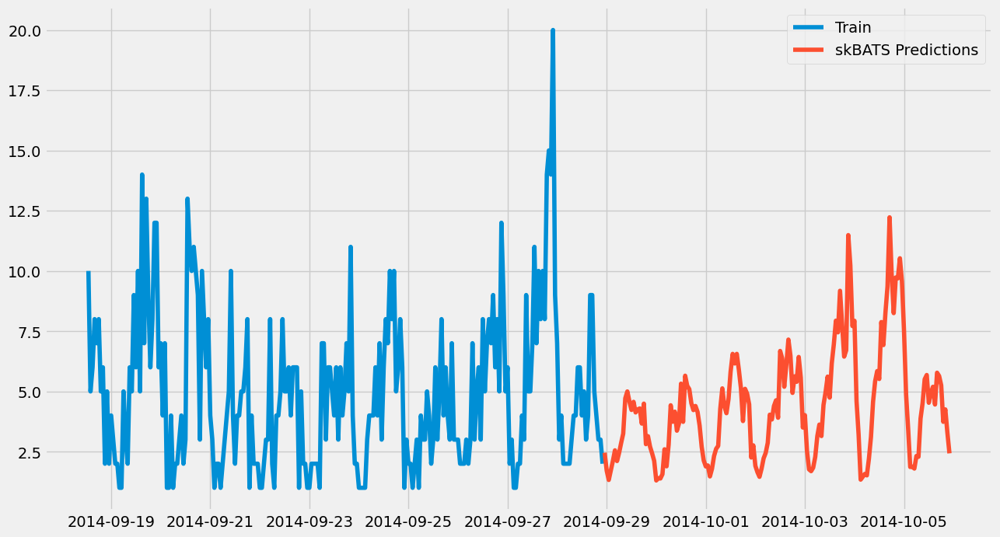

In [62]:
df = data[data['Cluster'] == 8]
    
# Aggregate data on hourly level
resample_df = df.copy()
resample_df.set_index('Date/Time', inplace=True)
hourly_rides = resample_df.resample('H')['Rides'].sum().reset_index().set_index('Date/Time')
    
# Make sure that date range is correct and fill missing values, when hours might be missing, with the average.
hourly_rides = hourly_rides.reindex(pd.date_range(start='2014-04-01 00:00:00', end='2014-09-28 22:00:00', freq='1H')).fillna(hourly_rides['Rides'].mean())
    
# Boxcox transformation
hourly_rides['Rides'], lv = boxcox(hourly_rides['Rides']+1)
print(f'Data has been transformed with Boxcox, lambda value is : {lv}')
    

# BATS using sktime library
# Create array of future predictions that we want. In this case we want to predict the next week, which is 168 hours
fh = np.arange(1, 169)

# Create BATS Model 
bats_forecaster = skBATS(use_box_cox=False,
                      use_trend=False,
                      use_damped_trend=False,
                      sp=[24, 168])# SP = seasonal period, 24  = Daily, 168 = Weekly

# Create forecasts
bats_forecaster.fit(hourly_rides)
y_pred_BATS = bats_forecaster.predict(fh)

# Get inverse of Boxcox again
hourly_rides['Rides'] = inv_boxcox(hourly_rides['Rides'], lv)
y_pred_BATS['Rides'] = inv_boxcox(y_pred_BATS['Rides'], lv)

# Visualize data
fig, ax = plt.subplots(figsize=(14,8))
ax.plot(hourly_rides[-250:], '-', label='Train')
ax.plot(y_pred_BATS, '-', label='skBATS Predictions')
plt.legend(loc='best')
plt.show()

In [63]:
y_pred_BATS

,Rides
2014-09-28 23:00:00,2.456640
2014-09-29 00:00:00,1.712605
2014-09-29 01:00:00,1.325813
2014-09-29 02:00:00,1.728085
2014-09-29 03:00:00,2.116449
...,...
2014-10-05 18:00:00,5.254349
2014-10-05 19:00:00,3.738347
2014-10-05 20:00:00,4.254520
2014-10-05 21:00:00,3.288328


***

## Cluster 9 modeling:

Data has been transformed with Boxcox, lambda value is : 0.3720749168997044


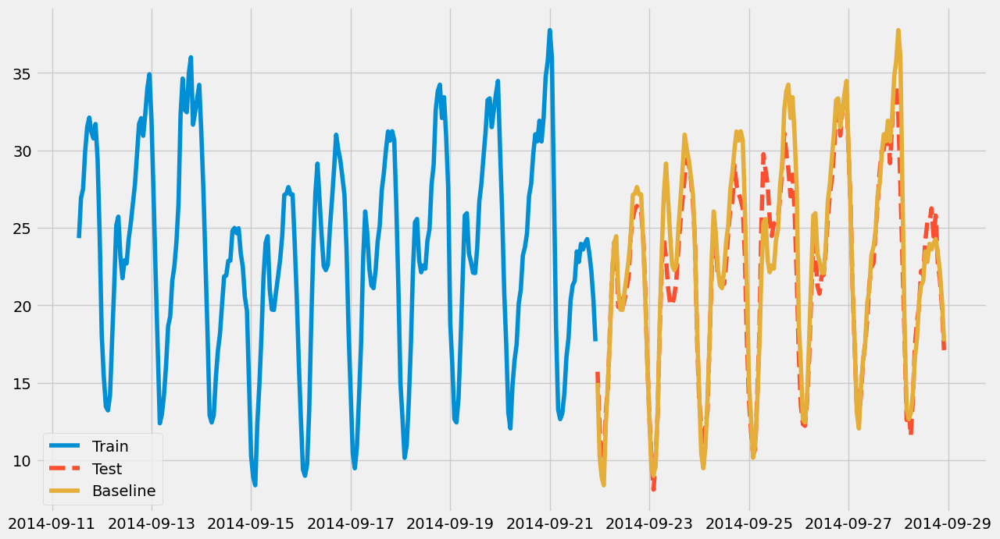

MAPE from baseline: 0.060291917458818206
MAE from baseline: 1.353369472840726


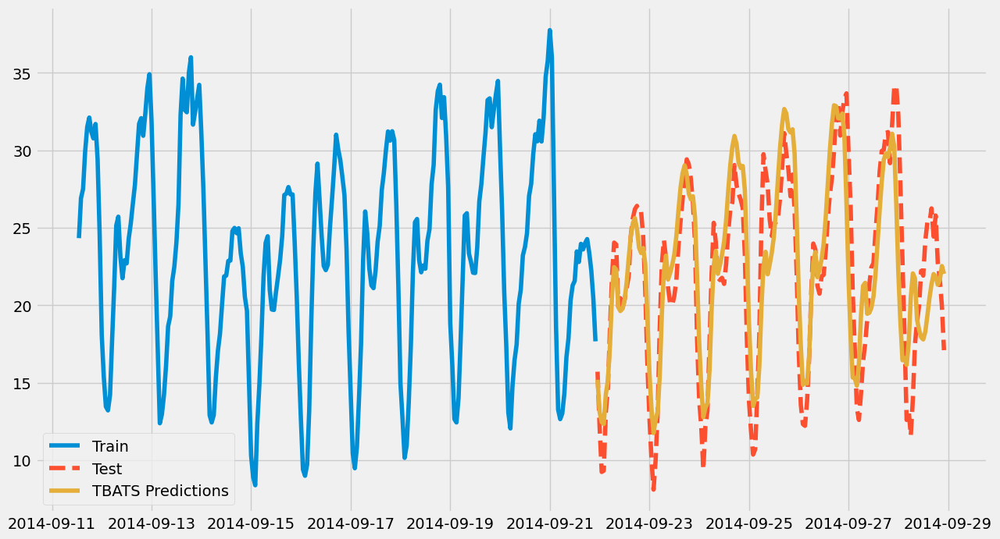

MAPE from TBATS: 0.1319815802232009
MAE from TBATS: 2.6100442992467805


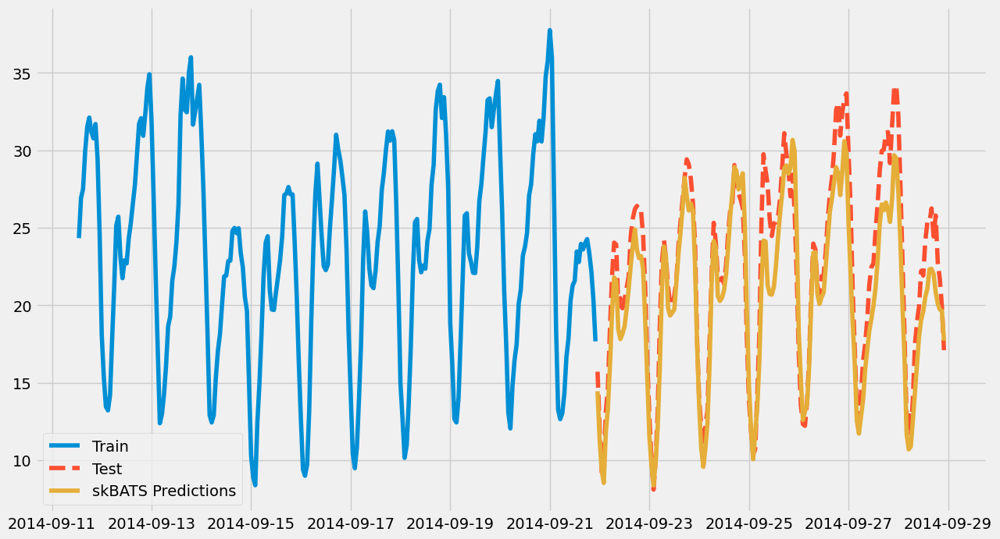

MAPE from skBATS: 0.0829460028525111
MAE from skBATS: 1.9169428462849427


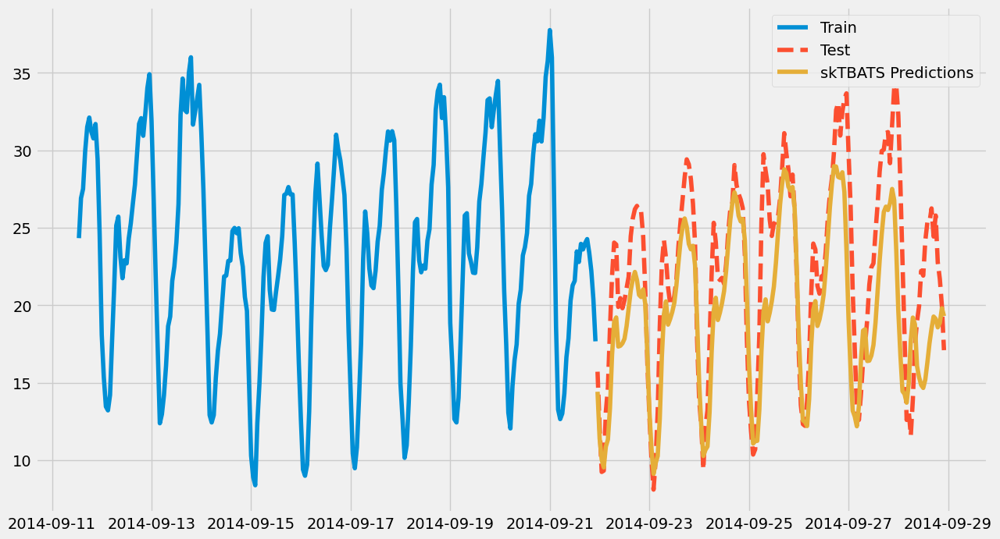

MAPE from skTBATS: 0.14553625543885024
MAE from skTBATS: 3.3231187744669635


C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


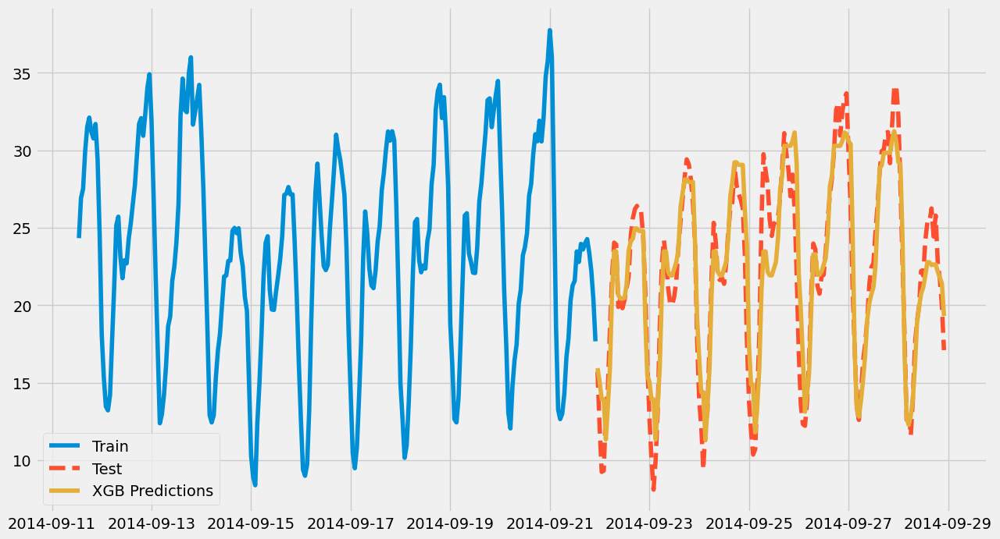

MAPE from XGB: 0.08874700916213638
MAE from XGB: 1.6572202197898709


C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\erikn\anaconda3\envs\tsa_env\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

MAPE from FB prophet: 0.1589296343123678
MAE from FB prophet: 3.0465924553248467


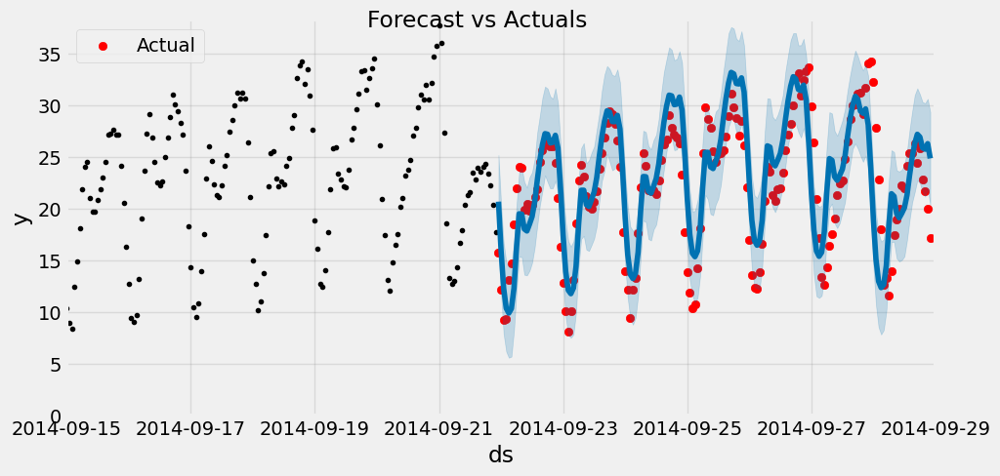

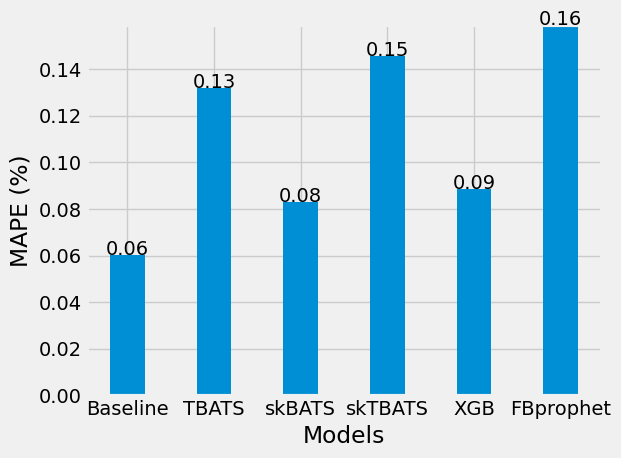

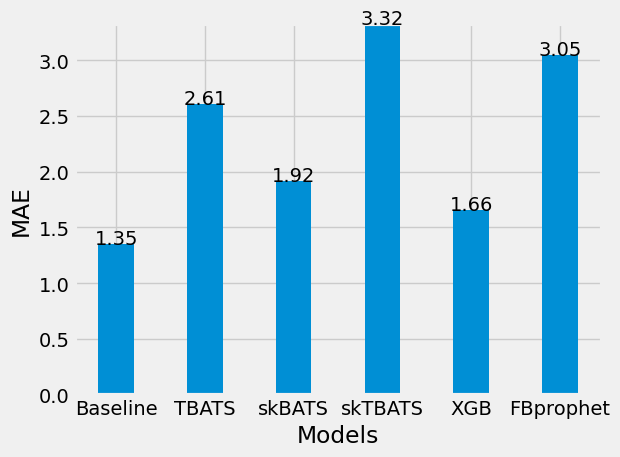

In [65]:
best_model(data, 9)

As we can see, we are unable to beat our Baseliine model, which is not good news. The best model is the XGBoost model, for which we can create code to gridsearch for the best parameters. Although, a simple solution is to use skBATS which came in second place, and trun the model's own Box-Cox transformation to True, this results in a MAE score of 1.29 and thus I will use that model to forecast.

Data has been transformed with Boxcox, lambda value is : 0.3720749168997044


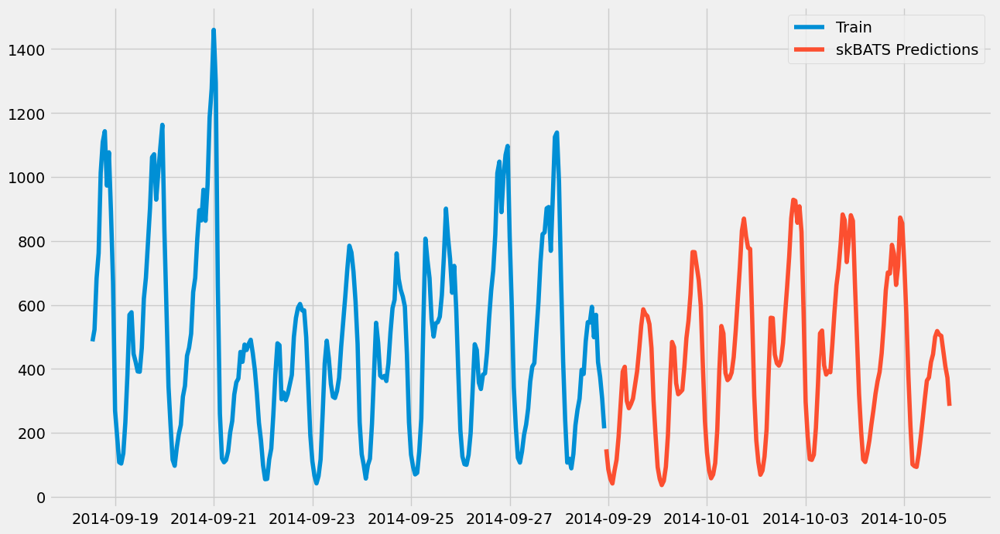

In [66]:
df = data[data['Cluster'] == 9]
    
# Aggregate data on hourly level
resample_df = df.copy()
resample_df.set_index('Date/Time', inplace=True)
hourly_rides = resample_df.resample('H')['Rides'].sum().reset_index().set_index('Date/Time')
    
# Make sure that date range is correct and fill missing values, when hours might be missing, with the average.
hourly_rides = hourly_rides.reindex(pd.date_range(start='2014-04-01 00:00:00', end='2014-09-28 22:00:00', freq='1H')).fillna(hourly_rides['Rides'].mean())
    
# Boxcox transformation
hourly_rides['Rides'], lv = boxcox(hourly_rides['Rides']+1)
print(f'Data has been transformed with Boxcox, lambda value is : {lv}')
    

# BATS using sktime library
# Create array of future predictions that we want. In this case we want to predict the next week, which is 168 hours
fh = np.arange(1, 169)

# Create BATS Model 
bats_forecaster = skBATS(use_box_cox=True,
                      use_trend=False,
                      use_damped_trend=False,
                      sp=[24, 168])# SP = seasonal period, 24  = Daily, 168 = Weekly

# Create forecasts
bats_forecaster.fit(hourly_rides)
y_pred_BATS = bats_forecaster.predict(fh)

# Get inverse of Boxcox again
hourly_rides['Rides'] = inv_boxcox(hourly_rides['Rides'], lv)
y_pred_BATS['Rides'] = inv_boxcox(y_pred_BATS['Rides'], lv)

# Visualize data
fig, ax = plt.subplots(figsize=(14,8))
ax.plot(hourly_rides[-250:], '-', label='Train')
ax.plot(y_pred_BATS, '-', label='skBATS Predictions')
plt.legend(loc='best')
plt.show()

In [67]:
y_pred_BATS

,Rides
2014-09-28 23:00:00,148.531155
2014-09-29 00:00:00,85.787447
2014-09-29 01:00:00,55.418592
2014-09-29 02:00:00,41.670747
2014-09-29 03:00:00,81.534591
...,...
2014-10-05 18:00:00,503.206494
2014-10-05 19:00:00,455.957897
2014-10-05 20:00:00,407.437700
2014-10-05 21:00:00,372.198793


***

#### Why we use Box-Cox transform:

results:

With boxcox on cluster '0':
- Baseline mape: 0.087
- TBATS mape: 0.138
- skBATS mape: 0.074
- skTBATS mape: 0.246
- XGBoost mape: 0.081
- FBprophet mape: 0.13

Without boxcox on cluster '0':
- Baseline mape: 0.1794
- TBATS mape: 0.4314
- skBATS mape: 0.16
- skTBATS mape: 0.57
- XGBoost mape: 0.1793
- FBprophet mape: 0.33

We can clearly see that using the Box-Cox transformation improves our MAPE, which scores how well our model fits to the data

***

## Map visualizations:

In [48]:
cluster_location = data.groupby(['Cluster'])[['Lat', 'Lon']].mean()

cl_1 = cluster_location.loc[0]
cl_2 = cluster_location.loc[1]
cl_3 = cluster_location.loc[2]
cl_4 = cluster_location.loc[3]
cl_5 = cluster_location.loc[4]
cl_6 = cluster_location.loc[5]
cl_7 = cluster_location.loc[6]
cl_8 = cluster_location.loc[7]
cl_9 = cluster_location.loc[8]
cl_10 = cluster_location.loc[9]

#### Heatmap of Rides:

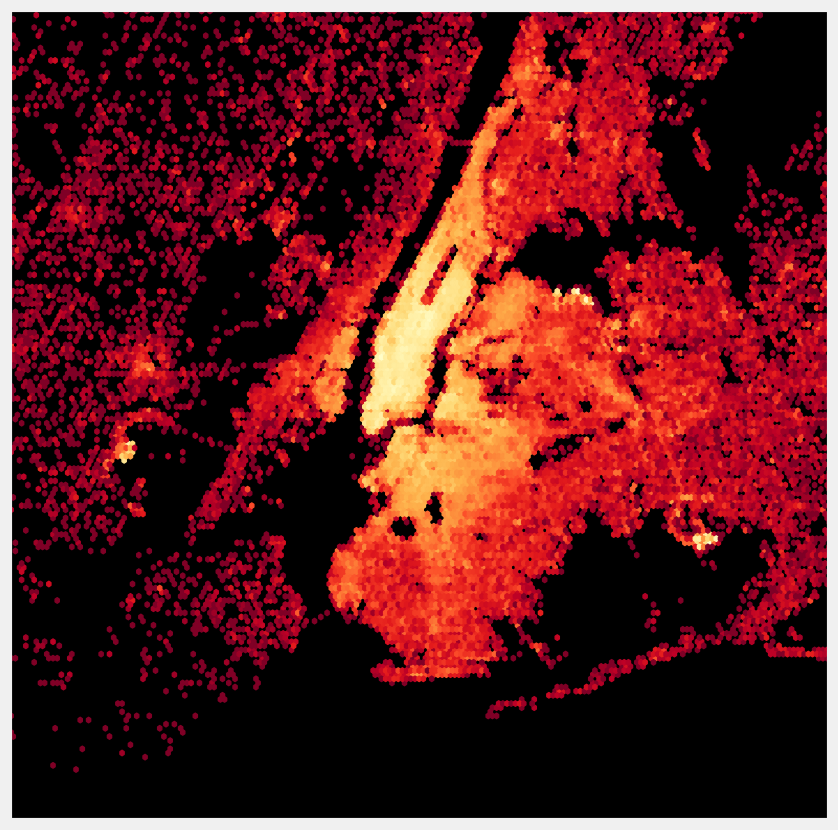

In [49]:
west, south, east, north = -74.26, 40.50, -73.70, 40.92

fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(111)
m = Basemap(projection='merc', llcrnrlat=south, urcrnrlat=north,
            llcrnrlon=west, urcrnrlon=east, lat_ts=south, resolution='i')
x, y = m(data['Lon'].values, data['Lat'].values)
m.hexbin(x, y, gridsize=1000,bins='log', cmap='YlOrRd_r')
#ax.set_facecolor('#FA8072')
ax.set_facecolor('black')

#### Cluster map:

In [50]:
m = folium.Map(location = [40.73, -74], tiles ='OpenStreetMap', zoom_start=10)
#markerCluster = MarkerCluster().add_to(m)

# Make circle locations on map according to the clusters created above, average center location. This will draw 10 circles.
folium.Circle(radius=2000,location=[cl_1[0], cl_1[1]],color='darkblue',fill=False,).add_to(m)
folium.Circle(radius=2000,location=[cl_2[0], cl_2[1]],color='orange',fill=False,).add_to(m)
folium.Circle(radius=2000,location=[cl_3[0], cl_3[1]],color='darkgreen',fill=False,).add_to(m)
folium.Circle(radius=2000,location=[cl_4[0], cl_4[1]],color='red',fill=False,).add_to(m)
folium.Circle(radius=2000,location=[cl_5[0], cl_5[1]],color='purple',fill=False,).add_to(m)
folium.Circle(radius=2000,location=[cl_6[0], cl_6[1]],color='brown',fill=False,).add_to(m)
folium.Circle(radius=2000,location=[cl_7[0], cl_7[1]],color='pink',fill=False,).add_to(m)
folium.Circle(radius=2000,location=[cl_8[0], cl_8[1]],color='gray',fill=False,).add_to(m)
folium.Circle(radius=2000,location=[cl_9[0], cl_9[1]],color='lightgreen',fill=False,).add_to(m)
folium.Circle(radius=2000,location=[cl_10[0], cl_10[1]],color='lightblue',fill=False,).add_to(m)

In [51]:
m

***

Code resources:

https://www.statsmodels.org/dev/generated/statsmodels.tsa.seasonal.MSTL.html

https://medium.com/intive-developers/forecasting-time-series-with-multiple-seasonalities-using-tbats-in-python-398a00ac0e8a

https://builtin.com/data-science/time-series-forecasting-python

https://www.analyticsvidhya.com/blog/2022/06/time-series-forecasting-using-python/

https://www.kaggle.com/code/robikscube/time-series-forecasting-with-prophet#Simple-Prophet-Model